<a id='imports'></a>
# Imports

In [134]:
from copy import deepcopy
import datetime
import functools as ft
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import sys
import seaborn as sns
import tabulate
from scipy import stats
from tqdm import tqdm
sns.set_theme()
pd.options.mode.chained_assignment = None

import postprocessing_util
import postprocessing_plot_util
import simulation_config_utils

module_path = os.path.abspath(os.path.join('..', 'utils'))
if module_path not in sys.path:
    sys.path.append(module_path)

import aimsun_config_utils
import aimsun_folder_utils
import aimsun_input_utils
import metadata_settings

In [97]:
# Get time intervals of study.
TIME_INTERVALS = metadata_settings.get_time_intervals()
TIME_INTERVALS_STRING = [str(time)[:-3] for time in TIME_INTERVALS]
eps = 1e-9

In [3]:
# 'remote_aimsun' is only a personal reference, and does not have any impact on the plots below
# despite the filename, 4 nodes were altered in the mission blvd case

# unspecified run numbers used random seed 1046409607
# run_two = 1845330897
# run_three = 1253324985

databases = {
    'fully_uncoordinated': {
        'desc': "System Fully Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_220914/uncoordinated.sqlite",
        'remote_aimsun': "network_no_offsets_working.ang"
    },
    'fully_uncoordinated_run_two': {
        'desc': "System Fully Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/uncoordinated_1845330897.sqlite",
        'remote_aimsun': "network_no_offsets_working.ang"
    },
    'fully_uncoordinated_run_three': {
        'desc': "System Fully Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/uncoordinated_1253324985.sqlite",
        'remote_aimsun': "network_no_offsets_working.ang"
    },
    'fully_uncoordinated_averaged': {  # filler to prevent errors later on
        'desc': "System Fully Uncoordinated",
        'color': '#38bdf8'
    },
    'fully_coordinated': {
        'desc': "System Fully Coordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_220914/coordinated.sqlite",
        'remote_aimsun': "network_calibrated.ang"
    },
    'fully_coordinated_run_two': {
        'desc': "System Fully Coordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/coordinated_1845330897.sqlite",
        'remote_aimsun': "network_calibrated.ang",
    },
    'fully_coordinated_run_three': {
        'desc': "System Fully Coordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/uncoordinated_1253324985.sqlite",
        'remote_aimsun': "network_calibrated.ang"
    },
    'fully_coordinated_averaged': {  # filler to prevent errors later on
        'desc': "System Fully Coordinated",
        'color': '#1e3a8a'
    },
    'mission_fully_uncoordinated': {
        'desc': 'Mission Blvd Fully Uncoordinated',
        'path': 'C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_230128/mission_all_uncoordinated.sqlite',
        'remote_aimsun': 'mission_all_uncoordinated.ang',
        'color': '#8b5cf6'
    },
    'mission_partially_uncoordinated': {
        'desc': "Mission Blvd Partially Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221001/mission3uncoordinated.sqlite",
        'remote_aimsun': "network_with_3_changed.ang"
    },
    'mission_partially_uncoordinated_run_two': {
        'desc': "Mission Blvd Partially Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/mission_1845330897.sqlite",
        'remote_aimsun': "network_with_3_changed.ang"
    },
    'mission_partially_uncoordinated_run_three': {
        'desc': "Mission Blvd Partially Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/uncoordinated_1253324985.sqlite",
        'remote_aimsun': "network_with_3_changed.ang"
    },
    'mission_partially_uncoordinated_averaged': {  # filler to prevent errors later on
        'desc': "Mission Blvd Partially Uncoordinated",
        'color': '#5b21b6'
    },
    'osgood_fully_uncoordinated': {
        'desc': 'Osgood Road Fully Uncoordinated',
        'path': 'C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_230128/osgood_all_uncoordinated.sqlite',
        'remote_aimsun': 'osgood_all_uncoordinated.ang',
        'color': '#10b981'
    },
    'osgood_partially_uncoordinated': {
        'desc': "Osgood Road Partially Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221001/osgood4uncoordinated.sqlite",
        'remote_aimsun': "network_calibrated_besides_osgood.ang"
    },
    'osgood_partially_uncoordinated_run_two': {
        'desc': "Osgood Road Partially Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/osgood_1845330897.sqlite",
        'remote_aimsun': "network_calibrated_besides_osgood.ang"
    },
    'osgood_partially_uncoordinated_run_three': {
        'desc': "Osgood Road Partially Uncoordinated",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/uncoordinated_1253324985.sqlite",
        'remote_aimsun': "network_calibrated_besides_osgood.ang"
    },
    'osgood_partially_uncoordinated_averaged': {  # filler to prevent errors later on
        'desc': "Osgood Road Partially Uncoordinated",
        'color': '#065f46'
    },
    'lv_mission_nb': {
        'desc': 'Mission Blvd L/V Coordinated Northbound',
        'path': 'C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_230303/lv_mission_nb.sqlite',
        'remote_aimsun': 'lv_mission_nb.ang',
        'color': '#a21caf'
    },
    # 'lv_mission_sb': {
    #     'desc': 'Attempted Improved Mission Blvd',
    #     'path': 'C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221114/lv_mission.sqlite',
    #     'remote_aimsun': 'network_lv_mission.ang'
    # },
    'fully_uncoordinated_200': {
        'desc': "Uncoordinated @ 200 Demand",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_220926/uncoordinated_200demand.sqlite",
        'remote_aimsun': "network_uncoordinated_200demand.ang"
    },
    'fully_coordinated_200': {
        'desc': "Fully Coordinated @ 200 Demand",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_220925/coordinated_200demand.sqlite",
        'remote_aimsun': "network_calibrated_200demand.ang"
    },
    'mission_partially_uncoordinated_200': {
        'desc': "Coordinated but Mission Blvd @ 200 Demand",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_220925/coordinated_3_changed_200demand.sqlite",
        'remote_aimsun': "network_with_3_changed_200demand.ang"
    },
    'osgood_partially_uncoordinated_200': {
        'desc': "Coordinated but Osgood Road @ 200 Demand",
        'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221107/osgood200.sqlite",
        'remote_aimsun': "network_with_3_changed_200demand.ang"
    },

    ###########################################

    # 'mission_partially_uncoordinated_old': {
    #     # same as mission_partially_uncoordinated, except no fuel/emissions. aimsun was overwritten.
    #     'desc': "Coordinated but Mission Blvd",
    #     'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_220919/mission3uncoordinated.sqlite",
    #     'remote_aimsun': "network_with_3_changed.ang"
    # },
    # 'attempted_improved': {
    #     'desc': "Attempted Improved Coordination",
    #     'path': "C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_220921/coordinated3improved.sqlite",
    #     'remote_aimsun': "network_with_3_improved.ang"
    # },
}

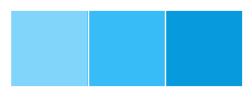

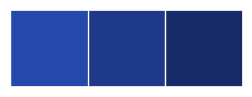

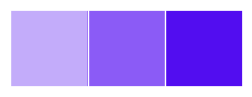

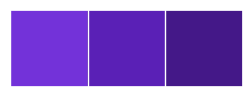

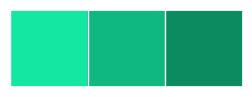

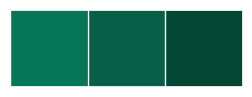

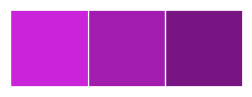

In [4]:
import colorsys
import matplotlib
import seaborn as sns

def scale_lightness(rgb, scale_l):
    rgb = matplotlib.colors.ColorConverter.to_rgb(rgb)
    h, l, s = colorsys.rgb_to_hls(*rgb)
    return colorsys.hls_to_rgb(h, min(1, l * scale_l), s = s)

plot_colors = {k: {
    'light': scale_lightness(v['color'], 1.25),
    'default': scale_lightness(v['color'], 1),
    'dark': scale_lightness(v['color'], 0.75)
} for k, v in databases.items() if 'color' in v}

for k in plot_colors:
    sns.palplot(plot_colors[k].values())

### Set comparison mode

Most plots compare data for only 2 scenarios, where one is "more coordinated" than the other; this cell determines which 2, based on keys in `databases`

In [5]:
# this only affects the file path where images are saved

COMPARISON_MODE = 'lv'           # SET THIS!

if True:  # really should be COMPARISON_MODE == 'two', but not for testing purposes
    uncoordinated_name = 'fully_uncoordinated'            # SET THIS!
    coordinated_name = 'fully_coordinated'              # SET THIS!

    uncoordinated_description = databases[uncoordinated_name]['desc']
    uncoordinated_simulation_database_path = databases[uncoordinated_name]['path']
    uncoordinated_simulation_database_aimsun = databases[uncoordinated_name]['remote_aimsun']
    uncoordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(uncoordinated_simulation_database_path)
    uncoordinated_con = uncoordinated_simulation_results_database.database

    coordinated_description = databases['fully_coordinated']['desc']
    coordinated_simulation_database_path = databases['fully_coordinated']['path']
    coordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(coordinated_simulation_database_path)
    coordinated_con = coordinated_simulation_results_database.database

    to_plot = [uncoordinated_name, coordinated_name]

try:
    to_plot = {
        '100': [
            'fully_uncoordinated_averaged', 'mission_fully_uncoordinated', 
            'mission_partially_uncoordinated_averaged', 'osgood_fully_uncoordinated',
            'osgood_partially_uncoordinated_averaged', 'fully_coordinated_averaged'
        ],
        '200': [
            'fully_uncoordinated_200', 'mission_partially_uncoordinated_200',
            'osgood_partially_uncoordinated_200', 'fully_coordinated_200'
        ],
        'lv': [
            'fully_uncoordinated_averaged', 'fully_coordinated_averaged',
            'lv_mission_nb'
        ]
    }[COMPARISON_MODE]
except:
    pass

database_names = {
    '100': [k for k in databases if '200' not in k],
    '200': [k for k in databases if '200' in k],
    'lv': [
        'fully_uncoordinated', 'fully_uncoordinated_run_two', 
        'fully_uncoordinated_run_three', 'fully_uncoordinated_averaged', 
        'fully_coordinated', 'fully_coordinated_run_two', 
        'fully_coordinated_run_three', 'fully_coordinated_averaged',
        'lv_mission_nb'
    ],
    'two': [uncoordinated_name, coordinated_name]
}[COMPARISON_MODE]

In [6]:
from datetime import datetime
today = datetime.now().strftime("%Y-%m-%d")
image_path = f'C:/Users/prest/Preston/Berkeley/fremont_project/images/{today}'
if COMPARISON_MODE == 'two':
    image_path += f'/{uncoordinated_description} vs {coordinated_description}'
else:
    image_path += '/' + COMPARISON_MODE

if not os.path.exists(image_path):
    os.makedirs(image_path)

with open(image_path + '/description.txt', 'w') as f:
    if COMPARISON_MODE == 'two':
        f.write(
            f"{uncoordinated_description} data from:\n{uncoordinated_simulation_database_path}"
            + f"{coordinated_description} data from:\n{coordinated_simulation_database_path}"
        )
    else:
        paths = '\n'.join([v['path'] for v in databases.values() if 'path' in v])
        f.write(f"Multiple comparison plots, based on the following:\n{paths}")

def save_fig(path, mode='rel'):
    assert mode in ['rel', 'abs']
    if mode == 'rel':
        path = os.path.join(image_path, path)
    folder, filename = os.path.split(path)
    if not os.path.exists(folder):
        os.makedirs(folder)
    if '.' in filename:
        plt.savefig(path, bbox_inches='tight', pad_inches=0)
    else:
        plt.savefig(path + '.png', bbox_inches='tight', pad_inches=0)
        plt.savefig(path + '.pdf', bbox_inches='tight', pad_inches=0)

In [7]:
class Metric:
    def __init__(self, name, desc, unit):
        self.name = name
        self.desc = desc
        self.unit = unit

    def __str__ (self) -> str:
        return f'{self.desc} ({self.unit})'

    def __repr__(self) -> str:
        return f'Metric({str(self.name)}, {str(self.desc)}, {str(self.unit)})'

In [179]:
plusminus = u"\u00B1"
DATA_ROOT = os.path.join(module_path, '../data')

class ResultsDf:
    """Helper class for managing tables of results."""
    def __init__(self, columns=['label', 'mean', 'std'], path=None):
        """
        If `path` is not None, reads the csv from `path`. Otherwise, initializes 
        an empty DataFrame with `columns`.
        """
        if path:
            self.df = pd.read_csv(path)
        else:
            self.df = pd.DataFrame(columns=columns)

    def add(self, **kwargs):
        """Appends a row to self.df. All columns must be specified in kwargs."""
        assert set(kwargs) == set(self.df.columns)
        row = len(self.df)
        for k, v in kwargs.items():
            self.df.loc[row, k] = v

    def save(self, path, transpose=False, file_type='csv', path_type='rel', index_cols=[]):
        """
        Saves self.df to `path`, which must not contain a file type.
        file_type must be in {csv, tex, md, all}.
        """
        if path_type == 'rel':
            path = os.path.join(DATA_ROOT, path)
        folder, filename = os.path.split(path)
        acceptable_file_types = ['csv', 'tex', 'md']
        assert '.' not in filename
        assert file_type in acceptable_file_types + ['all']
        assert path_type in ['rel', 'abs']
        if not os.path.exists(folder):
            os.makedirs(folder)
        if index_cols:
            assert all([c in self.df.columns for c in index_cols])
        
        def write(file_type):
            full_path = f'{path}.{file_type}'
            if file_type == 'csv':
                ResultsDf._transpose(self.df, transpose).to_csv(full_path, index=False)
            else:
                with open(full_path, 'w') as f:
                    if file_type == 'tex':
                        f.write(self.latex(index_cols, transpose))
                    elif file_type == 'md':
                        f.write(self.markdown(transpose))
        if file_type == 'all':
            write('csv'); write('tex'); write('md');
        else:
            write(file_type)

    def latex(self, index_cols, transpose=False):
        return self._display(index_cols, transpose=False, latex=True) \
                   .style \
                   .to_latex(hrules=True) \
                   .replace(plusminus, '$\\pm$') \
                   .replace('_', ' ') \
                   .replace('[c]', '[t]')
    
    def markdown(self, transpose=False):
        return self._display([], transpose, latex=False) \
                   .to_markdown(index=False)
    
    def __str__(self):
        return self.df.__str__()
    
    def _transpose(df, transpose: bool):
        return df.T if transpose else df
    
    def _get_interval_str(mean, std):
        return f'{mean:.2f} {plusminus} {(2*std):.2f}'
    
    def _display(self, index_cols: list, transpose: bool, latex: bool):
        df = deepcopy(self.df)
        if all([c in df.columns for c in ['mean', 'std']]):
            df['interval'] = df.apply(
                lambda row: ResultsDf._get_interval_str(row['mean'], row['std']), axis=1)
            df = df.drop(columns=['mean', 'std'])
        if latex:
            if index_cols == []:
                index_cols = list(df.columns)[:-1]
            df.set_index(index_cols, inplace=True)
        df = ResultsDf._transpose(df, transpose)
        df.rename(columns=str.capitalize, inplace=True)
        return df
    

### Test runs + more setup

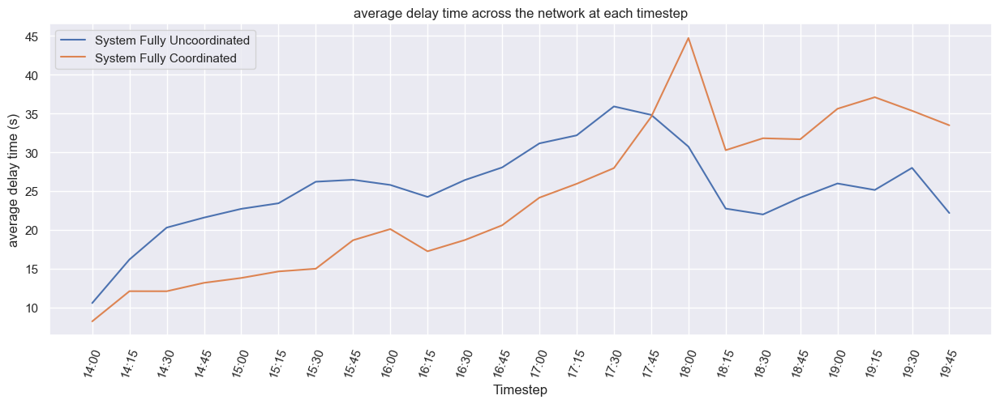

In [9]:
# Select metric to compute.
# Here it is an example of delay time.
metric_name, metric_units = 'average delay time', 's'
uncoordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

coordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    coordinated_simulation_results_database, TIME_INTERVALS)

fig = plt.figure(figsize=(15, 5))
plt.title(f"{metric_name} across the network at each timestep")
plt.xlabel("Timestep")
plt.ylabel(f"{metric_name} ({metric_units})")
plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label=uncoordinated_description)
plt.plot(TIME_INTERVALS_STRING, coordinated_simulated_metric_values, label=coordinated_description)
plt.legend(loc="upper left")
plt.xticks(rotation=70)
plt.show()

In [10]:
import geopandas as gpd

gpd_path = 'C:/Users/prest/Preston/Berkeley/fremont_project/misc'
sections = gpd.read_file(f'{gpd_path}/Data collection copy/Data/Manually made/Network/Map/Aimsun/sections.shp').to_crs('EPSG:3857')
nodes = gpd.read_file(f'{gpd_path}/Data collection copy/Data/Manually made/Network/Map/Aimsun/nodes.shp').to_crs('EPSG:3857')
taz_int = gpd.read_file(f'{gpd_path}/Data collection/Data/Auxiliary/Demand/TAZ_old/Internal/Internal_TAZ.shp').to_crs('EPSG:3857')
centroids = gpd.read_file(f'{gpd_path}/Data collection copy/Data/Manually made/Network/Map/Aimsun/centroids.shp').to_crs('EPSG:3857')

sections_near_mission = gpd.sjoin(sections, gpd.read_file(f'{gpd_path}/Buffer_areas/mission_buffer.shp').to_crs('EPSG:3857'))
sections_near_osgood = gpd.sjoin(sections, gpd.read_file(f'{gpd_path}/Buffer_areas/osgood_buffer.shp').to_crs('EPSG:3857'))
i680_northbound = gpd.read_file(f'{gpd_path}/Links_shp/I680_NB.shp').to_crs('EPSG:3857')
i680_southbound = gpd.read_file(f'{gpd_path}/Links_shp/I680_SB.shp').to_crs('EPSG:3857')
mission_northbound = gpd.read_file(f'{gpd_path}/Links_shp/Mission_NB.shp').to_crs('EPSG:3857')
mission_southbound = gpd.read_file(f'{gpd_path}/Links_shp/Mission_SB.shp').to_crs('EPSG:3857')
osgood_northbound = gpd.read_file(f'{gpd_path}/Links_shp/Osgood_NB.shp').to_crs('EPSG:3857')
osgood_southbound = gpd.read_file(f'{gpd_path}/Links_shp/Osgood_SB.shp').to_crs('EPSG:3857')
paseo_padre_northbound = gpd.read_file(f'{gpd_path}/Links_shp/gmap_alternate_nb.shp').to_crs('EPSG:3857')
paseo_padre_southbound = gpd.read_file(f'{gpd_path}/Links_shp/gmap_alternate_sb.shp').to_crs('EPSG:3857')

i680_sections        = pd.concat([i680_northbound, i680_southbound], keys=['north', 'south']) \
                         .reset_index().rename(columns={'level_0': 'direction'}).drop(columns='level_1')
mission_sections     = pd.concat([mission_northbound, mission_southbound], keys=['north', 'south']) \
                        .reset_index().rename(columns={'level_0': 'direction'}).drop(columns='level_1')
osgood_sections      = pd.concat([osgood_northbound, osgood_southbound], keys=['north', 'south']) \
                         .reset_index().rename(columns={'level_0': 'direction'}).drop(columns='level_1')
paseo_padre_sections = pd.concat([paseo_padre_northbound, paseo_padre_southbound], keys=['north', 'south']) \
                         .reset_index().rename(columns={'level_0': 'direction'}).drop(columns='level_1')

sections

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (-13572344.019 4508460.315, -135723..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (-13572329.348 4508264.159, -135722..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (-13572464.084 4508415.329, -135724..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (-13571458.486 4509669.510, -135714..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (-13571596.214 4509623.139, -135715..."
...,...,...,...,...,...,...,...,...,...,...,...
4428,151597396.0,28550,Fernald Common,1,40.0,600.0,179.0,5,42395.0,NaN,"LINESTRING (-13572473.917 4507663.732, -135724..."
4429,151600599.0,28581,Alice Court,1,40.0,600.0,179.0,5,39784.0,NaN,"LINESTRING (-13575454.502 4513910.059, -135754..."
4430,151616088.0,3425,None,2,104.0,2100.0,175.0,1,56586.0,151616089.0,"LINESTRING (-13574102.042 4511052.704, -135741..."
4431,151616494.0,56150,None,2,72.0,1800.0,177.0,3,56168.0,151616495.0,"LINESTRING (-13574438.360 4511038.633, -135744..."


In [11]:
signalized_nodes = {
    'city-controlled': {
        '27399': ['Washington Boulevard', 'Paseo Padre Parkway'],
        '27553': ['Paseo Parde Parkway', 'Durham Road'],
        '13225': ['Mission Boulevard', 'Washington Boulevard'],
        '27847': ['Mission Boulevard', 'Anza Street'],
        '27869': ['Mission Boulevard', 'Pine Lane'],
        '27889': ['Mission Boulevard', 'Hunter Lane'],
        '27921': ['Mission Boulevard', 'Cougar Drive'],
        '27938': ['Mission Boulevard', 'South Grimmer Boulevard'],
        '27954': ['Mission Boulevard', 'Stanford Ave'],
        '16827': ['Mission Boulevard', 'Paseo Parde Parkway'],
        '56391': ['Washington Boulevard', 'Osgood Road - Driscoll Road'],
        '56129': ['Washington Boulevard', 'Meredith Drive'],
        '56324': ['Paseo Padre Parkway', 'Gomes Road'],
        '56297': ['Paseo Padre Parkway', 'Driscoll Road'],
        '56270': ['Paseo Padre Parkway', 'Chadbourne Drive'],
        '62356': ['Osgood Road', 'Blacow Road'],
        '56418': ['Auto Mall Parkway', 'Osgood Road'],
        '56471': ['Warm Springs Boulevard - Osgood Road', 'S. Grimmer'],
        '45371': ['Warm Springs Boulevard', 'Mission Ct'],
        '56438': ['Warm Springs Boulevard', 'East Warren Avenue'],
        '62346': ['Osgood Road', 'Walmart Driveway'],
        '53579': ['Warm Springs Boulevard', 'Fulton Place'],
        '38460': ['Warm Springs Boulevard', 'Warm Springs Bart'],
        '45004': ['Warm Springs Boulevard', 'Transit Way'],
        '56244': ['Driscoll Road', 'Amapola Drive'],
        '56484': ['East Warren Avenue', 'Fernald Street']
    },
    'state-controlled': {
        '42160': ['Mission Boulevard', 'Esparito Avenue - Ondina Drive'],
        '56218': ['Mission Boulevard', 'Driscoll Road'],
        '27479': ['Mission Boulevard', 'Palm Ave'],
        '56451': ['Mission Boulevard', 'Warm Springs Boulevard'],
        '62795': ['Mission Boulevard', 'Mohave Drive'],
        '27796': ['Mission Boulevard', 'I-680 Southbound Ramp'],
        '27816': ['Mission Boulevard', 'I-680 Northbound Ramp - Mission Road'],
        '27327': ['Washington Boulevard', 'I-680 Southbound Ramp'],
        '27345': ['Washington Boulevard', 'I-680 Nouthbound Ramp - Luzon Drive'],
        '56173': ['Durham Road', 'I-680 Southbound Ramp'],
        '27711': ['Durham Road', 'I-680 Northbound Ramp'],
    }
}

In [12]:
node_geo_city = nodes[nodes['eid'].isin(signalized_nodes['city-controlled'].keys())]
node_geo_state = nodes[nodes['eid'].isin(signalized_nodes['state-controlled'].keys())]
node_geo_combined = pd.concat([node_geo_city, node_geo_state])

In [13]:
buffer_area_path = 'C:/Users/prest/Preston/Berkeley/fremont_project/misc/Buffer_areas/Jan2023'
buffer_distances = [100, 200, 300, 400, 500, 1000, 1500]
mission_buffer, osgood_buffer = {}, {}

for d in buffer_distances:
    mission_polygon = gpd.read_file(
        os.path.join(buffer_area_path, f'mission_buffer_{d}.shp')).to_crs('EPSG:3857')
    osgood_polygon = gpd.read_file(
        os.path.join(buffer_area_path, f'mission_buffer_{d}.shp')).to_crs('EPSG:3857')
    mission_buffer[d] = {
        'polygon': mission_polygon, 
        'sections': gpd.sjoin(sections, mission_polygon),
        'nodes': gpd.sjoin(node_geo_combined, mission_polygon)
    }
    osgood_buffer[d] = {
        'polygon': osgood_polygon, 
        'sections': gpd.sjoin(sections, osgood_polygon),
        'nodes': gpd.sjoin(node_geo_combined, osgood_polygon)
    }

Altered nodes

In [14]:
all_uncoordinated = [int(k) for k in node_geo_combined['eid']]
mission_partially_uncoordinated = [16827, 27954, 27938, 27921]
mission_all_uncoordinated = [56451, 62795, 16827, 27954, 27938, 27921, 27889, 27869, 27847, 13225, 27816, 27796, 27479, 56218, 42160]
osgood_partially_uncoordinated = [56391, 56418, 62346, 62356]
osgood_all_uncoordinated = [56438, 56451, 45371, 53579, 38460, 45004, 56471, 62346, 56418, 62356, 56391, 56297, 56244, 56218]
all_coordinated = []

for k in databases:
    if 'mission_fully' in k:
        databases[k]['uncoordinated_nodes'] = mission_all_uncoordinated
    elif 'mission_partially' in k:
        databases[k]['uncoordinated_nodes'] = mission_partially_uncoordinated
    elif 'osgood_fully' in k:
        databases[k]['uncoordinated_nodes'] = osgood_all_uncoordinated
    elif 'osgood_partially' in k:
        databases[k]['uncoordinated_nodes'] = osgood_partially_uncoordinated
    elif 'fully_uncoordinated' in k:
        databases[k]['uncoordinated_nodes'] = all_uncoordinated
    else:
        databases[k]['uncoordinated_nodes'] = all_coordinated

databases

{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'path': 'C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_220914/uncoordinated.sqlite',
  'remote_aimsun': 'network_no_offsets_working.ang',
  'uncoordinated_nodes': [13225,
   16827,
   27399,
   27553,
   27847,
   27869,
   27889,
   27921,
   27938,
   27954,
   38460,
   45004,
   45371,
   53579,
   56129,
   56244,
   56270,
   56297,
   56324,
   56391,
   56418,
   56438,
   56471,
   56484,
   62346,
   62356,
   27327,
   27345,
   27479,
   27711,
   27796,
   27816,
   42160,
   56173,
   56218,
   56451,
   62795]},
 'fully_uncoordinated_run_two': {'desc': 'System Fully Uncoordinated',
  'path': 'C:/Users/prest/Preston/Berkeley/fremont_project/databases/preston_221007/uncoordinated_1845330897.sqlite',
  'remote_aimsun': 'network_no_offsets_working.ang',
  'uncoordinated_nodes': [13225,
   16827,
   27399,
   27553,
   27847,
   27869,
   27889,
   27921,
   27938,
   27954,
   38460,
   4500

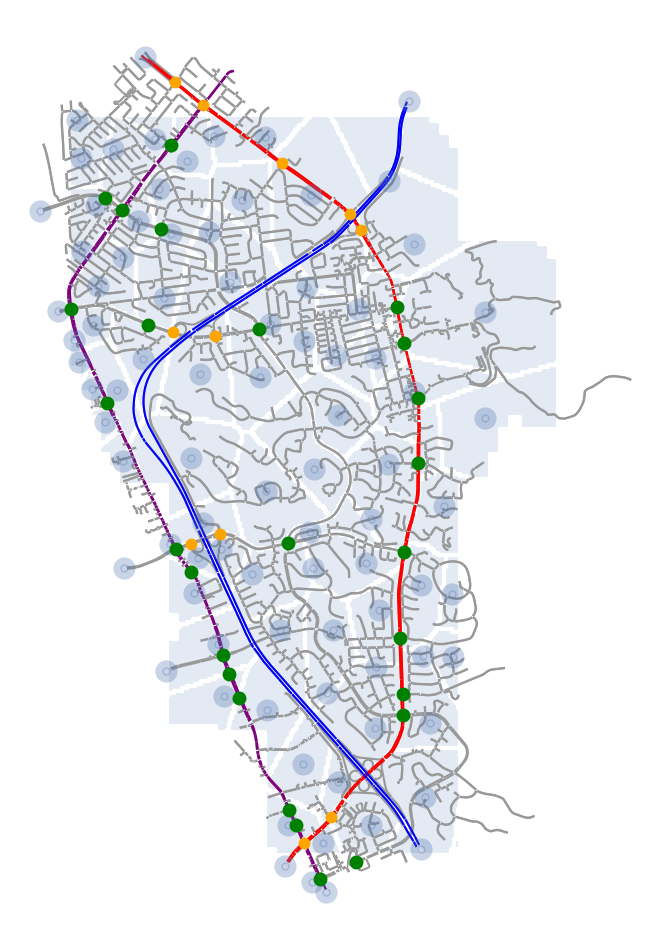

In [15]:
from matplotlib_scalebar.scalebar import ScaleBar
fig, ax = plt.subplots(1, 1, figsize=(10, 12))

# comment the following section to toggle tilemapbase
# import tilemapbase
# tilemapbase.start_logging()
# tilemapbase.init(create=True)
# extent = tilemapbase.extent_from_frame(sections, buffer=25)
# plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=400)
# plotter.plot(ax)

taz_int.plot(ax=ax, alpha=0.15, zorder=1)
taz_int.boundary.plot(ax=ax, lw=3, color='white', zorder=2)
sections.plot(ax=ax, color='0.6', zorder=3)
mission_sections.plot(ax=ax, color='red', zorder=4)
osgood_sections.plot(ax=ax, color='purple', zorder=4)
i680_sections.plot(ax=ax, color='blue', zorder=4)
centroids.plot(ax=ax, lw=10, alpha=0.3, zorder=5)
node_geo_city.plot(ax=ax, lw=4, color='green', zorder=6)
node_geo_state.plot(ax=ax, lw=2.5, color='orange', zorder=6)
# mission = nodes[nodes['eid'].isin(np.array(mission_partially_uncoordinated).astype(str))]
# osgood = nodes[nodes['eid'].isin(np.array(osgood_partially_uncoordinated).astype(str))]
# mission.plot(ax=ax, lw=4, color='red', zorder=7)
# osgood.plot(ax=ax, lw=4, color='purple', zorder=7)
ax.axis('off')

save_fig('C:/Users/prest/Preston/Berkeley/fremont_project/images/signalized_nodes', 'abs')
plt.show()

In [16]:
def remove_unnamed(df):
    return df.loc[:, ~df.columns.str.contains('^Unnamed')]

In [17]:
data_path = f'C:/Users/prest/Preston/Berkeley/fremont_project/processed_data'

def unpack_databases(category, preprocessor=lambda df: df, drop_non_average=False,
                     from_scratch=False, overwrite=False):
    """
    Unpacks the databases of type `category` in `databases` according to COMPARISON_MODE.
    Applies `preprocessor` before saving.
    
    Careful with `overwrite`: there is no way to restore previous versions.

    TODO: implement `drop_non_average`
    """
    unpacked_databases = {}
    try:
        merge_on = {
            'MISYS': ['ent', 'sid'],
            'MISECT': ['ent', 'sid', 'eid'],
            'MICENT_O': ['ent', 'sid', 'eid', 'destination'],
            'MISYSIEM': ['ent', 'sid'],
            'HCMMIAPPROACH': ['ent', 'eid'],
            'Rgap': ['ent']
        }[category]
    except:
        raise ValueError(f'{category} is invalid category')
    averaged = '_averaged'

    if overwrite is False:
        overwrite = []
    elif overwrite is True:
        overwrite = database_names
    if from_scratch and drop_non_average:
        raise ValueError('Cannot drop non-averages when unpacking from scratch')

    def get_path(scenario):
        return os.path.join(data_path, category, f'{scenario}.csv.gz')

    def save_csv(scenario, data: pd.DataFrame):
        path = get_path(scenario)
        folder, _ = os.path.split(path)
        if not os.path.exists(folder):
            os.makedirs(folder)
        data.to_csv(path, compression='gzip', index=False)
    
    with tqdm(total=len(database_names)) as pbar:
        # Pass 1: load existing data
        if not from_scratch:
            for scenario in database_names:
                if scenario not in overwrite:
                    path = get_path(scenario)
                    if os.path.exists(path):
                        pbar.set_postfix({'scenario': scenario})
                        desc = databases[scenario]['desc']
                        data = pd.read_csv(path, compression='gzip')
                        unpacked_databases[scenario] = {'desc': desc, 'database': data}
                        pbar.update(1)

        # Pass 2: handle non-averaged
        for scenario in database_names:
            if not scenario in unpacked_databases and not scenario.endswith(averaged):
                pbar.set_postfix({'scenario': scenario})
                desc, path = databases[scenario]['desc'], databases[scenario]['path']
                data = postprocessing_util.AimsunMicroOutputDatabase(path).database
                data = pd.read_sql(f'SELECT * FROM {category}', data)
                data = preprocessor(pd.DataFrame(data))
                unpacked_databases[scenario] = {'desc': desc, 'database': data}
                save_csv(scenario, data)
                pbar.update(1)
        
        # Pass 3: handle averages
        for scenario in database_names:
            if not scenario in unpacked_databases and scenario.endswith(averaged):
                pbar.set_postfix({'scenario': scenario})
                prefix = scenario[:-len(averaged)]
                corresponding_scenarios = [k for k in unpacked_databases if k.startswith(prefix)]
                assert len(corresponding_scenarios) > 0, f'Provide at least one database to aggregate for {scenario}'
                desc = databases[corresponding_scenarios[0]]['desc']
                corresponding_data = [unpacked_databases[k]['database'] for k in corresponding_scenarios]
                data = pd.DataFrame(pd.concat(corresponding_data))
                data = preprocessor(data.groupby(merge_on).mean().reset_index())
                data = remove_unnamed(data)
                unpacked_databases[scenario] = {'desc': desc, 'database': data}
                save_csv(scenario, data)
                pbar.update(1)

        for scenario in unpacked_databases:
            df = unpacked_databases[scenario]['database']
            if 'eid' in df.columns:
                df['eid'] = df['eid'].astype(str)
            unpacked_databases[scenario]['database'] = remove_unnamed(df)

    return unpacked_databases

In [18]:
if COMPARISON_MODE == 'two':
    print(uncoordinated_description + ' vs ' + coordinated_description)
else:
    print(COMPARISON_MODE)
print(image_path)

lv
C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-04-05/lv


### RUN ABOVE THIS CELL

In [18]:
### Run above this cell

<a id='system'></a>
# System Data

See [sys/hcm](#patched-syshcm-graphs) for graphs.

In [29]:
sys_metrics = {
    'sid': Metric('sid', 'Vehicle type', None),
    'ent': Metric('ent', 'Time interval', None),
    'density': Metric('density', 'Density', 'veh/km'),
    'flow': Metric('flow', 'Mean flow', 'veh/h'),
    'ttime': Metric('ttime', 'Mean travel time', 's/km'),
    'dtime': Metric('dtime', 'Mean delay time', 's/km'),
    'speed': Metric('speed', 'Mean speed', 'km/h'),
    'qmean': Metric('qmean', 'Mean vehicles in queue', 'veh'),
    'fuelc': Metric('fuelc', 'Total fuel consumed', 'L'),
    'batteryc': Metric('batteryc', 'Total battery consumed', 'kWh'),
    'travel': Metric('travel', 'Total distance traveled by exited vehicles', 'km')
}

sys_column_names = sys_metrics.keys()
group_columns = ['sid', 'ent']

def preprocess_sys(df):
    return df[(df['ent']!=0) & (df['sid']==0)]

<a id='section'></a>
# Section Data

In [30]:
section_metrics = {
    'flow': Metric('flow', 'Mean Flow', 'veh/h'),
    'ttime': Metric('ttime', 'Mean Travel Time', 's'),
    'dtime': Metric('dtime', 'Mean Delay Time', 's'),
    'speed': Metric('speed', 'Mean Speed', 'km/h'),
    'density': Metric('density', 'Density by Lane', 'veh/km'),
    'travel': Metric('travel', 'Travel Distance by Section', 'km'),
    'count': Metric('count', 'Vehicle Count', 'veh')
}

In [37]:
# dfs_section = {'uncoordinated': uncoordinated_section_df, 'coordinated': coordinated_section_df}
null_values = {'eid': None, 'ent': None, 'count': 0}
section_df_cols = set(section_metrics).union(null_values)
group_cols = ['ent', 'eid']

def preprocess_sections(df):
    df = df.filter(items=section_df_cols).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df.groupby(group_cols).mean()

# for k in dfs_section:
#     dfs_section[k] = preprocess_sections(dfs_section[k])

# dfs_section['uncoordinated']

In [31]:
# section_df = dfs_section['uncoordinated'].join(dfs_section['coordinated'], 
#     on=group_cols, lsuffix='_uncoordinated', rsuffix='_coordinated').dropna().groupby('eid').mean()
# for col in section_metrics:
#     section_df[f'{col}_ratio'] = section_df[f'{col}_uncoordinated'] / section_df[f'{col}_coordinated']

# section_df = section_df.merge(sections[['eid', 'func_class', 'geometry']], left_index=True, right_on='eid').set_index('eid')
# section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
# frame = section_df.to_crs("EPSG:3857")

# frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
# frame['log_flow_coordinated'] = np.log(frame['flow_coordinated'])
# log_flow = Metric('log_flow', 'Logarithm of mean flow', 'veh/h')

# frame

In [32]:
# fig, axs = plt.subplots(1, 5, figsize=(30, 9))
# fig.suptitle('Relative section data aggregated over time')
# for i in range(5):
#     ax, metric = axs[i], list(section_metrics.values())[i]
#     frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
#     node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
#     ax.set_title(metric.desc)
#     ax.axis('off')

# plt.subplots_adjust(wspace=-0.5)
# save_fig('misc/sections.png')
# plt.show()

### Functional class

In [33]:
func_classes = [1, 2, 3, 5]
clip_at = {
    'flow': {'x': (0, 2500), 'y': (0, 0.025)},
    'ttime': {'x': (0, 100), 'y': (0, 0.1)},
    'dtime': {'x': (0, 40), 'y': (0, 0.45)},
    'speed': {'x': (0, 150), 'y': (0, 0.12)},
    'density': {'x': (0, 40), 'y': (0, 0.45)},
    'travel': {'x': (0, 100), 'y': (0, 0.3)},
    'count': {'x': (0, 1000), 'y': (0, 0.02)}
}

# for k in section_metrics:
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
#     fig.suptitle(section_metrics[k].desc + ' by Functional Class')
#     ax1.set_title(uncoordinated_description)
#     ax2.set_title(coordinated_description)

#     for func_class in func_classes:
#         subset = frame[frame['func_class'] == func_class].reset_index()
#         sns.kdeplot(subset[k+'_uncoordinated'], shade=True, label=func_class, ax=ax1)
#         sns.kdeplot(subset[k+'_coordinated'], shade=True, label=func_class, ax=ax2)
    
#     for ax in (ax1, ax2):
#         ax.legend(title='Functional Class')
#         ax.set_xlabel(f'{section_metrics[k].desc} ({section_metrics[k].unit})')
#         ax.set_ylabel('Density')
#         ax.set_xlim(clip_at[k]['x'])
#         ax.set_ylim(clip_at[k]['y'])
    
#     save_fig(f'functional-class-overall/{k}.png')
#     plt.close()

**[DEPRECATED] Cut-through traffic analysis**

See the remark on overleaf.

~~We use the same metric for self-comparison as in the multiple comparison plots below:~~
$$g(s_0, t_0) := \frac{f(s_0, t_0)}{\left(\frac 1{|S|} \sum_s f(s, t_0)\right)^\gamma \cdot \left(\frac 1{|T|} \sum_t f(s_0, t)\right)^{1-\gamma}}$$
~~where $f$ denotes flow and $\gamma$ is selected such that $\sum_{s,t} g(s,t) = |S| \cdot |T|$. Then, let~~
$$G(c, t) = \sum_{s \in \textsf{functional class }c} g(s, t)$$
~~denote the "relative use of class $c$ at time $t$." We will evaluate $G(c, t)$ for fixed $c$ and varying $t$ for the two scenarios.~~

In [ ]:
# uncoordinated_cut_through = preprocess_sections(uncoordinated_section_df).reset_index()[['ent', 'eid', 'flow']]
# coordinated_cut_through = preprocess_sections(coordinated_section_df).reset_index()[['ent', 'eid', 'flow']]
# cut_through = uncoordinated_cut_through.merge(coordinated_cut_through, on=['ent', 'eid'], suffixes=['_uncoordinated', '_coordinated'])
# cut_through = cut_through[cut_through['ent']!=0]
# # print(cut_through.head())

# cut_through_by_ent = cut_through.groupby('ent').mean().reset_index()
# cut_through_by_eid = cut_through.groupby('eid').mean().reset_index().drop(columns='ent')
# cut_through_by_ent['key'] = 'key'
# cut_through_by_eid['key'] = 'key'
# cut_through = cut_through.merge(
#     cut_through_by_ent.merge(cut_through_by_eid, how='outer', on='key', suffixes=['_ent', '_eid']).drop(columns='key'),
#     on=['ent', 'eid'])

# # for tengamma in range(0, 21):
# #     gamma = tengamma / 20
# #     for suf in ['uncoordinated', 'coordinated']:
# #         cut_through[f"flow_{suf}_ratio"] = cut_through[f"flow_{suf}"] / \
# #             (cut_through[f"flow_{suf}_eid"]**gamma * cut_through[f"flow_{suf}_ent"]**(1-gamma))
# #         fig, ax = plt.subplots()
# #         plt.plot(ax=ax, data=cut_through[f"flow_{suf}_ratio"], bins=30)
# #         ax.set_title(gamma)
# #         plt.show()

# # print(cut_through[f"flow_{suf}_eid"].mean(), cut_through[f"flow_{suf}_ent"].mean())
#         # print(f"{suf}, gamma={gamma}: {(cut_through[f'flow_{suf}_eid']**gamma).mean()}, {(cut_through[f'flow_{suf}_ent']**(1-gamma)).mean()}")
#         # print(f"{suf}, gamma={gamma}: {cut_through[f'flow_{suf}_ratio'].mean()}")

KeyboardInterrupt: 

In [ ]:
from matplotlib import animation
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def cut_through_analysis():
    if metric in ['flow', 'speed']:
        cmap = 'coolwarm_r'
    else:
        cmap = 'coolwarm'
    metric = section_metrics[metric]
    if metric.name == 'density':
        desc = 'Density by Lane'
    else:
        desc = ' '.join(metric.desc.split(' ')[1:])
    print(desc)
    if isinstance(which, str):
        which = [which]
    fig, axs = plt.subplots(1, len(which) + 1, figsize=(5*(len(which)+1), 10), gridspec_kw={'width_ratios': [50]*len(which)+[2]})
    norm = Normalize(vmin=0, vmax=2)
    cb = ColorbarBase(axs[-1], cmap=cmap, norm=norm, orientation='vertical')
    axs[-1].tick_params(labelsize=16)

    plot_databases = {}
    for name in which:
        scenario_desc = unpacked_databases_sect[name]['desc']
        data = unpacked_databases_sect[name]['database']
        data = data[data['ent']!=0]
        data_by_eid = data.groupby('eid').mean().reset_index()
        data_by_ent = data.groupby('ent').mean().reset_index()
        data_by_eid['key'] = 'key'
        data_by_ent['key'] = 'key'
        eid_ent_prod = data_by_eid.merge(data_by_ent, how='outer', on='key', suffixes=['_eid', '_ent']).dropna()
        eid_ent_prod.drop(columns=['ent_eid', 'key'], inplace=True)
        eid_ent_prod.rename({'ent_ent': 'ent'}, axis=1, inplace=True)
        data = data.merge(eid_ent_prod, on=['eid', 'ent'])
        data['ratio'] = data[metric.name] / (data[metric.name+'_eid']**(1-gamma) * data[metric.name+'_ent']**gamma)
        data = gpd.GeoDataFrame(data.merge(sections[['eid', 'geometry']], on='eid'), geometry='geometry')
        plot_databases[name] = {'desc': scenario_desc, 'data': data}

    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        frame_title = f'Normalized (gamma={gamma}) {desc} Over Time: {TIME_INTERVALS_STRING[timestep - 1]}'
        if len(which) == 1:
            frame_title = f"{plot_databases[which[0]]['desc']}, {frame_title}"
        fig.suptitle(frame_title, size=22)
        ims = []

        for i in range(len(which)):
            ax, scenario_desc, data = axs[i], plot_databases[which[i]]['desc'], plot_databases[which[i]]['data']
            affected_nodes = node_geo_city[node_geo_city['id'].isin(databases['fully_coordinated_averaged']['uncoordinated_nodes'])]
            sections.plot(ax=ax, color='0.8', zorder=-1)
            data[data['ent'] == timestep].plot(
                ax=ax, column='ratio', cmap=cmap, lw=2, vmin=0, vmax=2, zorder=0)
            if affected_nodes.shape[0]:
                affected_nodes.plot(ax=ax, color='black', lw=2, zorder=2, marker='s')
            ims.append(node_geo_city.plot(ax=ax, color='0.3', lw=2, zorder=1))
            if len(which) > 1:
                ax.set_title(scenario_desc, size=22)
            ax.axis('off')

        return ims

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.6)
    self_animation_path = f"{image_path}/{'_'.join(which)}"
    if not os.path.exists(self_animation_path):
        os.makedirs(self_animation_path)
    anim.save(f"{self_animation_path}/{metric.name}_self-comparison.gif", writer=writergif)

Multicomparison

In [ ]:
unpacked_databases_sect = unpack_databases('MISECT', preprocess_sections)
col_renamer = lambda suffix: lambda x: x + '_' + suffix if x not in ['eid', 'ent'] else x

import functools as ft
multi_frame = [unpacked_databases_sect[k]['database'] \
                 .groupby('eid').mean().reset_index().drop(columns=['ent']) \
                 .rename(columns=col_renamer(k)) \
               for k in to_plot]
multi_frame = ft.reduce(lambda left, right: pd.merge(left, right, on='eid'), multi_frame)
multi_frame = gpd.GeoDataFrame(multi_frame.merge(sections, left_on='eid', right_on='id'))

def func_class_multi_plot(mode):
    """mode in [violin, strip]"""
    def expand_lim(lim, low_by, high_by):
        return [lim[0] - low_by*(lim[1]-lim[0])/2, lim[1] + high_by*(lim[1]-lim[0])]

    func_class_desc = {
        1: 'Interstates',
        2: 'Arterials',
        3: 'Collectors',
        5: 'Local Roads'
    }

    plot_colors_light = [plot_colors[k]['light'] for k in to_plot]
    plot_colors_dark = [plot_colors[k]['dark'] for k in to_plot]
    labels = [databases[k]['desc'].replace(' ', '\n')
                                  .replace('Mission\nBlvd', 'Mission Blvd')
                                  .replace('Osgood\nRoad', 'Osgood Road') 
              for k in to_plot]

    for k in tqdm(section_metrics):
        for func_class in func_classes:
            subset = multi_frame[multi_frame['func_class']==func_class]
            for scenario in to_plot:
                subset[scenario] = subset[f"{k}_{scenario}"]

            fig, ax = plt.subplots(1, 1, figsize=(2*len(to_plot), 5))
            fig.suptitle(f"{section_metrics[k].desc} ({section_metrics[k].unit}), {func_class_desc[func_class]}", size=22)

            if mode == 'violin':
                sns.violinplot(data=subset[to_plot], ax=ax, cut=2)
            if mode == 'strip':
                sns.boxplot(data=subset[to_plot], ax=ax, saturation=0.6, showfliers=False)
                ylims = ax.get_ylim()
                sns.boxplot(data=subset[to_plot], ax=ax, palette=plot_colors_light) # stupid way to show outliers
                sns.stripplot(data=subset[to_plot], ax=ax, size=10, palette=plot_colors_dark, alpha=0.15)
                ax.set_ylim(expand_lim(ylims, 0.2, 0.4))
                ax.set_xticklabels(labels)
            for ticklabel in ax.get_xticklabels() + ax.get_yticklabels():
                ticklabel.set_fontsize(16)
            
            save_fig(f'functional-class-multi/{func_class}-{k}-{mode}.png')
            plt.close()

func_class_multi_plot('strip')

100%|██████████| 7/7 [00:04<00:00,  1.50it/s]


### Route analysis

#### `ext_1` to `ext_9` travel time

We compare Mission Blvd with:
* Osgood Road: from the southern intersection to the northern intersection
* I-680: from the southern off-ramp to the northern on-ramp

<AxesSubplot:>

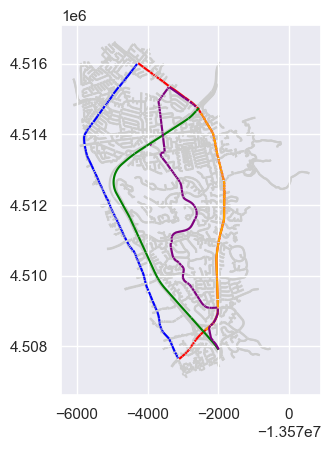

In [ ]:
road_comp_extra = {
    'mission_nb_past_osgood': [
        '30451', '31086', '35201', '35200', '35372', '35374', '32021'
    ],
    'osgood_nb_past_mission': [
        '35641', '35408', '30370', '35639', '35630', '28613', '28614', '36398', 
        '36399'
    ],
    'mission_nb_past_i680': [
        '30451', '31086', '35201', '35200', '30550', '30551', '30552', '30553', 
        '35202', '35203', '35204', '35205', '35207', '35208', '36289', '8535', 
        '7184', '7185', '9184', '3277', '7438', '7439', '7762', '7415', '7617', 
        '4872', '3858',  '27477', '55771', '55776', '35620', '35622', '35623', 
        '35624', '35375', '35372', '35374', '32021'
    ],
    'i680_nb_past_mission': [
        '3400', '2752', '2879'
    ],
    'paseo_padre_past_i680': [
        '3400', '2752', '4873', '7137', '266', '7136', '2881', '2879'
    ]
}

road_comp = {
    'mission_nb_vs_osgood': mission_northbound[~mission_northbound['eid'].isin(
        road_comp_extra['mission_nb_past_osgood'])],
    'osgood_nb_vs_mission': osgood_northbound[~osgood_northbound['eid'].isin(
        road_comp_extra['osgood_nb_past_mission'])],
    'mission_nb_vs_i680': mission_northbound[~mission_northbound['eid'].isin(
        road_comp_extra['mission_nb_past_i680'])],
    'i680_nb_vs_mission': i680_northbound[~i680_northbound['eid'].isin(
        road_comp_extra['i680_nb_past_mission'])],
    'paseo_padre_nb_vs_mission': paseo_padre_northbound[~paseo_padre_northbound['eid'].isin(
        road_comp_extra['paseo_padre_past_i680'])],
}

fig, ax = plt.subplots()
sections.plot(ax=ax, color='0.8', zorder=0)
road_comp['mission_nb_vs_osgood'].plot(color='red', ax=ax, zorder=1)
road_comp['osgood_nb_vs_mission'].plot(color='blue', ax=ax, zorder=1)
road_comp['mission_nb_vs_i680'].plot(color='orange', ax=ax, zorder=2)
road_comp['i680_nb_vs_mission'].plot(color='green', ax=ax, zorder=2)
road_comp['paseo_padre_nb_vs_mission'].plot(color='purple', ax=ax, zorder=2)

In [ ]:
def compare_roads(roads, folder_name):
    road_data = {}
    for scenario in to_plot:
        df = unpacked_databases_sect[scenario]['database']
        df = df[df['ent']!=0]
        road_data[scenario] = {
            road: df[df['eid'].astype(str).isin(road_comp[road]['eid'])].groupby('ent').sum()
            for road in roads
        }

    for metric in tqdm(section_metrics):
        fig, axs = plt.subplots(1, len(to_plot), figsize=(6*len(to_plot), 4))
        combined = pd.concat([road_data[scenario][road][metric] 
                              for scenario in to_plot for road in roads])
        ymin, ymax = combined.min(), combined.max()
        for i in range(len(to_plot)):
            scenario = to_plot[i]
            ax = axs[i]
            for road in roads:
                ax.plot(TIME_INTERVALS_STRING, 
                        road_data[scenario][road][metric],
                        label=road)
            ax.set_title(unpacked_databases_sect[scenario]['desc'])
            ax.set_ylim(ymin - 0.2 * (ymax - ymin), ymax + 0.2 * (ymax - ymin))
            ax.set_xticks(np.arange(len(TIME_INTERVALS_STRING)))
            ax.set_xticklabels(TIME_INTERVALS_STRING, rotation=70)
            ax.legend(loc='upper right')
        fig.suptitle(f'{section_metrics[metric].desc} ({section_metrics[metric].unit})', size=18)
        save_fig(f'compare-road/{folder_name}/{metric}')
        plt.close()

compare_roads(['mission_nb_vs_osgood', 'osgood_nb_vs_mission'], 
              'mission_osgood_nb')
compare_roads(['mission_nb_vs_i680', 'i680_nb_vs_mission', 'paseo_padre_nb_vs_mission'], 
              'mission_i680_paseopadre_nb')

100%|██████████| 7/7 [00:18<00:00,  2.65s/it]


#### Comparison of routes from `ext_9` to `ext_1` due to varied route choice in `fully_coordinated`

In [ ]:
routes = {
    1: ['151597063','151597067','151597070','2878','151627627','7154','2792','151597082','2793','8529','2889','267','35185','35189','30874','30875','30876','30877','30878','30879','35183'],
    2: ['253','257','151616494','56150','35417','35585','35579','35563','35585','35575','35585','35569','35571','35561','30671','35433','35432','35431','35430','35429','35428','30690','35483','35482','35463','30691','36360','37081','37086','36322','36323','36359','36347','31984','36329','36339','36335','36341','36342','36343','30630','30631','30632','35525','30640','36284','35488','35490','30376','30377','35631','35637'],
    3: ['253','7088','2759','7214','2757','7200','8608','8609','8610','7515','8524','8523','2893','8515','8514','8512','2894','2895','2896','7648','7645','7646','7647','8555','8554','7105','7106','7100','7102','7099','7512','7513','7514','7506','3749','3757','2770','7163','7173','7167','35185','35189','30874','30875','30876','30877','30878','30879','35183'],
    4: ['253','7088','2759','7214','2757','7200','8608','8609','8610','7515','1579','1578','1580','1581','1582','1583','1515','1514','1513','1512','1511','1510','1509','1508','7661','7662','7645','7646','7647','8555','8554','7105','7106','7100','7102','7099','7512','7513','7514','7506','3749','3757','2770','7163','7173','7167','35185','35189','30874','30875','30876','30877','30878','30879','35183'],
    5: ['253','7088','2759','7214','2757','7200','8608','8609','8610','7515','1579','1578','1580','1581','1582','1583','1488','2894','2895','2896','7648','7645','7646','7647','8555','8554','7105','7106','7100','7102','7099','7512','7513','7514','7506','3749','3757','2770','7163','7173','7167','35185','35189','30874','30875','30876','30877','30878','30879','35183'],
    6: ['253','7088','2759','7214','2757','7200','8608','8609','8610','7515','1579','1578','1580','1581','1582','1583','1515','1514','1513','1512','1511','1510','1509','1508','30203','35469','37094','30691','36360','37081','37086','36322','36323','36359','36347','31984','36329','36339','36335','36341','36342','36343','30630','30631','30632','35525','30640','36284','35488','35490','30376','30377','35631','35637']
}

route_sections = {
    253: {'desc': 'I-680/auto mall off ramp', 'length': 268, 'speed-limit': 104},
    257: {'desc': 'I-680/auto mall off ramp wb', 'length': 44, 'speed-limit': 104},
    7088: {'desc': 'I-680/auto mall off ramp eb', 'length': 54, 'speed-limit': 104},
    151597063: {'desc': 'I-680 sb adjacent to auto mall pkwy off ramp', 'length': 66, 'speed-limit': 104},
    151597067: {'desc': 'I-680 south of prev', 'length': 106, 'speed-limit': 104},
    151597070: {'desc': 'I-680 south of prev', 'length': 46, 'speed-limit': 104},
    2878: {'desc': 'I-680 south of prev', 'length': 172, 'speed-limit': 104},
    151627627: {'desc': 'I-680 south of prev', 'length': 330, 'speed-limit': 104},
    7154: {'desc': 'I-680 south of prev', 'length': 353, 'speed-limit': 104},
    2792: {'desc': 'I-680 south of prev', 'length': 44, 'speed-limit': 104},
    151597082: {'desc': 'I-680 south of prev', 'length': 536, 'speed-limit': 104},
    2793: {'desc': 'I-680 south of prev', 'length': 181, 'speed-limit': 104},
    8529: {'desc': 'I-680 sb adjacent to mission off ramp', 'length': 149, 'speed-limit': 104},
    2889: {'desc': 'I-680/mission off ramp part 1', 'length': 295, 'speed-limit': 104},
    267: {'desc': 'I-680/mission off ramp part 2', 'length': 473, 'speed-limit': 40},
    151616494: {'desc': 'auto mall wb adj west I-680', 'length': 17, 'speed-limit': 72},
    56150: {'desc': 'auto mall wb adj east osgood / west of prev', 'length': 87, 'speed-limit': 72},
    2759: {'desc': 'auto mall eb adj east I-680', 'length': 106, 'speed-limit': 72},
    7214: {'desc': 'auto mall eb east of prev', 'length': 8, 'speed-limit': 64},
    2757: {'desc': 'durham east of prev', 'length': 27, 'speed-limit': 64},
    7200: {'desc': 'durham east of prev', 'length': 48, 'speed-limit': 64},
    8608: {'desc': 'durham east of prev', 'length': 33, 'speed-limit': 64},
    8609: {'desc': 'durham east of prev', 'length': 89, 'speed-limit': 64},
    8610: {'desc': 'durham east of prev', 'length': 284, 'speed-limit': 64},
    7515: {'desc': 'durham adj west arapaho / east of prev', 'length': 87, 'speed-limit': 64},
    8524: {'desc': 'durham east of prev', 'length': 24, 'speed-limit': 64},
    8523: {'desc': 'durham adj west paseo padre / east of prev', 'length': 99, 'speed-limit': 64},
    35417: {'desc': 'osgood adj south of auto mall', 'length': 58, 'speed-limit': 64},
    35585: {'desc': 'osgood south of prev', 'length': 26, 'speed-limit': 64},
    35579: {'desc': 'osgood south of prev', 'length': 26, 'speed-limit': 64},
    35563: {'desc': 'osgood south of prev', 'length': 34, 'speed-limit': 64},
    35585: {'desc': 'osgood south of prev', 'length': 26, 'speed-limit': 64},
    35575: {'desc': 'osgood south of prev', 'length': 29, 'speed-limit': 64},
    35585: {'desc': 'osgood south of prev', 'length': 26, 'speed-limit': 64},
    35569: {'desc': 'osgood south of prev', 'length': 54, 'speed-limit': 64},
    35571: {'desc': 'osgood south of prev', 'length': 22, 'speed-limit': 64},
    35565: {'desc': 'osgood south of prev', 'length': 12, 'speed-limit': 64},
    35561: {'desc': 'osgood south of prev', 'length': 30, 'speed-limit': 64},
    30671: {'desc': 'osgood south of prev', 'length': 27, 'speed-limit': 64},
    35413: {'desc': 'osgood south of prev', 'length': 28, 'speed-limit': 64},
    35433: {'desc': 'osgood south of prev', 'length': 17, 'speed-limit': 64},
    35432: {'desc': 'osgood south of prev', 'length': 13, 'speed-limit': 64},
    35431: {'desc': 'osgood south of prev', 'length': 67, 'speed-limit': 64},
    35430: {'desc': 'osgood south of prev', 'length': 19, 'speed-limit': 64},
    35429: {'desc': 'osgood south of prev', 'length': 40, 'speed-limit': 64},
    35428: {'desc': 'osgood south of prev', 'length': 90, 'speed-limit': 64},
    30690: {'desc': 'osgood south of prev', 'length': 48, 'speed-limit': 64},
    35483: {'desc': 'osgood south of prev', 'length': 44, 'speed-limit': 64},
    35482: {'desc': 'osgood south of prev', 'length': 83, 'speed-limit': 64},
    35463: {'desc': 'osgood adj north sgrimmer / south of prev', 'length': 53, 'speed-limit': 64},
    37094: {'desc': 'warm springs adj south sgrimmer / south of prev', 'length': 18, 'speed-limit': 56},
    30691: {'desc': 'warm springs south of prev', 'length': 62, 'speed-limit': 56},
    36360: {'desc': 'warm springs south of prev', 'length': 64, 'speed-limit': 56},
    37081: {'desc': 'warm springs south of prev', 'length': 201, 'speed-limit': 56},
    37086: {'desc': 'warm springs south of prev', 'length': 48, 'speed-limit': 56},
    36322: {'desc': 'warm springs south of prev', 'length': 51, 'speed-limit': 56},
    36323: {'desc': 'warm springs south of prev', 'length': 71, 'speed-limit': 56},
    36359: {'desc': 'warm springs south of prev', 'length': 29, 'speed-limit': 56},
    36347: {'desc': 'warm springs south of prev', 'length': 6, 'speed-limit': 56},
    31984: {'desc': 'warm springs south of prev', 'length': 152, 'speed-limit': 56},
    36329: {'desc': 'warm springs south of prev', 'length': 66, 'speed-limit': 56},
    36339: {'desc': 'warm springs south of prev', 'length': 26, 'speed-limit': 56},
    36335: {'desc': 'warm springs south of prev', 'length': 42, 'speed-limit': 56},
    36341: {'desc': 'warm springs south of prev', 'length': 48, 'speed-limit': 56},
    36342: {'desc': 'warm springs south of prev', 'length': 9, 'speed-limit': 56},
    36343: {'desc': 'warm springs south of prev', 'length': 11, 'speed-limit': 56},
    30630: {'desc': 'warm springs south of prev', 'length': 32, 'speed-limit': 56},
    30631: {'desc': 'warm springs south of prev', 'length': 17, 'speed-limit': 56},
    30632: {'desc': 'warm springs south of prev', 'length': 184, 'speed-limit': 56},
    35525: {'desc': 'warm springs south of prev', 'length': 65, 'speed-limit': 56},
    30640: {'desc': 'warm springs south of prev', 'length': 6, 'speed-limit': 56},
    36284: {'desc': 'warm springs south of prev', 'length': 65, 'speed-limit': 56},
    35488: {'desc': 'warm springs south of prev', 'length': 33, 'speed-limit': 56},
    35490: {'desc': 'warm springs south of prev', 'length': 94, 'speed-limit': 56},
    30376: {'desc': 'warm springs south of prev', 'length': 8, 'speed-limit': 56},
    30377: {'desc': 'warm springs south of prev', 'length': 6, 'speed-limit': 56},
    35631: {'desc': 'warm springs south of prev', 'length': 16, 'speed-limit': 56},
    35637: {'desc': 'warm springs adj north of mission / south of prev', 'length': 101, 'speed-limit': 56},
    3749: {'desc': 'mission adj south of paseo padre', 'length': 414, 'speed-limit': 72},
    3757: {'desc': 'mission south of prev', 'length': 151, 'speed-limit': 72},
    2770: {'desc': 'mission south of prev', 'length': 105, 'speed-limit': 72},
    7163: {'desc': 'mission south of prev', 'length': 61, 'speed-limit': 72},
    7173: {'desc': 'mission south of prev', 'length': 99, 'speed-limit': 72},
    7167: {'desc': 'mission south of prev', 'length': 61, 'speed-limit': 72},
    35185: {'desc': 'mission south of prev', 'length': 101, 'speed-limit': 72},
    35189: {'desc': 'mission south of prev', 'length': 53, 'speed-limit': 72},
    30874: {'desc': 'mission south of prev', 'length': 19, 'speed-limit': 72},
    30875: {'desc': 'mission south of prev', 'length': 30, 'speed-limit': 72},
    30876: {'desc': 'mission south of prev', 'length': 38, 'speed-limit': 72},
    30877: {'desc': 'mission south of prev', 'length': 39, 'speed-limit': 72},
    30878: {'desc': 'mission south of prev', 'length': 50, 'speed-limit': 72},
    30879: {'desc': 'mission south of prev', 'length': 8, 'speed-limit': 72},
    35183: {'desc': 'mission east adj warm springs / south of prev', 'length': 59, 'speed-limit': 72},
    2893: {'desc': 'paseo padre south adj durham', 'length': 55, 'speed-limit': 56},
    8516: {'desc': 'paseo padre south of prev', 'length': 48, 'speed-limit': 56},
    8515: {'desc': 'paseo padre south of prev', 'length': 54, 'speed-limit': 56},
    8514: {'desc': 'paseo padre south of prev', 'length': 148, 'speed-limit': 56},
    8512: {'desc': 'paseo padre adj north parkmeadow / south of prev', 'length': 83, 'speed-limit': 56},
    2894: {'desc': 'paseo padre adj south parkmeadow / south of prev', 'length': 165, 'speed-limit': 56},
    2895: {'desc': 'paseo padre south of prev', 'length': 73, 'speed-limit': 56},
    2896: {'desc': 'paseo padre south of prev', 'length': 117, 'speed-limit': 56},
    7648: {'desc': 'paseo padre adj north s grimmer / south of prev', 'length': 53, 'speed-limit': 56},
    7645: {'desc': 'paseo padre adj south s grimmer / south of prev', 'length': 243, 'speed-limit': 56},
    7646: {'desc': 'paseo padre south of prev', 'length': 9, 'speed-limit': 56},
    7647: {'desc': 'paseo padre south of prev', 'length': 93, 'speed-limit': 56},
    8555: {'desc': 'paseo padre south of prev', 'length': 48, 'speed-limit': 56},
    8554: {'desc': 'paseo padre south of prev', 'length': 36, 'speed-limit': 56},
    7105: {'desc': 'paseo padre south of prev', 'length': 37, 'speed-limit': 56},
    7106: {'desc': 'paseo padre south of prev', 'length': 59, 'speed-limit': 56},
    7100: {'desc': 'paseo padre south of prev', 'length': 68, 'speed-limit': 56},
    7102: {'desc': 'paseo padre south of prev', 'length': 225, 'speed-limit': 56},
    7099: {'desc': 'paseo padre south of prev', 'length': 34, 'speed-limit': 56},
    7512: {'desc': 'paseo padre south of prev', 'length': 131, 'speed-limit': 56},
    7513: {'desc': 'paseo padre east of prev', 'length': 59, 'speed-limit': 56},
    7514: {'desc': 'paseo padre east of prev', 'length': 31, 'speed-limit': 56},
    7506: {'desc': 'paseo padre adj west mission / east of prev', 'length': 70, 'speed-limit': 56},
    30203: {'desc': 's grimmer wb adj west parkmeadow', 'length': 354, 'speed-limit': 64},
    35469: {'desc': 's grimmer wb adj east warm springs / west of prev', 'length': 37, 'speed-limit': 64},
    7661: {'desc': 's grimmer eb adj east parkmeadow', 'length': 186, 'speed-limit': 64},
    7662: {'desc': 's grimmer eb adj west paseo padre / east of prev', 'length': 210, 'speed-limit': 64},
    1579: {'desc': 'arapaho adj south durham', 'length': 45, 'speed-limit': 40},
    1578: {'desc': 'arapaho south of prev', 'length': 62, 'speed-limit': 40},
    1580: {'desc': 'arapaho south of prev', 'length': 31, 'speed-limit': 40},
    1581: {'desc': 'arapaho south of prev', 'length': 57, 'speed-limit': 40},
    1582: {'desc': 'arapaho south of prev', 'length': 28, 'speed-limit': 40},
    1583: {'desc': 'arapaho adj north parkmeadow / south of prev', 'length': 149, 'speed-limit': 40},
    1488: {'desc': 'parkmeadow eb adj east arapaho', 'length': 60, 'speed-limit': 40},
    1515: {'desc': 'parkmeadow sb adj west arapaho', 'length': 52, 'speed-limit': 40},
    1514: {'desc': 'parkmeadow sb south of prev', 'length': 106, 'speed-limit': 40},
    1513: {'desc': 'parkmeadow sb south of prev', 'length': 37, 'speed-limit': 40},
    1512: {'desc': 'parkmeadow sb south of prev', 'length': 56, 'speed-limit': 40},
    1511: {'desc': 'parkmeadow sb south of prev', 'length': 52, 'speed-limit': 40},
    1510: {'desc': 'parkmeadow sb south of prev', 'length': 31, 'speed-limit': 40},
    1509: {'desc': 'parkmeadow sb south of prev', 'length': 42, 'speed-limit': 40},
    1508: {'desc': 'parkmeadow sb adj north s grimmer / south of prev', 'length': 49, 'speed-limit': 40},
}

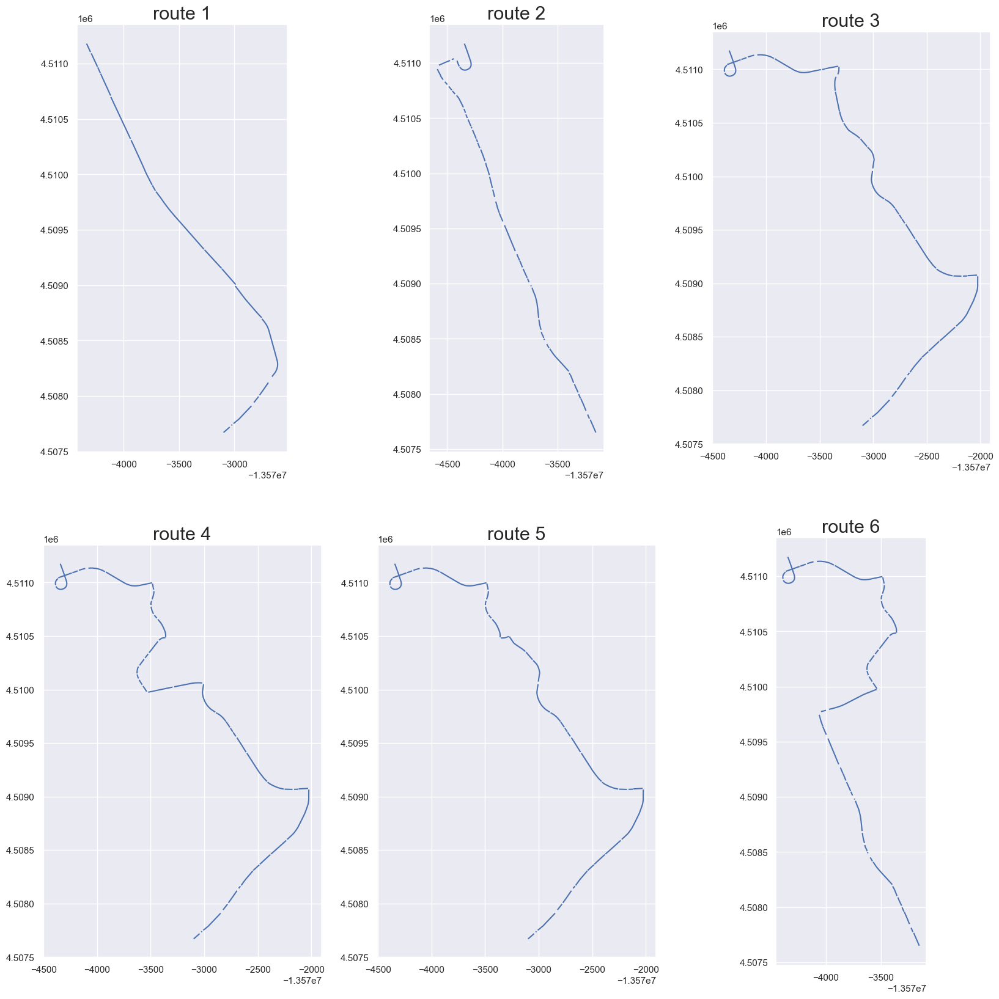

In [ ]:
frame_routes = {k: frame[frame.index.isin(routes[k])] for k in routes}
fig, axs = plt.subplots(2, 3, figsize=(20,20))
for k in frame_routes:
    ax = axs[(k-1)//3][(k-1)%3]
    # sections.plot(ax=ax, color='0.8', lw=0.5, zorder=0)
    frame_routes[k].plot(ax=ax, zorder=1)
    ax.set_title(f'route {k}', size=22)
    # ax.axis('off')
plt.show()

Sum of travel times of their constituent road sections, aggregated over time

In [ ]:
for k in frame_routes:
    print(f"Route {k}")
    for suffix in ['uncoordinated', 'coordinated']:
        print(f"{suffix} travel time (s): {np.sum(frame_routes[k]['ttime_'+suffix])}")
    dist = 0
    for sec in frame_routes[k].index:
        dist += route_sections[int(sec)]['length']
    print(f"distance (km): {dist/1000}\n")

Route 1
uncoordinated travel time (s): 305.27992741770277
coordinated travel time (s): 329.9626649706389
distance (km): 2.988

Route 2
uncoordinated travel time (s): 417.1487534374807
coordinated travel time (s): 332.77460126024897
distance (km): 2.417

Route 3
uncoordinated travel time (s): 312.80979734275655
coordinated travel time (s): 342.4611934246018
distance (km): 3.454

Route 4
uncoordinated travel time (s): 340.58479229740595
coordinated travel time (s): 444.33846589288487
distance (km): 3.893

Route 5
uncoordinated travel time (s): 306.1568398055352
coordinated travel time (s): 370.67665603271655
distance (km): 3.423

Route 6
uncoordinated travel time (s): 382.8759066008538
coordinated travel time (s): 417.56727721859886
distance (km): 3.146



[DEPRECATED] Simulated travel time across Mission Blvd at 100% demand (in place of $l/v$)

In [ ]:
assert COMPARISON_MODE == '100'
unpacked_databases_sect_partial = unpack_databases('MISECT', ['fully_coordinated', 'fully_coordinated_run_two', 'fully_coordinated_run_three', 'fully_coordinated_averaged'])

lv_mission_nb: 100%|██████████| 9/9 [00:01<00:00,  7.01it/s]                


speed_y
40.0    53.114319
56.0    53.476135
64.0    63.934088
72.0    61.930401
Name: speed_x, dtype: float64

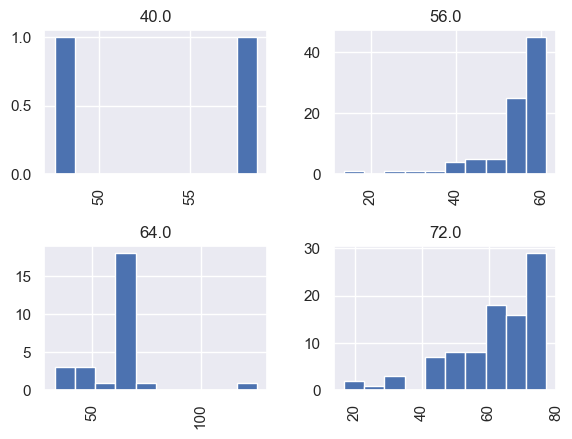

In [ ]:
def restrict_sections(df, sections):
    df = df[(df['ent']==0) & (df['sid']==0)]
    df = df[df['eid'].isin(sections['eid'])]
    df = df.merge(sections, on='eid')
    df = gpd.GeoDataFrame(df)
    df['speed_x'].hist(by=df['speed_y'])
    return df.groupby('speed_y').mean()['speed_x']

restrict_sections(
    unpacked_databases_sect_partial['fully_coordinated_averaged']['database'],
    mission_sections
)

[DEPRECATED] The following code will not work for many cases due to weird geometries of nodes / opposite side of the road etc.

In [ ]:
from shapely.ops import nearest_points, transform
from shapely.geometry import MultiPoint

METRIC = section_metrics['ttime']
ROAD = 'mission'
SIGNALIZED_NODES = None

if ROAD == 'mission':
	ROAD = ['Mission Boulevard']
	SIGNALIZED_NODES = ['56451', '62795', '16827', '27954', '27938', '27921', '27889', '27869', '27847', '13225', '27816', '27796', '27479', '56218', '42160']
if ROAD in ('warm springs', 'osgood', 'driscoll'):
	ROAD = ['Driscoll Road', 'Osgood Road', 'Warm Springs Boulevard']
	SIGNALIZED_NODES = ['56438', '56451', '45371', '53579', '38460', '45004', '56471', '62346', '56418', '62356', '56391', '56297', '56244', '56218']
if isinstance(ROAD, str):
	ROAD = [ROAD]
	assert SIGNALIZED_NODES

def mean_y(linestring):
	bbox = linestring.bounds
	return (bbox[1] + bbox[3]) / 2

road_sections = frame[frame.index.isin(sections[sections['name'].isin(ROAD)]['eid'])] \
	[[f'{METRIC.name}_coordinated', 'geometry']]
road_sections['y'] = road_sections['geometry'].apply(mean_y)
road_signalized_nodes = nodes[nodes['eid'].isin(SIGNALIZED_NODES)]

for _, row in road_sections.iterrows():
	pass # not sure what used to go here

IndentationError: expected an indented block (1662079486.py, line 27)

In [ ]:
from shapely.ops import nearest_points, transform
from shapely.geometry import MultiPoint

METRIC = section_metrics['ttime']
ROAD = 'osgood'

if ROAD == 'mission':
	ROAD = ['Mission Boulevard']
if ROAD in ('warm springs', 'osgood', 'driscoll'):
	ROAD = ['Driscoll Road', 'Osgood Road', 'Warm Springs Boulevard']
if isinstance(ROAD, str):
	ROAD = [ROAD]

def round_coordinates(geom, n_digits=3):
	round_coords = lambda x, y : (round(x, n_digits), round(y, n_digits))
	return transform(round_coords, geom)

rounded_sections = sections.copy()
rounded_nodes = nodes.copy().drop(columns='name').dropna()
rounded_nodes['eid'] = rounded_nodes['id'].apply(lambda x: str(int(x)))
rounded_sections['geometry'] = rounded_sections['geometry'].apply(round_coordinates)
rounded_nodes['geometry'] = rounded_nodes['geometry'].apply(round_coordinates)
road_sections = frame[frame.index.isin(rounded_sections[rounded_sections['name'].isin(ROAD)]['eid'])] \
	[[f'{METRIC.name}_coordinated', 'geometry']]
for i in range(2):
	road_sections[f'endpoint_{i}'] = road_sections['geometry'].apply(
		lambda section: section.boundary[i])

points = set(rounded_nodes['geometry']) | set(road_sections['endpoint_0']) | set(road_sections['endpoint_1'])
mp_str_to_geo = {str(p): p for p in points}
node_geo_to_eid = {str(row['geometry']): row['eid'] for _, row in rounded_nodes.iterrows()}
node_eid_to_geo = {row['eid']: row['geometry'] for _, row in rounded_nodes.iterrows()}
signalized_ids = list(signalized_nodes['city-controlled'].keys()) + list(signalized_nodes['state-controlled'].keys())

G = {str(p): set() for p in points}
for _, row in road_sections.iterrows():
	u, v = row['endpoint_node_0'], row['endpoint_node_1']
	if u and v:
		G[u].add(v)
		G[v].add(u)
	mp = points.copy()
	mp.remove(u)
	mp.remove(v)
	mp = MultiPoint(mp)
	

def bfs(start, exclude):
	"""Returns the id of the nearest signalized node from `start`,
	or None if no such node exists"""
	q = []
	q.append(start)
	visited = {exclude}
	start_node = node_eid_to_geo[start]
	exclude_node = node_eid_to_geo[exclude]

	while q:
		u = q.pop(0)
		u_node = node_eid_to_geo[u]
		visited.add(u)
		if u in signalized_ids:
			return u
		for v in G[u]:
			if v not in visited:
				v_node = node_eid_to_geo[v]
				if start_node.distance(u_node) < start_node.distance(v_node) < exclude_node.distance(v_node):
					q.append(v)

signalized_to_sections = {(u, v): [] for u in signalized_ids for v in signalized_ids}
for _, row in road_sections.iterrows():
	eid, u, v = row.name, row['endpoint_node_0'], row['endpoint_node_1']
	z, w = bfs(u, v), bfs(v, u)
	if z and w:
		signalized_to_sections[(z, w)].append(eid)
signalized_to_sections = {k: v for k, v in signalized_to_sections.items() if v}

def signalized_dist(u, v):
	get_dist = lambda section: road_sections.loc[section][f'{METRIC.name}_coordinated']
	return sum(map(get_dist, signalized_to_sections[(u, v)]))

print(f"{', '.join(ROAD)} - {METRIC.name} ({METRIC.unit})")
for u, v in signalized_to_sections:
	print(f"{u} to {v}: {round(signalized_dist(u, v), 1)}")

print(signalized_to_sections[('56391', '56391')])
print(road_sections.loc['35250'])

# keeping this because some were annoying to write
fig, ax = plt.subplots(figsize=(20,30))
rounded_sections.plot(ax=ax, color='0.8', zorder=0)
rounded_nodes[rounded_nodes['eid'].isin(signalized_ids)].plot(ax=ax, color='orange', zorder=1)
for bruh in ['35250']:
	ax.plot(*road_sections.loc[bruh]['geometry'].xy, color='green', zorder=2)
# for bruh in ['2768', '7385', '9403']:
# 	ax.plot(*road_sections.loc[bruh]['geometry'].xy, color='purple', zorder=2)
investigating = ('56391',)
for i in range(len(investigating)):
	# print(node_eid_to_geo[investigating[i]])
	ax.plot(*node_eid_to_geo[investigating[i]].xy, 'ro', color='blue' if i else 'red', zorder=3)
# first, last = road_sections.loc['2770']['geometry'].boundary
# _, near = nearest_points(first, LineString(nodes['geometry']))
# print(nodes[nodes['geometry']==near].iloc[0]['eid'])
# ax.plot(*road_sections.loc[bruh]['geometry'].xy, color='blue', zorder=1)
# ax.plot(*near.xy, 'ro', zorder=2)
# print(near)

TypeError: unhashable type: 'Point'

#### Plot restrictions to altered Mission Blvd/Osgood Road segments

In [ ]:
unpacked_databases_sect_partial = unpack_databases(
    'MISECT', 
    ['fully_uncoordinated', 'mission_partially_uncoordinated', 
     'osgood_partially_uncoordinated', 'fully_coordinated'], 
    False)

Processed System Fully Uncoordinated
Processed Mission Blvd Partially Uncoordinated
Processed Osgood Road Partially Uncoordinated
Processed System Fully Coordinated


In [ ]:
for k, v in unpacked_databases_sect_partial.items():
    unpacked_databases_sect_partial[k]['database'] = preprocess_sections(v['database']).groupby('eid').mean()

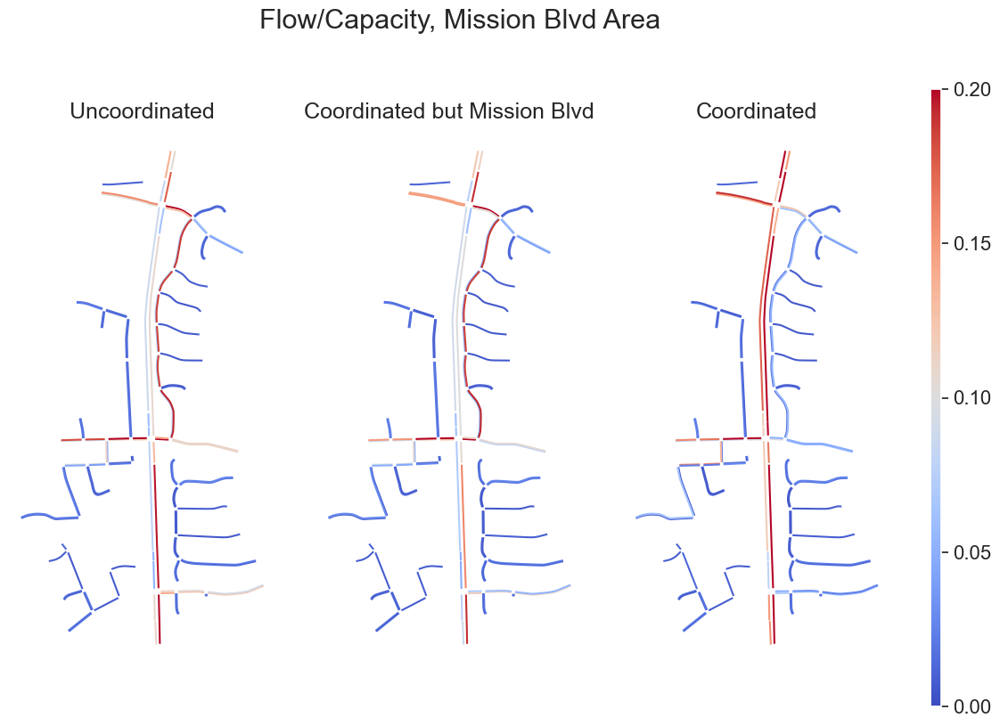

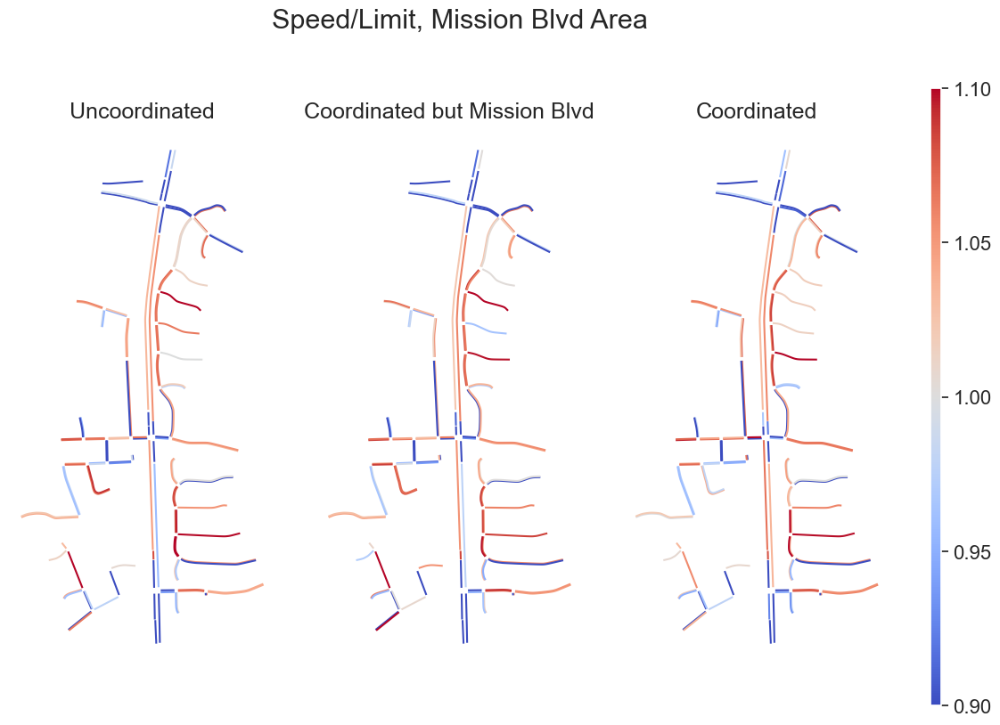

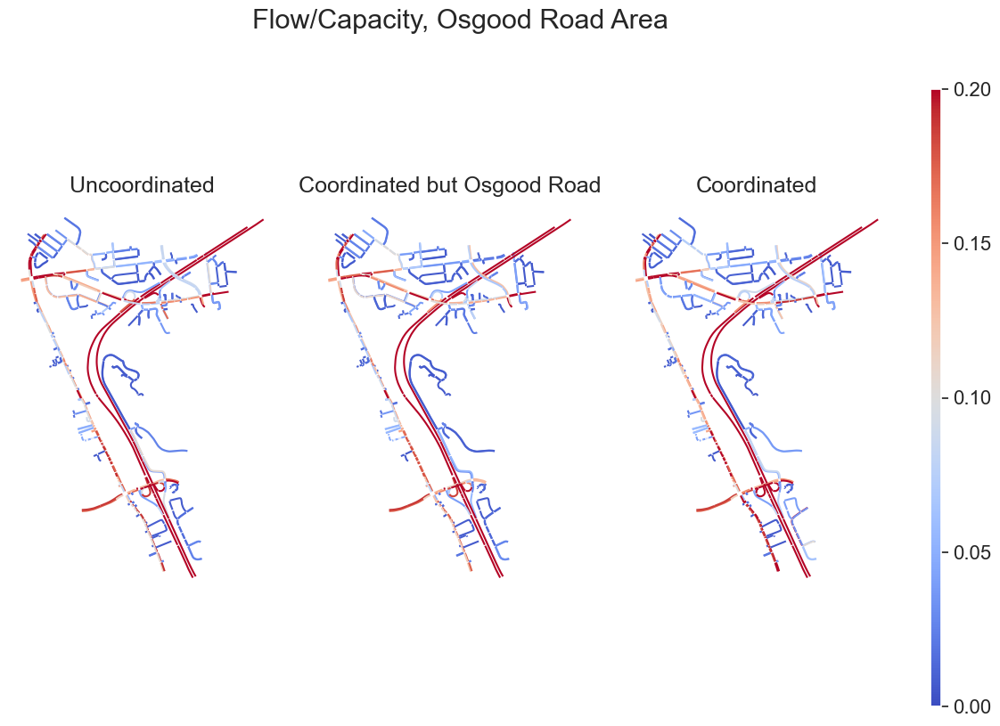

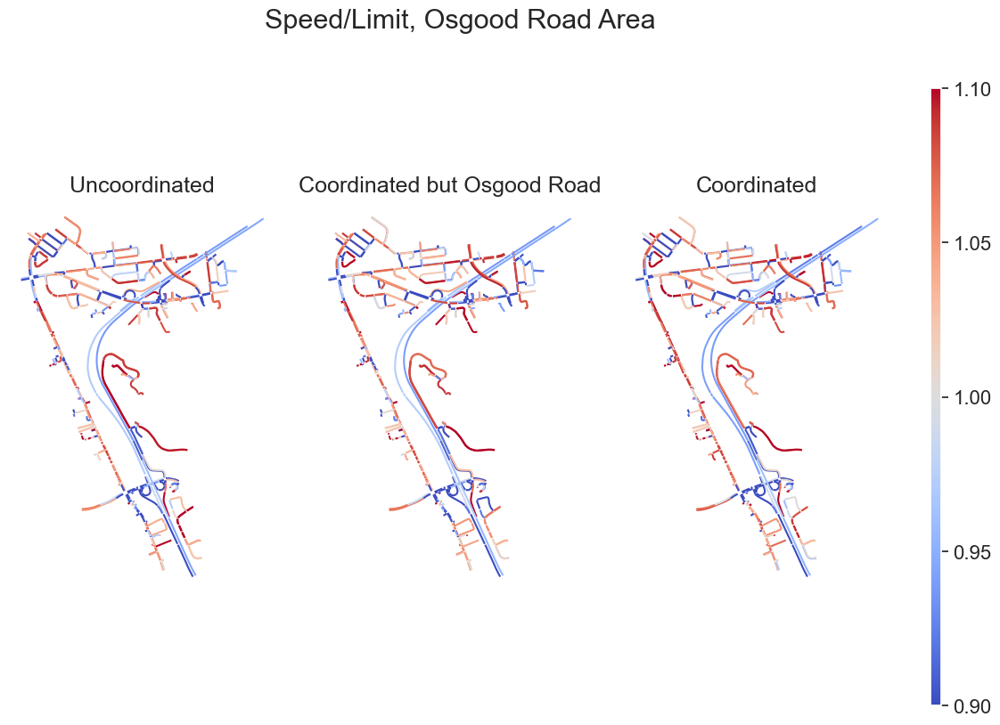

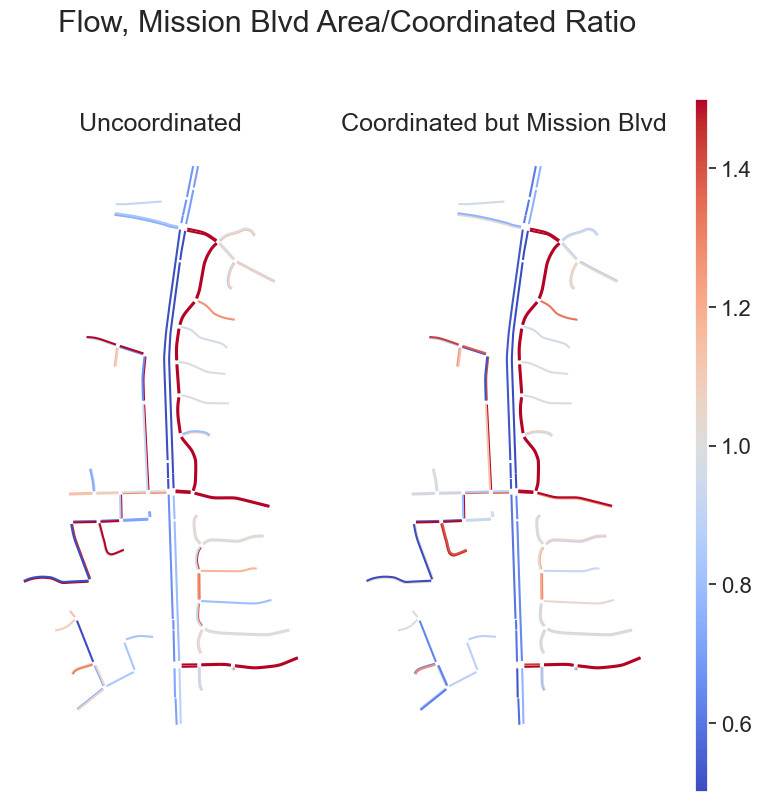

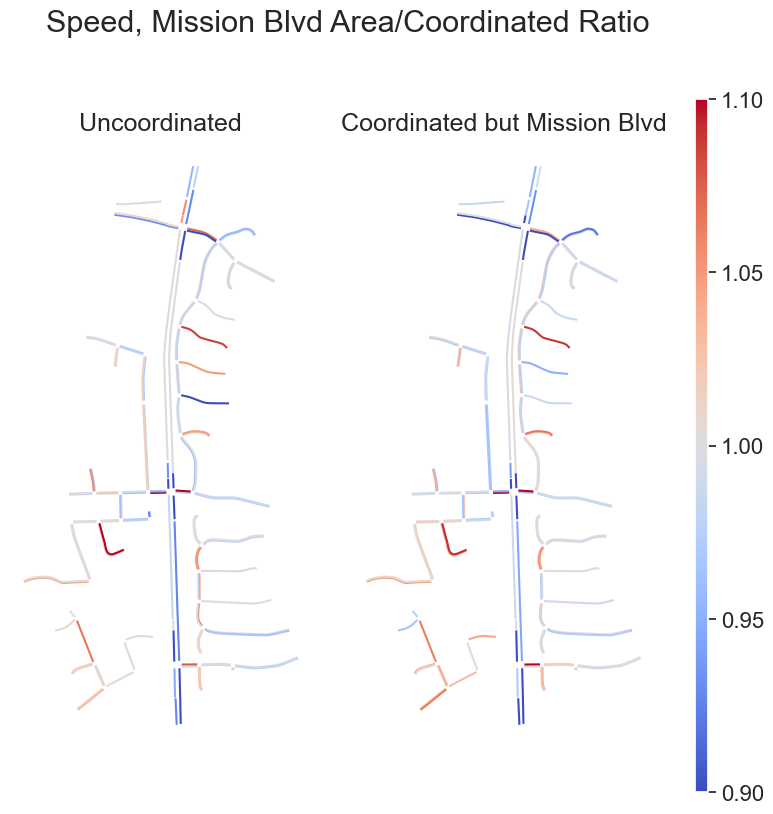

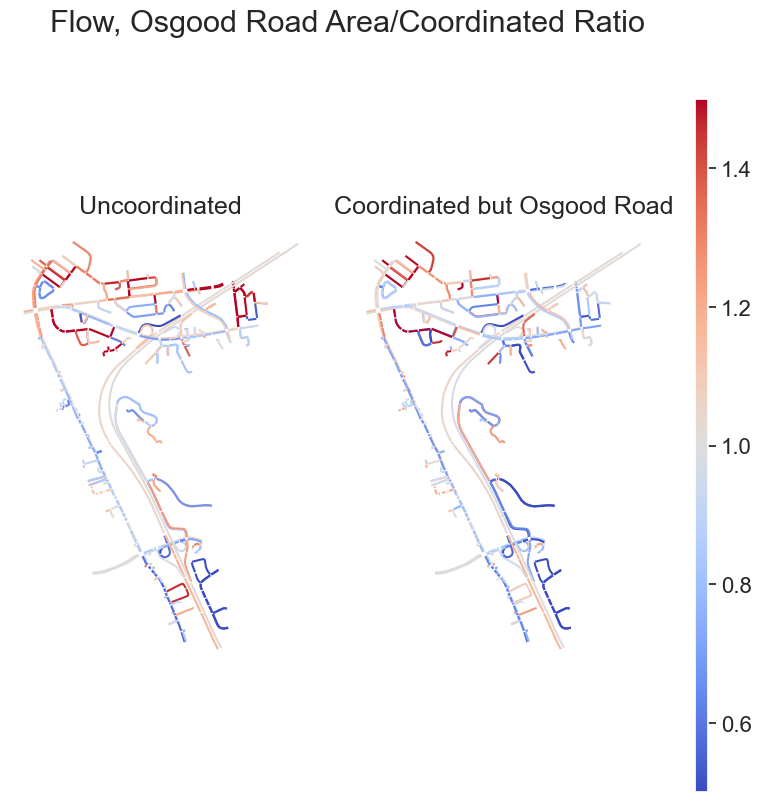

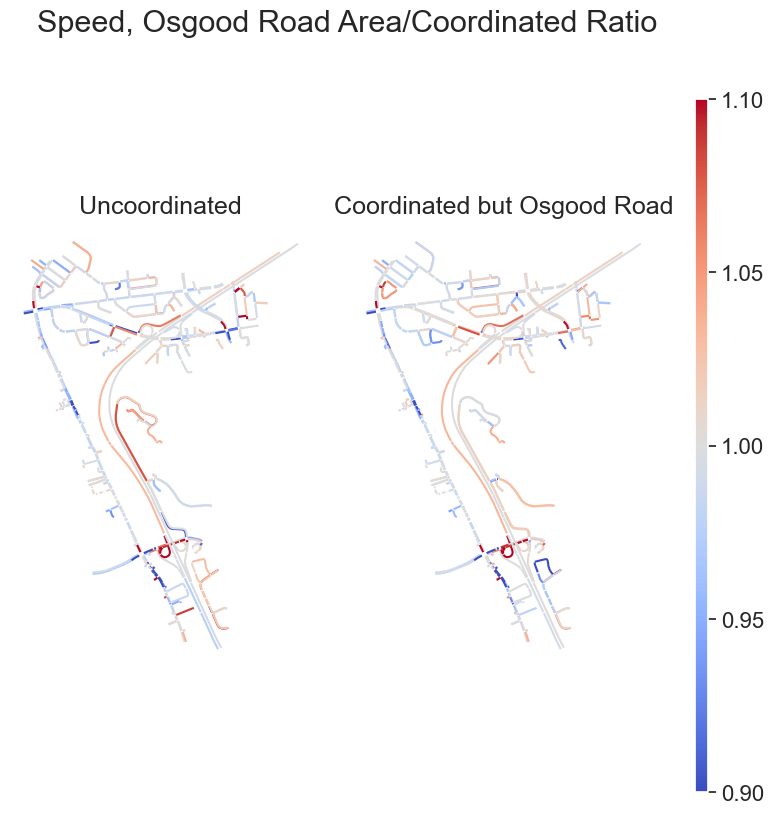

In [ ]:
local_frame = pd.concat(
    [unpacked_databases_sect_partial[k]['database'].add_suffix('_'+k) 
        for k in unpacked_databases_sect_partial],
    axis=1,
    join='inner'
).merge(sections, left_on='eid', right_on='eid').set_index('eid')

local_frame = gpd.GeoDataFrame(local_frame, geometry='geometry').to_crs("EPSG:3857")
local_frames = {
    'mission': {
        'desc': 'Mission Blvd Area',
        'database': local_frame[local_frame.index.isin(sections_near_mission['eid'])],
        'to_plot': ['fully_uncoordinated', 'mission_partially_uncoordinated', 'fully_coordinated']
    },
    'osgood': {
        'desc': 'Osgood Road Area',
        'database': local_frame[local_frame.index.isin(sections_near_osgood['eid'])],
        'to_plot': ['fully_uncoordinated', 'osgood_partially_uncoordinated', 'fully_coordinated']
    }
}

from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def plot_local(mode):
    """
    There are two modes:
    `mode` = 'standard': Plots all entries in 'to_plot'
    `mode` = 'compare': Uses 'to_plot[-1]' as a "comparison" scenario, to 
                        which all other entries in `which` are compared 
                        via ratio
    """
    plot_bounds = {
        'standard': {
            'flow': (0, 0.2),
            'speed': (0.9, 1.1),
        },
        'compare': {
            'flow': (0.5, 1.5),
            'speed': (0.9, 1.1)
        }
    }
    
    for name in local_frames:
        df, to_plot = local_frames[name]['database'], local_frames[name]['to_plot']
        if mode == 'standard':
            for suffix in to_plot:
                df['flow/capacity_' + suffix] = df['flow_' + suffix] / df['capacity']
                df['speed/limit_' + suffix] = df['speed_' + suffix] / df['speed']
        if mode == 'compare':
            compare_to = to_plot[-1]
            to_plot = to_plot[:-1]
            for suffix in to_plot:
                df['flow_' + suffix + '_ratio'] = df['flow_' + suffix] / df['flow_' + compare_to]
                df['speed_' + suffix + '_ratio'] = df['speed_' + suffix] / df['speed_' + compare_to]
        df.fillna(0)

        for metric in ['Flow/Capacity', 'Speed/Limit']:
            abbrev_metric = metric.split('/')[0]
            vmin, vmax = plot_bounds[mode][abbrev_metric.lower()]
            fig, axs = plt.subplots(1, len(to_plot) + 1, 
                figsize=(4.5*len(to_plot), 9), gridspec_kw={'width_ratios': [50]*len(to_plot)+[2]})
            norm = Normalize(vmin=vmin, vmax=vmax)
            cb = ColorbarBase(axs[-1], cmap='coolwarm', norm=norm, orientation='vertical')
            axs[-1].locator_params(nbins=5)
            axs[-1].tick_params(labelsize=16)

            if mode == 'standard':
                fig.suptitle(f"{metric}, {local_frames[name]['desc']}", size=22)
            if mode == 'compare':
                fig.suptitle(f"{abbrev_metric}, {local_frames[name]['desc']}/{databases[compare_to]['desc']} Ratio", size=22)
            for i in range(len(to_plot)):
                suffix = '_' + to_plot[i]
                if mode == 'standard':
                    column = metric.lower() + suffix
                if mode == 'compare':
                    column = abbrev_metric.lower() + suffix + '_ratio'
                df.plot(ax=axs[i], column=column, cmap='coolwarm', vmin=vmin, vmax=vmax)
                axs[i].set_title(unpacked_databases_sect_partial[to_plot[i]]['desc'], size=18)
                axs[i].axis('off')
        
            save_fig(f"{name}-{abbrev_metric.lower()}-{mode}.png")
            plt.show()

plot_local('standard')
plot_local('compare')

### Multiple comparison plots

In [38]:
unpacked_databases_sect = unpack_databases('MISECT', preprocess_sections)
unpacked_databases_sect

100%|██████████| 9/9 [00:01<00:00,  4.95it/s, scenario=lv_mission_nb]                


{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'database':        ent   eid    travel      count      speed     dtime   density  \
  0        0  1006  6.794755  44.666667  43.098619  0.743011  0.173434   
  1        0  1007  1.111620  10.000000  42.285374  0.464328  0.039649   
  2        0  1008  7.150065  45.333333  42.241177  1.060115  0.182118   
  3        0  1009  3.795159  34.666667  42.449772  0.744148  0.136320   
  4        0  1014  0.652092   2.000000  40.527757  0.000000  0.000000   
  ...    ...   ...       ...        ...        ...       ...       ...   
  70620   24   990  0.252474   6.000000  42.220480  0.188269  0.534835   
  70621   24   991  0.051482   2.000000  44.407126  0.000000  0.180632   
  70622   24   992  0.041417   2.000000  44.407113  0.000000  0.180632   
  70623   24   993  0.057252   2.000000  44.406982  0.000000  0.135871   
  70624   24   997  0.094198   2.000000  42.930384  0.000000  0.186646   
  
              flow      ttime  
  

Congestion ratio

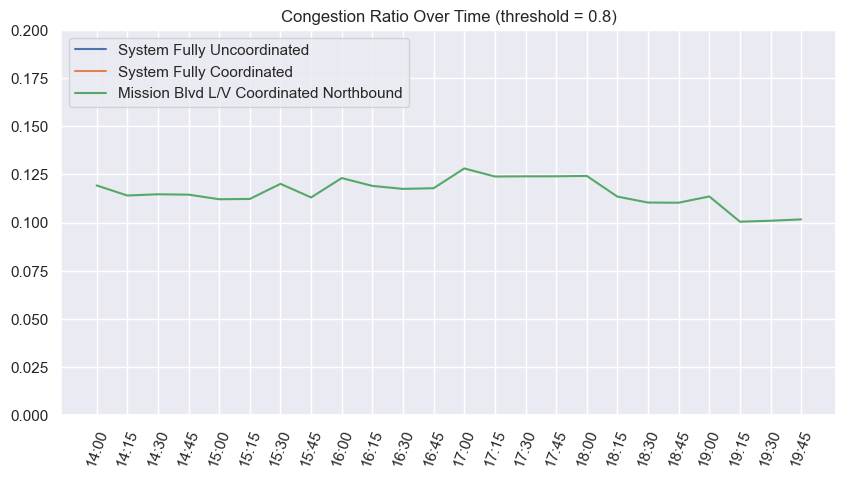

In [ ]:
def plot_congestion_ratio(database_names, image_descriptor, congestion_threshold=0.8, vmin=0, vmax=0.2):
    fig, ax = plt.subplots(1, 1, figsize=(10, 5))

    for database_name in database_names:
        desc, database = unpacked_databases_sect[database_name]['desc'], unpacked_databases_sect[database_name]['database']

        section_lengths = database[['eid', 'count', 'travel']]
        section_lengths['approx_length'] = section_lengths['travel'] / section_lengths['count']
        section_lengths = section_lengths.dropna().groupby('eid').mean().reset_index()

        data = database[database['count'] > 0][['eid', 'speed', 'sid', 'ent']]
        data = data[(data['sid'] == 0) & (data['ent'] != 0)].drop(columns='sid')
        data = data.merge(sections[['eid', 'speed']], how='left', on='eid').dropna()
        data = data.merge(section_lengths[['eid', 'approx_length']], how='left', on='eid')
        data['congestion_ratio'] = data['speed_x'] / data['speed_y']
        hour_data = []

        for i in range(1, 25):
            timestep_data = data[data['ent'] == i]
            congested_length = np.sum(timestep_data[timestep_data['congestion_ratio'] < congestion_threshold]['approx_length'])
            tot_length = np.sum(timestep_data['approx_length'])
            hour_data.append(congested_length / tot_length)

        ax.plot(TIME_INTERVALS_STRING, hour_data, label=desc)

    plt.title(f"Congestion Ratio Over Time (threshold = {congestion_threshold})")
    plt.xticks(rotation=70)
    plt.ylim(vmin, vmax)
    plt.legend(loc='upper left')
    save_fig(f'congestion-ratio-{image_descriptor}.png')
    plt.show()

plot_congestion_ratio(to_plot, COMPARISON_MODE)

Specific road

In [41]:
# def preprocess_sections_multiple(group_by=['eid', 'ent']):
#     for k, v in unpacked_databases_sect.items():
#         desc, df = v['desc'], v['database']
#         df = preprocess_sections(df).groupby(group_by).mean().reset_index()
#         if 'geometry' not in df.columns:
#             df = df.merge(sections[['eid', 'geometry']], left_on='eid', right_on='eid').set_index('eid')
#             df = gpd.GeoDataFrame(df, geometry='geometry')
#             df = df.to_crs("EPSG:3857")
#         unpacked_databases_sect[k]['database'] = df

# preprocess_sections_multiple()
# unpacked_databases_sect

In [69]:
import re

directional_sections = {
    'Mission Boulevard': {
        'north': mission_northbound, 
        'south': mission_southbound,
        'both': mission_sections
    },
    'Osgood Road': {
        'north': osgood_northbound, 
        'south': osgood_southbound,
        'both': osgood_sections
    },
    'I-680': {
        'north': i680_northbound, 
        'south': i680_southbound,
        'both': i680_sections
    },
}

direction_to_str = {
    'north': 'Northbound',
    'south': 'Southbound',
    'both': 'Both'
}

def metric_by_road(verbose=True):
    def helper(road: str, metric: str, res: ResultsDf, to_plot=to_plot, show_plots=False):
        """'Main' method that updates `res`."""
        assert all(c in res.df.columns for c in ['direction', 'road'])
        metric = section_metrics[metric]

        road = road.lower()
        if 'mission' in road:
            road_name = 'Mission Boulevard'
        elif re.compile(r'warm springs|osgood|driscoll').search(road):
            road_name = 'Osgood Road'
        elif re.compile(r'i(-)?680').search(road):
            road_name = 'I-680'
        else:
            raise ValueError(f"'{road}' is illegal road argument")
        
        if 'north' in road:
            direction = 'north'
        elif 'south' in road:
            direction = 'south'
        else:
            direction = 'both'
        section_subset = directional_sections[road_name][direction]

        road_data = deepcopy(unpacked_databases_sect)
        for k, v in road_data.items():
            df = v['database']
            df = df[(df['eid'].isin(section_subset['eid'])) & (df['ent']!=0)]
            df = df.groupby('ent').mean()
            road_data[k]['database'] = df
        
        fig, ax = plt.subplots()
        for k in to_plot:
            data = road_data[k]['database'][metric.name]
            ax.plot(
                TIME_INTERVALS_STRING, 
                data, 
                label=databases[k]['desc'], 
                color=plot_colors[k]['default']
            )
            res.add(
                direction=direction_to_str[direction],
                road=road_name,
                label=databases[k]['desc'], 
                mean=data.mean(), 
                std=data.std()
            )

        road_full = f'{road_name} {direction}' if direction == 'both' else road_name
        plt.title(f'{metric.desc} over time on {road_full} ({metric.unit})')
        plt.xticks(rotation=70)
        plt.legend(fontsize=10, loc='upper left')
        save_fig(f'section/{road}/{metric.name}-over-time')

        if show_plots:
            plt.show()
        else:
            plt.close(fig)


    directions = ['north', 'south', 'both']
    roads = ['mission', 'osgood']
    pbar = tqdm(section_metrics, total=len(directions)*(len(roads)+1)*len(section_metrics))
    all_res = {}
    curr_state = {}

    for metric in pbar:
        res = ResultsDf(['direction', 'road'])
        for direction in directions:
            curr_state = {'metric': metric, 'direction': direction}
            for road in roads:
                curr_state['road'] = road
                pbar.set_postfix(curr_state)
                if COMPARISON_MODE == '100':
                    ls = [
                        'fully_uncoordinated_averaged',
                        f'{road}_fully_uncoordinated',
                        f'{road}_partially_uncoordinated_averaged',
                        'fully_coordinated_averaged'
                    ]
                elif COMPARISON_MODE == 'lv':
                    ls = to_plot
                else:
                    raise NotImplementedError()
                helper(f'{road}_{direction}', metric, res, to_plot=ls)
                pbar.update(1)
            curr_state['road'] = 'i680'
            helper(f'i680_{direction}', metric, res, to_plot)
            pbar.update(1)

        res.save(f'metric-by-road/{metric}', file_type='all')

    if verbose:
        for metric, res in all_res.items():
            print(metric + '\n\n' + res.__str__() + '\n\n')

    return all_res
    

all_res = metric_by_road()

 11%|█         | 7/63 [01:05<08:45,  9.39s/it, metric=count, direction=both, road=osgood]     


Scenario ratios

In [177]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def section_ratio(scenarios, compare_to, verbose=True, write=True, plot=True):
    """
    All things section-ratio related.
    Generates tables summarizing mean data, runs statistical tests, generates section plots.
    """
    assert compare_to not in scenarios
    all_scenarios = [compare_to] + scenarios
    if COMPARISON_MODE == 'lv':
        mean_std_res = ResultsDf(['metric', 'scenario', 'mean', 'std'])
        stat_test_res = ResultsDf(['metric', 'scenario_1', 'scenario_2', 't_statistic', 'p_value'])
    else:
        raise NotImplementedError()

    multi_frame = []
    for scenario in all_scenarios:
        df = unpacked_databases_sect[scenario]['database']
        df = df[df['ent']==0]
        df.drop(columns='ent', inplace=True)
        df = df.rename(columns={c: c + f'_{scenario}' for c in df.columns if c != 'eid'})
        df = remove_unnamed(df)
        multi_frame.append(df)
    multi_frame = ft.reduce(
        lambda left, right: pd.merge(left, right, how='outer', on='eid'),
        multi_frame
    )

    log_ratio_df = multi_frame[['eid']]
    for metric in section_metrics.values():
        for scenario in all_scenarios:
            data = multi_frame[f'{metric.name}_{scenario}']
            mean_std_res.add(
                metric=metric.desc,
                scenario=unpacked_databases_sect[scenario]['desc'],
                mean=data.mean(),
                std=data.std()
            )
            log_ratio_df[f'{metric.name}_{scenario}'] = np.log2(multi_frame[f'{metric.name}_{scenario}'] + eps) \
                                                        - np.log2(multi_frame[f'{metric.name}_{compare_to}'] + eps)
    log_ratio_df = gpd.GeoDataFrame(
        log_ratio_df.merge(sections[['eid', 'geometry']], on='eid'),
        geometry='geometry'
    )

    for metric in section_metrics.values():
        for i in range(len(all_scenarios)):
            for j in range(i+1, len(all_scenarios)):
                scenario_1 = all_scenarios[i]
                scenario_2 = all_scenarios[j]
                col_1 = f'{metric.name}_{scenario_1}'
                col_2 = f'{metric.name}_{scenario_2}'
                data = multi_frame[[col_1, col_2]]
                data.dropna(inplace=True)
                stat, pval = stats.ttest_rel(data[col_1], data[col_2])
                stat_test_res.add(
                    metric=metric.desc,
                    scenario_1=unpacked_databases_sect[scenario_1]['desc'],
                    scenario_2=unpacked_databases_sect[scenario_2]['desc'],
                    t_statistic=stat,
                    p_value=pval
                )

    if write:
        mean_std_res.save('section-ratio/mean-std', file_type='all')
        stat_test_res.save('section-ratio/stat-test', file_type='all', index_cols=['metric'])

    if plot:
        pbar = tqdm(section_metrics.values())
        for metric in pbar:
            fig, axs = plt.subplots(1, len(scenarios) + 1, figsize=(8*len(scenarios), 10), 
                                    gridspec_kw={'width_ratios': [50]*len(scenarios)+[2]})
            fig.suptitle(
                f"{metric.desc} / {{ {unpacked_databases_sect[compare_to]['desc']} }} Log2 Ratio", 
                size=25
            )
            vmin, vmax = -2, 2
            norm = Normalize(vmin=vmin, vmax=vmax)
            cb = ColorbarBase(axs[-1], cmap='coolwarm_r', norm=norm, orientation='vertical')
            axs[-1].tick_params(labelsize=16)

            for i in range(len(scenarios)):
                scenario = scenarios[i]
                ax = axs[i]
                pbar.set_postfix({'metric': metric.name, 'scenario': scenario})
                affected_nodes = nodes[nodes['eid'].isin(
                    np.array(databases[scenario]['uncoordinated_nodes'], str))]
                sections.plot(ax=ax, color='0.8', zorder=-1)
                log_ratio_df.plot(ax=ax, column=f'{metric.name}_{scenario}', 
                    cmap='coolwarm_r', lw=1, vmin=vmin, vmax=vmax, zorder=0)
                # nodes.plot(ax=ax, color='0.3', lw=2, zorder=1)
                # if affected_nodes.shape[0]:
                #     affected_nodes.plot(ax=ax, color='black', lw=2, zorder=2, marker='s')
                ax.set_title(unpacked_databases_sect[scenario]['desc'], size=22)
                ax.axis('off')

            plt.subplots_adjust(wspace=0)
            save_fig(f'section-ratio/{metric.name}')
            plt.close()

    return mean_std_res, stat_test_res


In [180]:
if COMPARISON_MODE == 'lv':
    mean_std_res, stat_test_res = section_ratio(
        ['fully_coordinated_averaged', 'lv_mission_nb'],
        'fully_uncoordinated_averaged',
        write=True,
        plot=False
    )
else:
    raise NotImplementedError()
print(mean_std_res.__str__() + '\n')
print(stat_test_res.__str__())

                        metric                                 scenario  \
0                    Mean Flow               System Fully Uncoordinated   
1                    Mean Flow                 System Fully Coordinated   
2                    Mean Flow  Mission Blvd L/V Coordinated Northbound   
3             Mean Travel Time               System Fully Uncoordinated   
4             Mean Travel Time                 System Fully Coordinated   
5             Mean Travel Time  Mission Blvd L/V Coordinated Northbound   
6              Mean Delay Time               System Fully Uncoordinated   
7              Mean Delay Time                 System Fully Coordinated   
8              Mean Delay Time  Mission Blvd L/V Coordinated Northbound   
9                   Mean Speed               System Fully Uncoordinated   
10                  Mean Speed                 System Fully Coordinated   
11                  Mean Speed  Mission Blvd L/V Coordinated Northbound   
12             Density by

Buffer zones

The below plots indicate metrics over time within a certain buffer distance from
an arterial road (Mission Blvd, Osgood Road).

In [ ]:
from copy import deepcopy

def buffer_zone_plots(road, include_inner=True, show_plots=True, exclude_i680=True):
    if road == 'mission':
        road_full = 'Mission Boulevard'
    elif road in ('warm springs', 'osgood', 'driscoll'):
        road_full = 'Osgood Road'
    else:
        raise ValueError('Illegal road')

    scenarios = ['fully_uncoordinated_averaged', 
                 f'{road}_partially_uncoordinated_averaged',
                 f'{road}_fully_uncoordinated',
                 'fully_coordinated_averaged']
    res = {k: {d: {} for d in buffer_distances} for k in section_metrics}

    road_buffer = mission_buffer if road == 'mission' else osgood_buffer
    if exclude_i680:
        for d in buffer_distances:
            df = road_buffer[d]['sections']
            road_buffer[d]['sections'] = df[~(df['eid'].isin(i680_sections['eid']))]

    for i in range(len(buffer_distances)):
        d = buffer_distances[i]
        unpacked_databases_buffer = deepcopy(unpacked_databases_sect)
        for k in unpacked_databases_buffer:
            database = unpacked_databases_buffer[k]['database']
            if include_inner or i == 0:
                unpacked_databases_buffer[k]['database'] = database[
                    database.index.isin(road_buffer[d]['sections']['eid'])]
            else:
                unpacked_databases_buffer[k]['database'] = database[
                    (database.index.isin(road_buffer[buffer_distances[i]]['sections']['eid']))
                    & ~(database.index.isin(road_buffer[buffer_distances[i-1]]['sections']['eid']))]
        for k in section_metrics:
            for scenario in scenarios:
                data = unpacked_databases_buffer[scenario]['database'][k]
                res[k][d][scenario] = {'mean': data.mean(), 'stdev': data.std()}
    
    for k in section_metrics:
        metric = section_metrics[k]
        fig, ax = plt.subplots()
        for scenario in scenarios:
            data = [res[k][d][scenario]['mean'] for d in buffer_distances]
            ax.plot(buffer_distances, 
                    data, 
                    label=databases[scenario]['desc'], 
                    color=plot_colors[scenario]['default'])
            ax.scatter(buffer_distances, 
                       data,
                       color=plot_colors[scenario]['default'])

        title = f'{metric.desc} vs Distance from {road_full}'
        if include_inner:
            filename = f'{road}/include-inner/{k}.png'
            title += ' (Including I-680)'
        else:
            filename = f'{road}/exclude-inner/{k}.png'
            title += ' (Excluding I-680)'
            temp = [0] + buffer_distances
            xticks = [f'[{temp[i]}, {temp[i+1]}]' for i in range(len(buffer_distances))]
            ax.set_xticks(buffer_distances, xticks, rotation=90)
        ax.set_title(title)
        ax.set_xlabel('Distance (m)')
        ax.set_ylabel(f'{metric.desc} ({metric.unit})')
        ax.legend(loc='upper right')
        save_fig(f"buffer/{filename}")
        if show_plots:
            plt.show()
        else:
            plt.close()

for include_inner in [True, False]:
    buffer_zone_plots('mission', include_inner=include_inner, show_plots=False)
    buffer_zone_plots('osgood', include_inner=include_inner, show_plots=False)

Animation multiple comparison

In [36]:
unpacked_databases_sect = unpack_databases('MISECT')

def preprocess_sections_animation(df):
    df = df[df['sid']==0]
    df = df.filter(items=section_df_cols).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df

for k in unpacked_databases_sect:
    unpacked_databases_sect[k]['database'] = preprocess_sections_animation(unpacked_databases_sect[k]['database'])

100%|██████████| 9/9 [00:01<00:00,  5.24it/s, scenario=lv_mission_nb]                


KeyError: 'sid'

In [ ]:
from matplotlib import animation
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize
from functools import reduce


def multiple_section_animation(metric, to_plot=to_plot, filename=None):
    """
    Plots ratios of to_plot[:-1] to to_plot[-1]
    """

    metric = section_metrics[metric]
    print(metric.desc)
    fig, axs = plt.subplots(1, len(to_plot), figsize=(20, 10), gridspec_kw={
                            'width_ratios': [50]*(len(to_plot)-1)+[2]})
    norm = Normalize(vmin=0, vmax=2)
    cb = ColorbarBase(axs[-1], cmap='coolwarm_r',
                      norm=norm, orientation='vertical')
    axs[-1].tick_params(labelsize=16)
    compare_name = databases[to_plot[-1]]['desc']

    descs = [unpacked_databases_sect[k]['desc'] for k in to_plot[:-1]]
    compare_cols = ['eid', 'ent']
    data = [unpacked_databases_sect[k]['database']
            [compare_cols + [metric.name]] for k in to_plot]
    data = reduce(lambda left, right: pd.merge(
        left, right, on=compare_cols), data)
    data.set_axis(compare_cols + to_plot, axis=1, inplace=True)
    for k in to_plot:
        data[k + '_ratio'] = data[k] / data[to_plot[-1]]
    data.dropna(inplace=True)
    data = gpd.GeoDataFrame(data.merge(
        sections[['eid', 'geometry']], on='eid'), geometry='geometry')

    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(
            f'{metric.desc} / {compare_name} Ratio Over Time: {TIME_INTERVALS_STRING[timestep - 1]}', size=26)
        ims = []

        for i in range(len(to_plot)-1):
            ax = axs[i]
            desc = descs[i]
            affected_nodes = node_geo_city[node_geo_city['id'].isin(
                databases[to_plot[i]]['uncoordinated_nodes'])]
            sections.plot(ax=ax, color='0.8', zorder=-1)
            data[data['ent'] == timestep].plot(
                ax=ax, column=(to_plot[i] + '_ratio'), cmap='coolwarm_r', 
                lw=2, vmin=0, vmax=2, zorder=0)
            if affected_nodes.shape[0]:
                affected_nodes.plot(ax=ax, color='black',lw=2, zorder=2, marker='s')
            ims.append(node_geo_city.plot(ax=ax, color='0.3', lw=2, zorder=1))
            ax.set_title(desc, size=22)
            ax.axis('off')

        return ims

    anim = animation.FuncAnimation(
        fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.6)
    if filename is None:
        filename = f'{metric.name}_multiple_comparison.gif'
    anim.save(os.path.join(image_path, filename), writer=writergif)


Travel Distance by Section


C:\Users\prest\AppData\Local\Temp\ipykernel_8932\3497754242.py:26: FutureWarning: Passing 'suffixes' which cause duplicate columns {'travel_x'} in the result is deprecated and will raise a MergeError in a future version.
  data = reduce(lambda left, right: pd.merge(


Processing travel, frame 1
Processing travel, frame 1
Processing travel, frame 2
Processing travel, frame 3
Processing travel, frame 4
Processing travel, frame 5
Processing travel, frame 6
Processing travel, frame 7
Processing travel, frame 8
Processing travel, frame 9
Processing travel, frame 10
Processing travel, frame 11
Processing travel, frame 12
Processing travel, frame 13
Processing travel, frame 14
Processing travel, frame 15
Processing travel, frame 16
Processing travel, frame 17
Processing travel, frame 18
Processing travel, frame 19
Processing travel, frame 20
Processing travel, frame 21
Processing travel, frame 22
Processing travel, frame 23
Processing travel, frame 24
Travel Distance by Section


C:\Users\prest\AppData\Local\Temp\ipykernel_8932\3497754242.py:26: FutureWarning: Passing 'suffixes' which cause duplicate columns {'travel_x'} in the result is deprecated and will raise a MergeError in a future version.
  data = reduce(lambda left, right: pd.merge(


Processing travel, frame 1
Processing travel, frame 1
Processing travel, frame 2
Processing travel, frame 3
Processing travel, frame 4
Processing travel, frame 5
Processing travel, frame 6
Processing travel, frame 7
Processing travel, frame 8
Processing travel, frame 9
Processing travel, frame 10
Processing travel, frame 11
Processing travel, frame 12
Processing travel, frame 13
Processing travel, frame 14
Processing travel, frame 15
Processing travel, frame 16
Processing travel, frame 17
Processing travel, frame 18
Processing travel, frame 19
Processing travel, frame 20
Processing travel, frame 21
Processing travel, frame 22
Processing travel, frame 23
Processing travel, frame 24


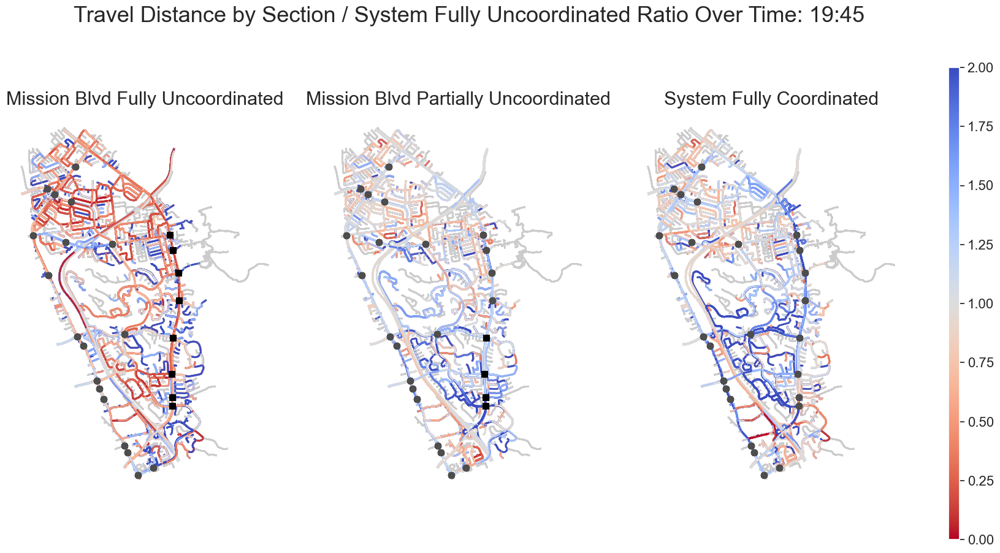

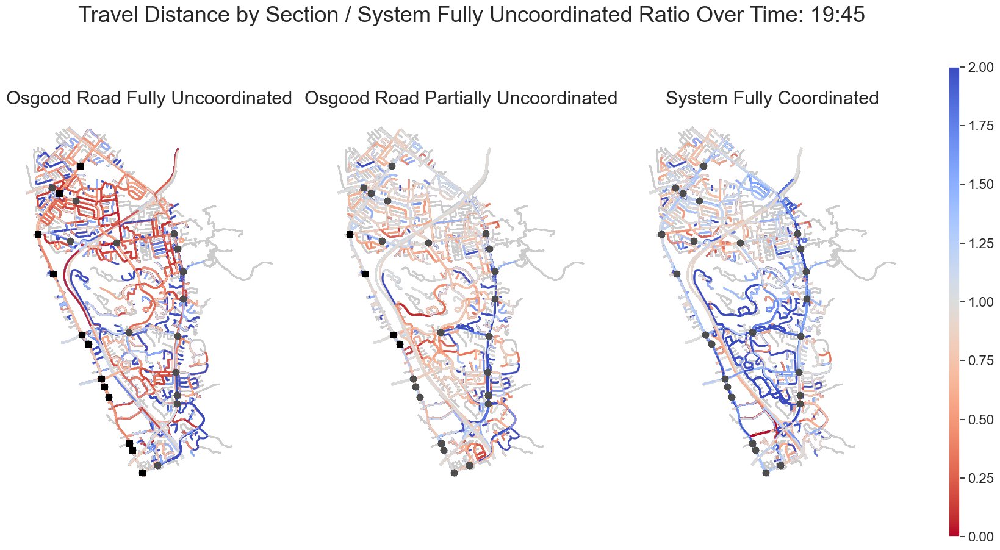

In [ ]:
for k in ['travel']:
    for road in ['mission', 'osgood']:
        multiple_section_animation(
            metric=k, 
            to_plot=[
                f'{road}_fully_uncoordinated',
                f'{road}_partially_uncoordinated_averaged',
                'fully_coordinated_averaged',
                'fully_uncoordinated_averaged'
            ],
            filename=f'{k}_{road}_multiple_comparison.gif'
        )

#### Self comparison

Let $f(s, t)$ denote the value of metric $f$ at section $s \in S$ during time interval $t \in T$. The color at $(s_0, t_0)$ is determined by:

$$\frac{f(s_0, t_0)}{\left(\frac 1{|S|} \sum_s f(s, t_0)\right)^\gamma \cdot \left(\frac 1{|T|} \sum_t f(s_0, t)\right)^{1-\gamma}}$$

where $\gamma = 0.2$ is a parameter determining the relative effect of the choice of $s$ and $t$ (we have selected a small $\gamma$ because the choice of $s$ has a much more significant role than $t$, but we still don't have a good way to select a "good" $\gamma$ for the data).

In [ ]:
from matplotlib import animation
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def compare_to_self_section_animation(metric, which, gamma=0.2):
    """
    Plots ratio of normalized databases in `which` over time
    """

    if metric in ['flow', 'speed']:
        cmap = 'coolwarm_r'
    else:
        cmap = 'coolwarm'
    metric = section_metrics[metric]
    if metric.name == 'density':
        desc = 'Density by Lane'
    else:
        desc = ' '.join(metric.desc.split(' ')[1:])
    print(desc)
    if isinstance(which, str):
        which = [which]
    fig, axs = plt.subplots(1, len(which) + 1, figsize=(5*(len(which)+1), 10), gridspec_kw={'width_ratios': [50]*len(which)+[2]})
    norm = Normalize(vmin=0, vmax=2)
    cb = ColorbarBase(axs[-1], cmap=cmap, norm=norm, orientation='vertical')
    axs[-1].tick_params(labelsize=16)

    plot_databases = {}
    for name in which:
        scenario_desc = unpacked_databases_sect[name]['desc']
        data = unpacked_databases_sect[name]['database']
        data = data[data['ent']!=0]
        data_by_eid = data.groupby('eid').mean().reset_index()
        data_by_ent = data.groupby('ent').mean().reset_index()
        data_by_eid['key'] = 'key'
        data_by_ent['key'] = 'key'
        eid_ent_prod = data_by_eid.merge(data_by_ent, how='outer', on='key', suffixes=['_eid', '_ent']).dropna()
        eid_ent_prod.drop(columns=['ent_eid', 'key'], inplace=True)
        eid_ent_prod.rename({'ent_ent': 'ent'}, axis=1, inplace=True)
        data = data.merge(eid_ent_prod, on=['eid', 'ent'])
        data['ratio'] = data[metric.name] / (data[metric.name+'_eid']**(1-gamma) * data[metric.name+'_ent']**gamma)
        data = gpd.GeoDataFrame(data.merge(sections[['eid', 'geometry']], on='eid'), geometry='geometry')
        plot_databases[name] = {'desc': scenario_desc, 'data': data}

    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        frame_title = f'Normalized (gamma={gamma}) {desc} Over Time: {TIME_INTERVALS_STRING[timestep - 1]}'
        if len(which) == 1:
            frame_title = f"{plot_databases[which[0]]['desc']}, {frame_title}"
        fig.suptitle(frame_title, size=22)
        ims = []

        for i in range(len(which)):
            ax, scenario_desc, data = axs[i], plot_databases[which[i]]['desc'], plot_databases[which[i]]['data']
            affected_nodes = node_geo_city[node_geo_city['id'].isin(databases['fully_coordinated_averaged']['uncoordinated_nodes'])]
            sections.plot(ax=ax, color='0.8', zorder=-1)
            data[data['ent'] == timestep].plot(
                ax=ax, column='ratio', cmap=cmap, lw=2, vmin=0, vmax=2, zorder=0)
            if affected_nodes.shape[0]:
                affected_nodes.plot(ax=ax, color='black', lw=2, zorder=2, marker='s')
            ims.append(node_geo_city.plot(ax=ax, color='0.3', lw=2, zorder=1))
            if len(which) > 1:
                ax.set_title(scenario_desc, size=22)
            ax.axis('off')

        return ims

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.6)
    self_animation_path = f"{image_path}/{'_'.join(which)}"
    if not os.path.exists(self_animation_path):
        os.makedirs(self_animation_path)
    anim.save(f"{self_animation_path}/{metric.name}_self-comparison.gif", writer=writergif)

In [ ]:
for k in section_metrics:
    compare_to_self_section_animation(k, 'fully_coordinated_averaged')

In [ ]:
for k in section_comparisons:
    compare_to_self_section_animation(k, 'fully_uncoordinated_averaged')

In [ ]:
for k in section_metrics:
    compare_to_self_section_animation(k, 
    ['fully_uncoordinated_averaged', 'mission_partially_uncoordinated_averaged', 
     'osgood_partially_uncoordinated_averaged', 'fully_coordinated_averaged'])

## [DEPRECATED] Animations

### Note: this section takes forever to run

In [ ]:
dfs_section = {'uncoordinated': uncoordinated_section_df, 'coordinated': coordinated_section_df}

for k, df in dfs_section.items():
    dfs_section[k] = preprocess_sections_animation(df)

dfs_section['uncoordinated']

,eid,ent,flow,ttime,dtime,speed,density,count
0,242,1,1324.0,24.522981,18.286577,27.208512,50.112778,331.0
1,243,1,1284.0,2.654111,0.038367,105.297945,3.079980,321.0
2,244,1,1312.0,1.820326,0.071486,105.324678,3.220035,328.0
4,247,1,8.0,9.313807,0.851008,45.257797,0.176977,2.0
7,250,1,284.0,7.856093,0.162104,73.459061,3.892242,71.0
...,...,...,...,...,...,...,...,...
329342,36523,24,4.0,7.377708,0.000000,37.877473,0.105604,1.0
329343,36524,24,4.0,5.379831,0.613276,40.013600,0.099966,1.0
329347,3425,24,488.0,4.621014,1.885600,62.718905,3.903328,122.0
329348,56150,24,768.0,1.075209,0.309226,59.136938,6.840158,192.0


In [ ]:
dfs_section['uncoordinated'][(dfs_section['uncoordinated']['eid']=="242") & (dfs_section['uncoordinated']['ent']==1)]

,eid,ent,flow,ttime,dtime,speed,density,count
0,242,1,1324.0,24.522981,18.286577,27.208512,50.112778,331.0


In [ ]:
section_df = dfs_section['uncoordinated'].merge(dfs_section['coordinated'], on=['eid', 'ent'], how='left', suffixes=['_uncoordinated', '_coordinated'])

for k in section_metrics:
    section_df[k+'_ratio'] = section_df[k+'_coordinated'] / section_df[k+'_uncoordinated']

section_df = section_df.dropna()
section_df

,eid,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,count_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,count_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio
0,242,1,1324.0,24.522981,18.286577,27.208512,50.112778,331.0,1356.0,24.155884,17.927443,27.772434,50.106215,339.0,1.024169,0.985030,0.980361,1.020726,0.999869
1,243,1,1284.0,2.654111,0.038367,105.297945,3.079980,321.0,1256.0,2.659904,0.047324,105.051102,3.019156,314.0,0.978193,1.002183,1.233434,0.997656,0.980252
2,243,1,1284.0,2.654111,0.038367,105.297945,3.079980,321.0,1272.0,2.785957,0.050646,105.056933,3.052417,318.0,0.990654,1.049676,1.320019,0.997711,0.991051
3,243,1,1284.0,2.654111,0.038367,105.297945,3.079980,321.0,1268.0,0.562661,0.010235,105.032080,3.044200,317.0,0.987539,0.211996,0.266757,0.997475,0.988383
4,244,1,1312.0,1.820326,0.071486,105.324678,3.220035,328.0,1280.0,1.823788,0.077166,105.117350,3.145367,320.0,0.975610,1.001902,1.079461,0.998032,0.976812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65854,3425,24,488.0,4.621014,1.885600,62.718905,3.903328,122.0,636.0,4.733680,1.994731,60.720573,5.190379,159.0,1.303279,1.024381,1.057876,0.968138,1.329732
65855,56150,24,768.0,1.075209,0.309226,59.136938,6.840158,192.0,828.0,26.831333,22.877550,29.268433,18.928575,207.0,1.078125,24.954532,73.983323,0.494926,2.767272
65856,56150,24,768.0,1.075209,0.309226,59.136938,6.840158,192.0,852.0,1.090531,0.325831,58.184362,7.695855,213.0,1.109375,1.014250,1.053701,0.983892,1.125099
65857,7154,24,1808.0,11.316553,0.118979,105.594055,2.859305,452.0,1324.0,12.284400,0.264690,104.312196,2.541104,331.0,0.732301,1.085525,2.224677,0.987861,0.888714


In [ ]:
section_df = section_df.merge(sections[['eid', 'geometry']], left_on='eid', right_on='eid').set_index('eid')
section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
frame = section_df.to_crs("EPSG:3857")
frame

,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,count_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,count_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,geometry
eid,,,,,,,,,,,,,,,,,,,
242,1,1324.0,24.522981,18.286577,27.208512,50.112778,331.0,1356.0,24.155884,17.927443,27.772434,50.106215,339.0,1.024169,0.985030,0.980361,1.020726,0.999869,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,2,764.0,20.645561,14.473680,32.360839,23.719355,191.0,820.0,21.292549,15.107659,31.413536,26.367021,205.0,1.073298,1.031338,1.043802,0.970727,1.111625,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,3,796.0,21.497040,15.264269,31.139108,26.668741,199.0,748.0,20.712661,14.576582,32.253563,24.012597,187.0,0.939698,0.963512,0.954948,1.035790,0.900402,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,4,872.0,22.878881,16.680540,29.302826,30.219538,218.0,780.0,20.496334,14.287262,32.678167,24.019167,195.0,0.894495,0.895863,0.856523,1.115188,0.794822,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,5,852.0,21.656951,15.442929,30.876784,27.871238,213.0,892.0,22.238980,16.060410,30.088720,30.119886,223.0,1.046948,1.026875,1.039985,0.974477,1.080680,"LINESTRING (-13572344.019 4508460.315, -135723..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29381,22,4.0,8.508370,2.005016,34.752084,0.115101,1.0,4.0,8.347064,1.266354,35.423663,0.112919,1.0,1.000000,0.981042,0.631593,1.019325,0.981042,"LINESTRING (-13574778.890 4515650.959, -135747..."
1606,23,8.0,4.487063,0.768128,35.056167,0.228347,2.0,12.0,4.288029,0.676140,36.667702,0.327328,3.0,1.500000,0.955643,0.880243,1.045970,1.433464,"LINESTRING (-13573105.890 4513157.984, -135730..."
1606,24,16.0,4.472663,0.665884,35.273029,0.455229,4.0,4.0,4.084243,0.563123,38.489702,0.103924,1.0,0.250000,0.913157,0.845677,1.091194,0.228289,"LINESTRING (-13573105.890 4513157.984, -135730..."


### Side by side

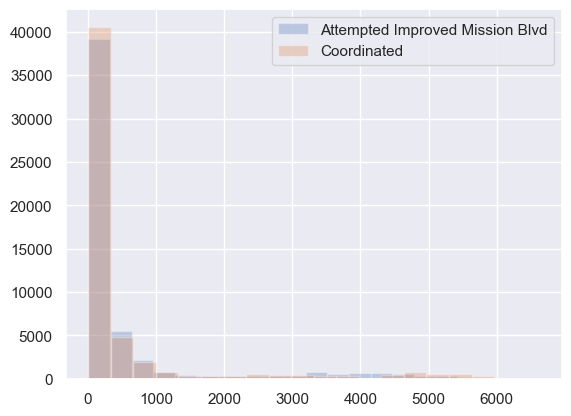

In [ ]:
plt.hist(frame['flow_uncoordinated'], bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(frame['flow_coordinated'], bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

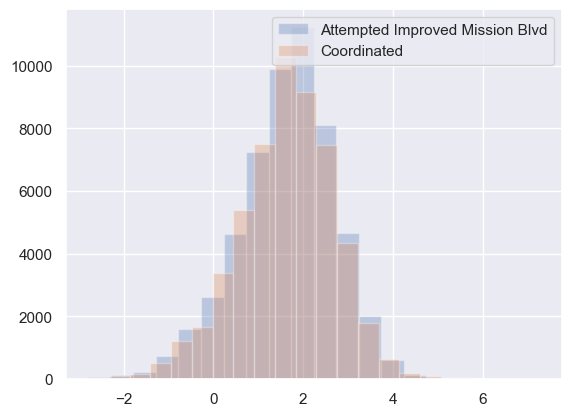

In [ ]:
plt.hist(np.log(frame['ttime_uncoordinated']), bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(np.log(frame['ttime_coordinated']), bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

<AxesSubplot:>

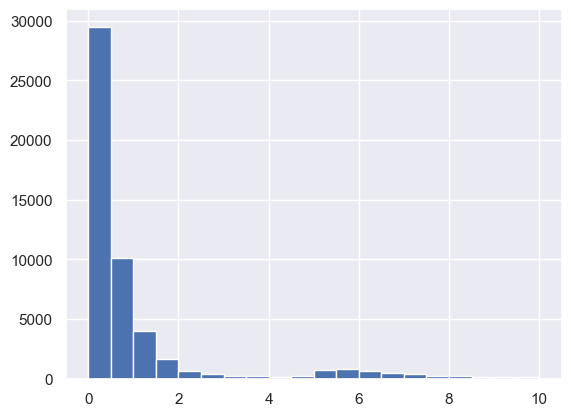

In [ ]:
frame['dtime_uncoordinated'][frame['dtime_uncoordinated'] < 10].hist(bins=20)

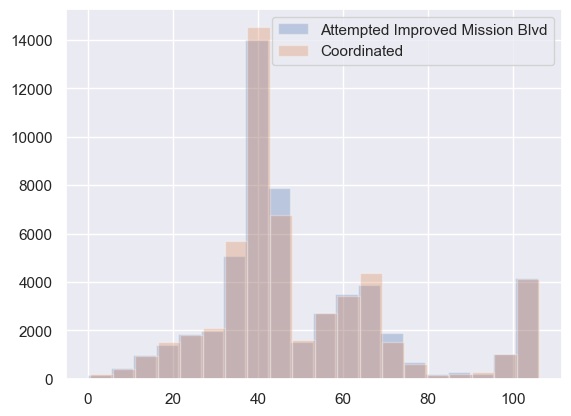

In [ ]:
plt.hist(frame['speed_uncoordinated'], bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(frame['speed_coordinated'], bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

<AxesSubplot:>

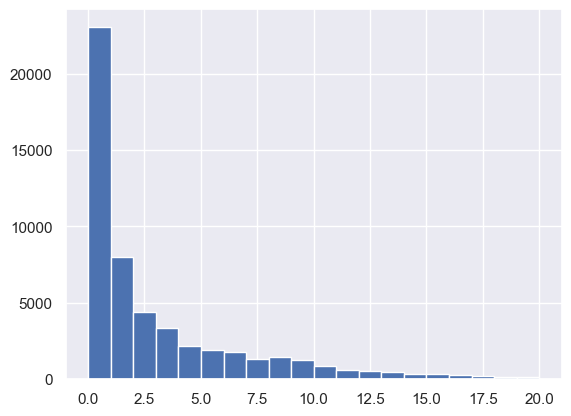

In [ ]:
frame['density_uncoordinated'][frame['density_uncoordinated'] < 20].hist(bins=20)

In [ ]:
frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
frame['log_flow_coordinated'] = np.log(frame['flow_coordinated'])
frame['log_ttime_uncoordinated'] = np.log(frame['ttime_uncoordinated'])
frame['log_ttime_coordinated'] = np.log(frame['ttime_coordinated'])

In [ ]:
section_metrics

{'flow': Column(flow, Mean Flow, veh/h),
 'ttime': Column(ttime, Mean Travel Time, s),
 'dtime': Column(dtime, Mean Delay Time, s),
 'speed': Column(speed, Mean Speed, km/h),
 'density': Column(density, Density by Lane, veh/km)}

In [ ]:
section_comparisons = {
    'flow': (Metric('log_flow', 'Log of mean flow', 'veh/h'), (0, 10)),
    'ttime': (Metric('log_ttime', 'Log of mean travel time', 's'), (-2, 6)),
    'dtime': (section_metrics['dtime'], (0, 2.5)),
    'speed': (section_metrics['speed'], (0, 120)),
    'density': (section_metrics['density'], (0, 8))
}

Processing log_flow, frame 1
Processing log_flow, frame 1
Processing log_flow, frame 2


KeyboardInterrupt: 

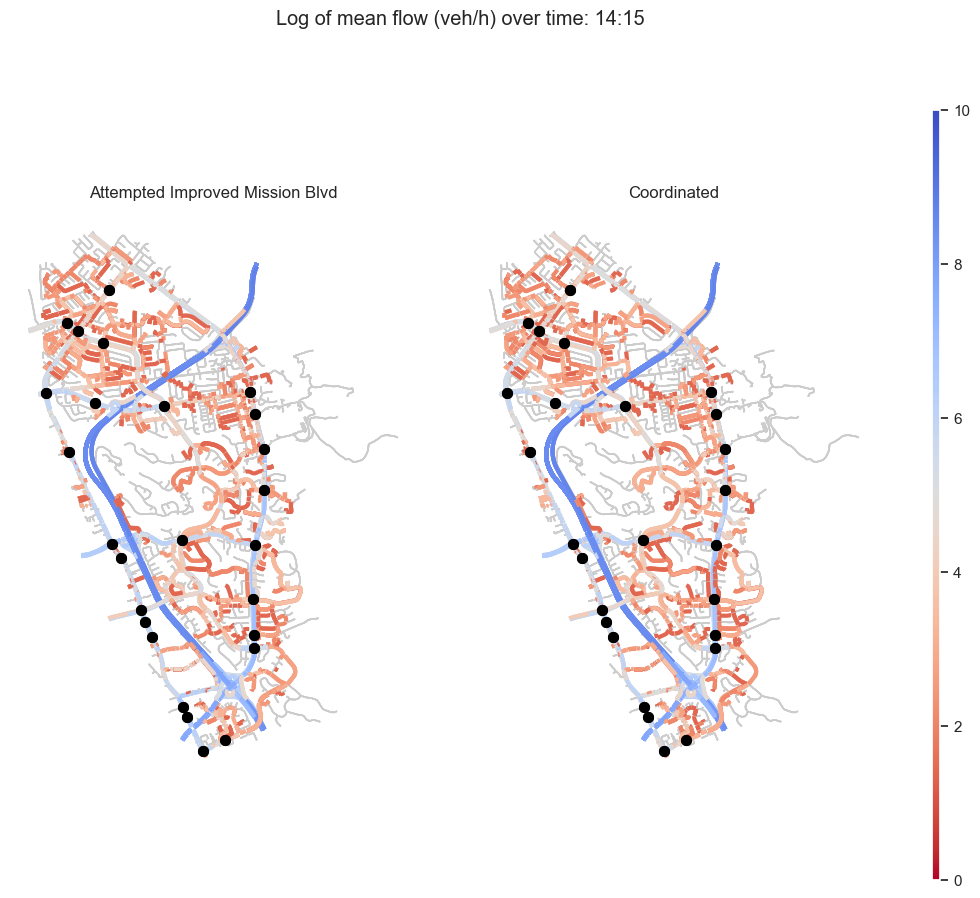

In [ ]:
from matplotlib import animation
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_side_by_side(metric, vmin, vmax):
    fig, [ax1, ax2, cax] = plt.subplots(1, 3, figsize=(12, 10), gridspec_kw={"width_ratios":[50,50,1]})
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} ({metric.unit}) over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax1, lw=1, color='0.8', zorder=-1)
        sections.plot(ax=ax2, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax1, column=(metric.name + '_uncoordinated'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        data.plot(ax=ax2, column=(metric.name + '_coordinated'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        im1 = node_geo_city.plot(ax=ax1, color='black', lw=2, zorder=1)
        im2 = node_geo_city.plot(ax=ax2, color='black', lw=2, zorder=1)
        ax1.set_title(uncoordinated_description)
        ax2.set_title(coordinated_description)
        ax1.set_axis_off()
        ax2.set_axis_off()
        return [im1, im2]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.6)
    anim.save(f'{image_path}/{metric.name}_side_by_side.gif', writer=writergif)

for k in section_metrics:
    metric, (vmin, vmax) = section_comparisons[k]
    make_animation_side_by_side(metric, vmin, vmax)

In [ ]:
for k in ['dtime', 'density']:
    metric, (vmin, vmax) = section_comparisons[k]
    make_animation_side_by_side(metric, vmin, vmax)

### Ratio

In [ ]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_ratio(metric):
    fig, [ax,cax] = plt.subplots(1, 2, figsize=(7, 9), gridspec_kw={"width_ratios":[50,1]})
    norm = Normalize(vmin=0, vmax=2)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    ax.set_axis_off()
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} coordinated/uncoordinated ratio over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax, column=(metric.name + '_ratio'), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
        im = node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        return [im]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.8)
    anim.save(f'{image_path}/{metric.name}_ratio.gif', writer=writergif)

for k in section_metrics:
    make_animation_ratio(section_metrics[k])

In [ ]:
make_animation_ratio(section_metrics['speed'])

### Difference

In [ ]:
for k in section_metrics:
    frame[k + '_difference'] = frame[k + '_coordinated'] - frame[k + '_uncoordinated']

frame

,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,count_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,...,geometry,log_flow_uncoordinated,log_flow_coordinated,log_ttime_uncoordinated,log_ttime_coordinated,flow_difference,ttime_difference,dtime_difference,speed_difference,density_difference
eid,,,,,,,,,,,,,,,,,,,,,
242,1,1324.0,24.522981,18.286577,27.208512,50.112778,331.0,1356.0,24.155884,17.927443,...,"LINESTRING (-13572344.019 4508460.315, -135723...",7.188413,7.212294,3.199611,3.184528,32.0,-0.367097,-0.359134,0.563923,-0.006563
242,2,764.0,20.645561,14.473680,32.360839,23.719355,191.0,820.0,21.292549,15.107659,...,"LINESTRING (-13572344.019 4508460.315, -135723...",6.638568,6.709304,3.027500,3.058357,56.0,0.646988,0.633979,-0.947303,2.647666
242,3,796.0,21.497040,15.264269,31.139108,26.668741,199.0,748.0,20.712661,14.576582,...,"LINESTRING (-13572344.019 4508460.315, -135723...",6.679599,6.617403,3.067915,3.030745,-48.0,-0.784380,-0.687687,1.114455,-2.656144
242,4,872.0,22.878881,16.680540,29.302826,30.219538,218.0,780.0,20.496334,14.287262,...,"LINESTRING (-13572344.019 4508460.315, -135723...",6.770789,6.659294,3.130214,3.020246,-92.0,-2.382547,-2.393278,3.375341,-6.200370
242,5,852.0,21.656951,15.442929,30.876784,27.871238,213.0,892.0,22.238980,16.060410,...,"LINESTRING (-13572344.019 4508460.315, -135723...",6.747587,6.793466,3.075326,3.101847,40.0,0.582029,0.617481,-0.788064,2.248648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29381,22,4.0,8.508370,2.005016,34.752084,0.115101,1.0,4.0,8.347064,1.266354,...,"LINESTRING (-13574778.890 4515650.959, -135747...",1.386294,1.386294,2.141050,2.121910,0.0,-0.161306,-0.738663,0.671579,-0.002182
1606,23,8.0,4.487063,0.768128,35.056167,0.228347,2.0,12.0,4.288029,0.676140,...,"LINESTRING (-13573105.890 4513157.984, -135730...",2.079442,2.484907,1.501198,1.455827,4.0,-0.199034,-0.091988,1.611534,0.098980
1606,24,16.0,4.472663,0.665884,35.273029,0.455229,4.0,4.0,4.084243,0.563123,...,"LINESTRING (-13573105.890 4513157.984, -135730...",2.772589,1.386294,1.497984,1.407137,-12.0,-0.388419,-0.102761,3.216674,-0.351305


<AxesSubplot:>

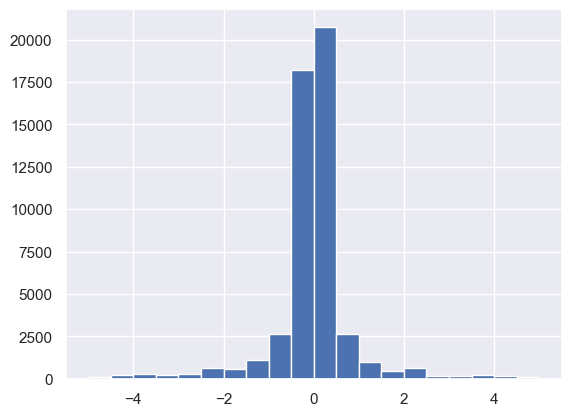

In [ ]:
frame['ttime_difference'][abs(frame['ttime_difference']) < 5].hist(bins=20)

<AxesSubplot:>

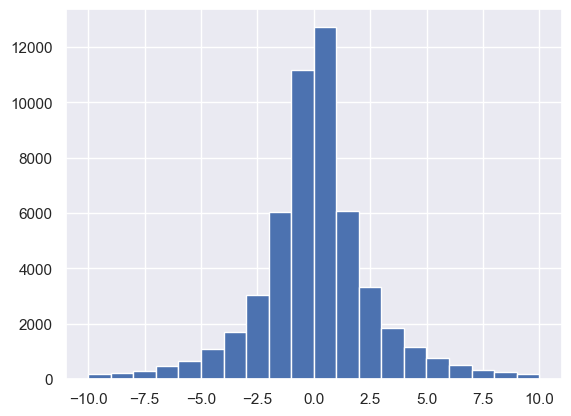

In [ ]:
frame['speed_difference'][abs(frame['speed_difference']) < 10].hist(bins=20)

In [ ]:
section_comparisons_diff = {
    'ttime': (section_metrics['ttime'], (-10, 10)),
    'speed': (section_metrics['speed'], (-10, 10))
}

In [ ]:
sections

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (-13572344.019 4508460.315, -135723..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (-13572329.348 4508264.159, -135722..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (-13572464.084 4508415.329, -135724..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (-13571458.486 4509669.510, -135714..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (-13571596.214 4509623.139, -135715..."
...,...,...,...,...,...,...,...,...,...,...,...
4428,151597396.0,28550,Fernald Common,1,40.0,600.0,179.0,5,42395.0,NaN,"LINESTRING (-13572473.917 4507663.732, -135724..."
4429,151600599.0,28581,Alice Court,1,40.0,600.0,179.0,5,39784.0,NaN,"LINESTRING (-13575454.502 4513910.059, -135754..."
4430,151616088.0,3425,None,2,104.0,2100.0,175.0,1,56586.0,151616089.0,"LINESTRING (-13574102.042 4511052.704, -135741..."
4431,151616494.0,56150,None,2,72.0,1800.0,177.0,3,56168.0,151616495.0,"LINESTRING (-13574438.360 4511038.633, -135744..."


Processing ttime, frame 1
Processing ttime, frame 1
Processing ttime, frame 2
Processing ttime, frame 3
Processing ttime, frame 4
Processing ttime, frame 5


KeyboardInterrupt: 

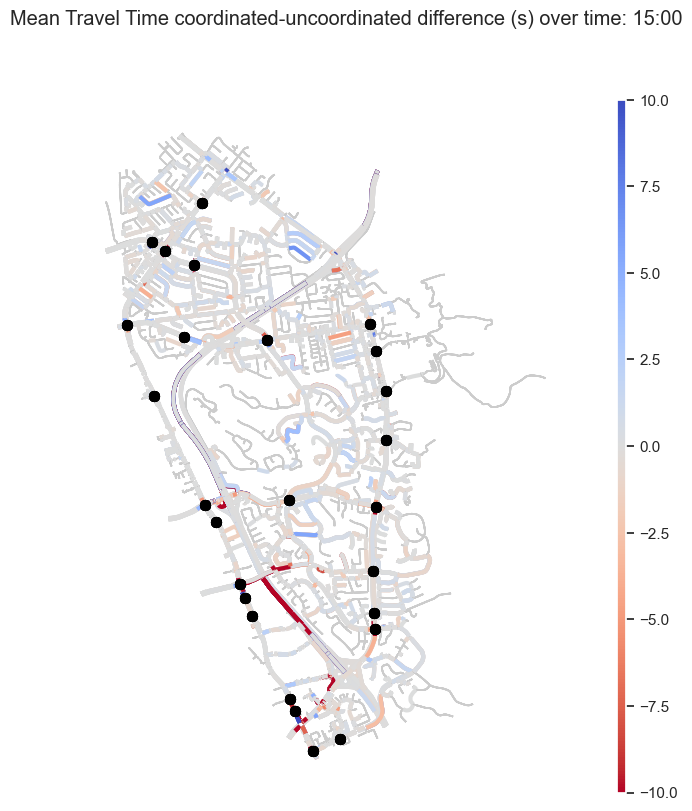

In [ ]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_diff(metric, vmin, vmax):
    fig, [ax,cax] = plt.subplots(1, 2, figsize=(7, 9), gridspec_kw={"width_ratios":[50,1]})
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    ax.set_axis_off()
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} coordinated-uncoordinated difference ({metric.unit}) over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax, column=(metric.name + '_difference'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        im = node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        return [im]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.8)
    anim.save(f'{image_path}/{metric.name}_difference.gif', writer=writergif)
    # plt.show()

for k in ['ttime', 'speed']:
    metric, (vmin, vmax) = section_comparisons_diff[k]
    make_animation_diff(metric, vmin, vmax)

# MP4 generation

Because direct MP4 writing doesn't work.

In [ ]:
import moviepy.editor as mp

def gif_to_mp4(path=image_path):
    for filename in os.listdir(path):
        f = os.path.join(path, filename)
        name, ext = f.split('.')
        if os.path.isfile(f) and ext == 'gif':
            clip = mp.VideoFileClip(f)
            clip.write_videofile(name + ".mp4")

gif_to_mp4()

Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\density_mission_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\density_mission_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\density_mission_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\density_osgood_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\density_osgood_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\density_osgood_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\dtime_mission_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\dtime_mission_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\dtime_mission_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\dtime_osgood_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\dtime_osgood_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\dtime_osgood_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\flow_mission_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\flow_mission_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\flow_mission_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\flow_osgood_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\flow_osgood_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\flow_osgood_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\speed_mission_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\speed_mission_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\speed_mission_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\speed_osgood_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\speed_osgood_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\speed_osgood_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\travel_mission_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\travel_mission_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\travel_mission_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\travel_osgood_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\travel_osgood_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\travel_osgood_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\ttime_mission_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\ttime_mission_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\ttime_mission_multiple_comparison.mp4
Moviepy - Building video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\ttime_osgood_multiple_comparison.mp4.
Moviepy - Writing video C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\ttime_osgood_multiple_comparison.mp4



Moviepy - Done !
Moviepy - video ready C:/Users/prest/Preston/Berkeley/fremont_project/images/2023-02-19/100\ttime_osgood_multiple_comparison.mp4


<a id='od'></a>
# OD Data

In [ ]:
uncoordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', uncoordinated_con)
uncoordinated_od_df = pd.DataFrame(uncoordinated_od_query)

uncoordinated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [ ]:
coordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', coordinated_con)
coordinated_od_df = pd.DataFrame(coordinated_od_query)

coordinated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [ ]:
dfs_od = {'uncoordinated': uncoordinated_od_df, 'coordinated': coordinated_od_df}
od_columns = {
    'oid': Metric('oid', 'Origin Centroid ID', None),
    'eid': Metric('eid', 'Origin Centroid External ID', None),
    'destination': Metric('destination', 'Destination Centroid ID', None),
    'speed': Metric('speed', 'Mean Speed', 'km/h'),
    'ttime': Metric('ttime', 'Mean Travel Time', 's'),
    'dtime': Metric('dtime', 'Mean Delay Time', 's')
}
od_column_names = list(od_columns.keys())

mean_dist = Metric('mean_dist', 'Mean Travel Distance', 'km')

def preprocess_od(df):
    df = df[(df['sid']==0) & (df['nbveh']>0)][od_column_names]
    df['mean_dist'] = df['speed'] * df['ttime'] / 3600
    df['oid'] = df['oid'].astype(int)
    df['destination'] = df['destination'].astype(int)
    return df

for k, df in dfs_od.items():
    dfs_od[k] = preprocess_od(df)

dfs_od['uncoordinated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
79,151634377,int_0,151635727,92.354351,257.477739,24.204354,6.605330
81,151634377,int_0,151635733,44.388216,317.837200,178.763933,3.918952
85,151634377,int_0,151635745,41.809689,148.246362,66.308671,1.721704
86,151634377,int_0,0,67.726652,245.259760,73.370328,4.614062
166,151634402,int_1,151635727,51.018652,621.714604,210.039434,8.810845
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,39.247670,272.716084,103.902120,2.973186
546170,151635745,ext_10,151635648,55.183013,23.320849,3.579845,0.357476
546172,151635745,ext_10,151635666,38.882711,193.086533,75.910481,2.085480
546173,151635745,ext_10,151635689,38.088003,313.202431,121.040948,3.313682


In [ ]:
od_columns_compare = {
    'speed': od_columns['speed'],
    'ttime': od_columns['ttime'],
    'dtime': od_columns['dtime'],
    'mean_dist': mean_dist
}

od_df = dfs_od['uncoordinated'][od_columns_compare].join(
    dfs_od['coordinated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_coordinated')

for k in od_columns:
    if k not in od_columns_compare:
        od_df[k] = dfs_od['uncoordinated'][k]

for k in od_columns_compare:
    od_df[f'{k}_ratio'] = od_df[f'{k}_coordinated'] / od_df[f'{k}_uncoordinated']

od_df

C:\Users\prest\AppData\Local\Temp\ipykernel_19828\2171387974.py:8: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  od_df = dfs_od['uncoordinated'][od_columns_compare].join(
C:\Users\prest\AppData\Local\Temp\ipykernel_19828\2171387974.py:9: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  dfs_od['coordinated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_coordinated')


,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
79,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
81,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
85,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
86,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
166,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628
546170,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
546172,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396
546173,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089


In [ ]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio']].sort_values(by=f'{metric_name}_ratio')
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

speed_head, speed_tail = most_impacted('speed', 30)
ttime_head, ttime_tail = most_impacted('ttime', 30)
dtime_head, dtime_tail = most_impacted('dtime', 30)
mean_dist_head, mean_dist_tail = most_impacted('mean_dist', 30)

### [Deprecated] Aggregate plots

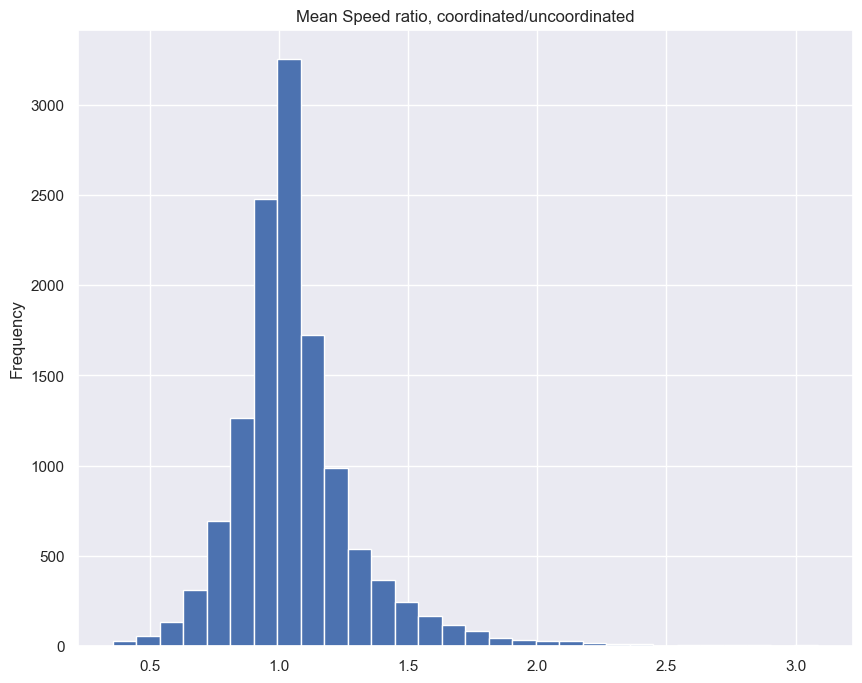

In [ ]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated')

plot('speed')

In [ ]:
ttime_head

,oid,eid,destination,ttime_ratio
343588,151635727,ext_4,151634880,0.081138
321158,151635727,ext_4,151635189,0.083253
386185,151635369,int_52,151635727,0.089397
251509,151635369,int_52,151635727,0.100849
186212,151635718,ext_1,151635051,0.103029
433881,151635745,ext_10,151634657,0.112350
478785,151635745,ext_10,151634869,0.112844
366050,151635727,ext_4,151635189,0.113747
365754,151635718,ext_1,151634543,0.113993
276004,151635718,ext_1,151635184,0.115693


In [ ]:
ttime_tail

,oid,eid,destination,ttime_ratio
517990,151634794,int_19,151635727,3.919011
209099,151635733,ext_6,151635156,4.032392
475099,151635210,int_42,151635727,4.038954
494066,151634411,int_2,151635730,4.080168
456031,151635733,ext_6,151635521,4.087135
521303,151635426,int_57,0,4.203302
520172,151635245,int_44,0,4.254069
364960,151635541,int_66,151635736,4.338458
292483,151634562,int_7,151635718,4.356811
366175,151635730,ext_5,151635727,4.461773


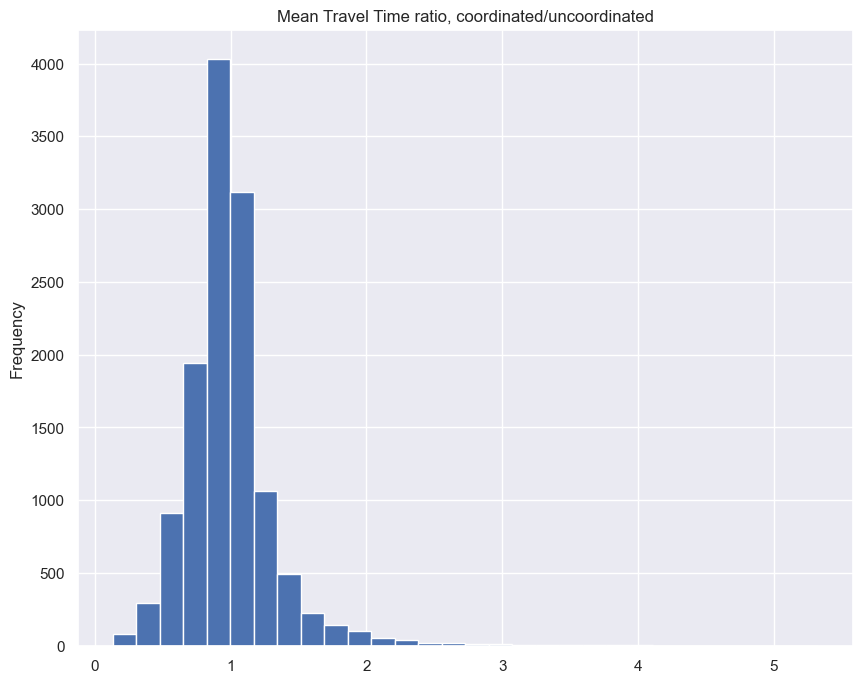

In [ ]:
plot('ttime')

In [ ]:
dtime_head

,oid,eid,destination,dtime_ratio
141295,151635718,ext_1,151634562,0.000000
343588,151635727,ext_4,151634880,0.003340
321142,151635727,ext_4,151634880,0.009139
433881,151635745,ext_10,151634657,0.009925
321158,151635727,ext_4,151635189,0.011903
366050,151635727,ext_4,151635189,0.014377
523665,151635745,ext_10,151634657,0.014594
186212,151635718,ext_1,151635051,0.014761
478785,151635745,ext_10,151634869,0.017532
115965,151635210,int_42,151635733,0.017967


In [ ]:
dtime_tail

,oid,eid,destination,dtime_ratio
520172,151635245,int_44,0,15.368207
472931,151634742,int_17,0,15.443538
343630,151635727,ext_4,151635580,15.915375
433399,151635727,ext_4,151635369,18.249832
521303,151635426,int_57,0,18.771056
340771,151635291,int_46,151635727,19.083676
497542,151635210,int_42,151635718,19.375453
501102,151635739,ext_8,151635600,19.810160
115090,151635051,int_32,151635718,20.757686
366175,151635730,ext_5,151635727,21.113179


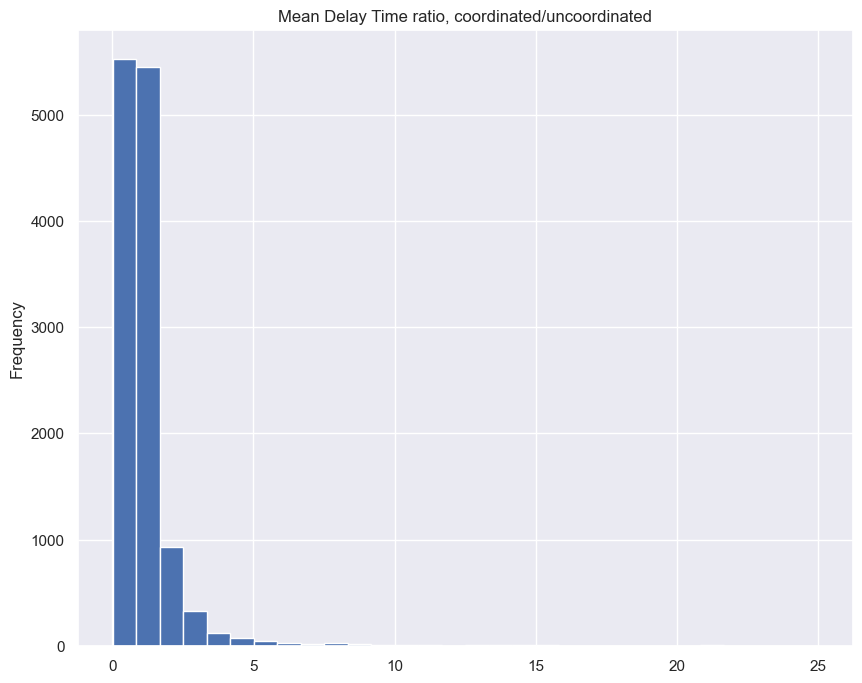

In [ ]:
plot('dtime')

In [ ]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio', f'{metric_name}_uncoordinated', f'{metric_name}_coordinated']].sort_values(by=f'{metric_name}_ratio')
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

dtime_head, dtime_tail = most_impacted('dtime', 30)

In [ ]:
mean_dist_head

,oid,eid,destination,mean_dist_ratio
186212,151635718,ext_1,151635051,0.144938
206617,151635369,int_52,151635727,0.167274
163766,151635718,ext_1,151635051,0.173291
343588,151635727,ext_4,151634880,0.186352
386185,151635369,int_52,151635727,0.187834
433881,151635745,ext_10,151634657,0.193940
523665,151635745,ext_10,151634657,0.206138
251509,151635369,int_52,151635727,0.209318
542087,151635156,int_38,151635721,0.210298
543305,151635369,int_52,151635721,0.212869


In [ ]:
mean_dist_tail

,oid,eid,destination,mean_dist_ratio
184170,151635369,int_52,151635724,3.034943
520172,151635245,int_44,0,3.036516
321575,151635742,ext_9,151634856,3.161087
342344,151635521,int_64,0,3.180844
231893,151635745,ext_10,151635156,3.239525
366086,151635727,ext_4,151635721,3.313751
388532,151635727,ext_4,151635721,3.368565
478016,151635718,ext_1,151635156,3.406220
545532,151635724,ext_3,151635210,3.415292
522922,151635718,ext_1,151635369,3.433632


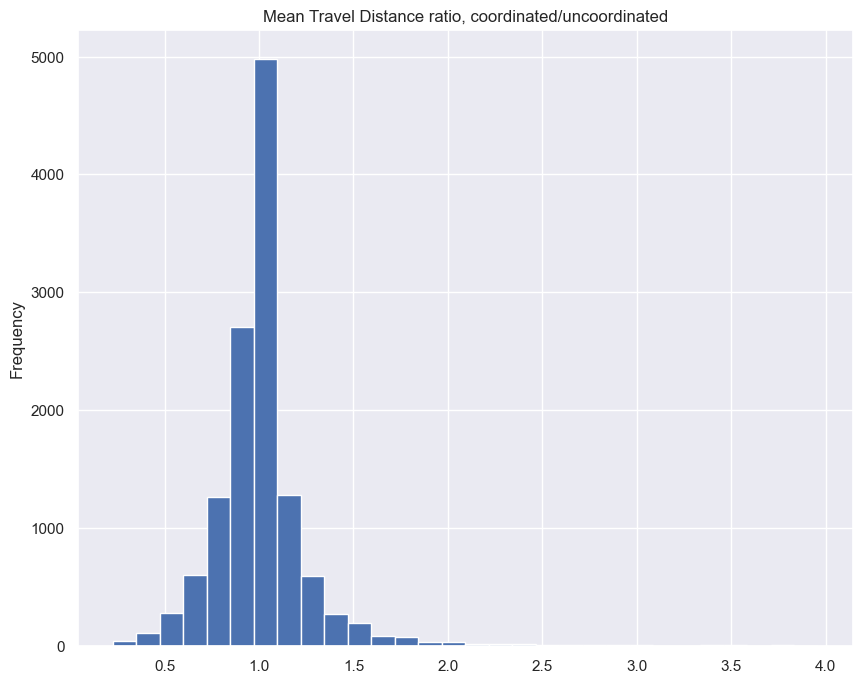

In [ ]:
od_columns['mean_dist'] = mean_dist
plot('mean_dist')

In [ ]:
od_df = od_df.reset_index(drop=True)
# for each destination, find a matching oid, find the corresponding eid, and add it to the dataframe
od_df['destination_eid'] = od_df[['destination', 'eid']].merge(od_df.drop_duplicates('oid'), how='left', left_on='destination', right_on='oid')['eid_y']
od_df.dropna(inplace=True)
od_df = od_df.merge(centroids[['eid', 'geometry']], on='eid').rename(columns={'geometry': 'geometry_o'})
od_df = od_df.merge(centroids[['eid', 'geometry']], left_on='destination_eid', right_on='eid').rename(columns={'geometry': 'geometry_d'})

od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,93.439947,254.545882,21.283111,6.606876,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.000001,1.000005,0.999951,1.000007
1,62.929270,224.256787,85.170097,3.920088,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.179942,0.847399,0.598194,0.999881
2,38.387348,161.413347,79.468188,1.721175,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,1.000205,1.000000,0.999888,1.000205
3,72.049128,223.690474,51.801127,4.476862,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.039319,0.961756,0.834787,0.999572
4,54.602431,596.081131,193.243738,9.040966,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,0.969748,1.024796,1.076213,0.993793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13402,43.327070,222.116244,72.908197,2.673235,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.005521,1.006139,0.902637,1.011694
13403,44.083712,43.073778,23.332774,0.527459,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,1.234267,0.543644,0.157538,0.671002
13404,38.786776,176.597402,69.408483,1.902679,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.952609,1.222396,1.375933,1.164466
13405,43.740765,238.080925,82.335420,2.892734,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.050263,0.955548,0.836824,1.003577


### Colored line plots

In [ ]:
from shapely.geometry import Point, LineString, Polygon

od_df['geometry'] = od_df[['geometry_o', 'geometry_d']].apply(lambda *args: LineString(*args), axis=1)
od_df.rename(columns={'eid_x': 'eid'})
del od_df['eid_y']
od_df = gpd.GeoDataFrame(od_df, geometry='geometry')
od_df.crs = 'EPSG:3857'
od_df.groupby(['eid_x', 'destination_eid']).size().reset_index(name='num_trips')

NameError: name 'od_df' is not defined

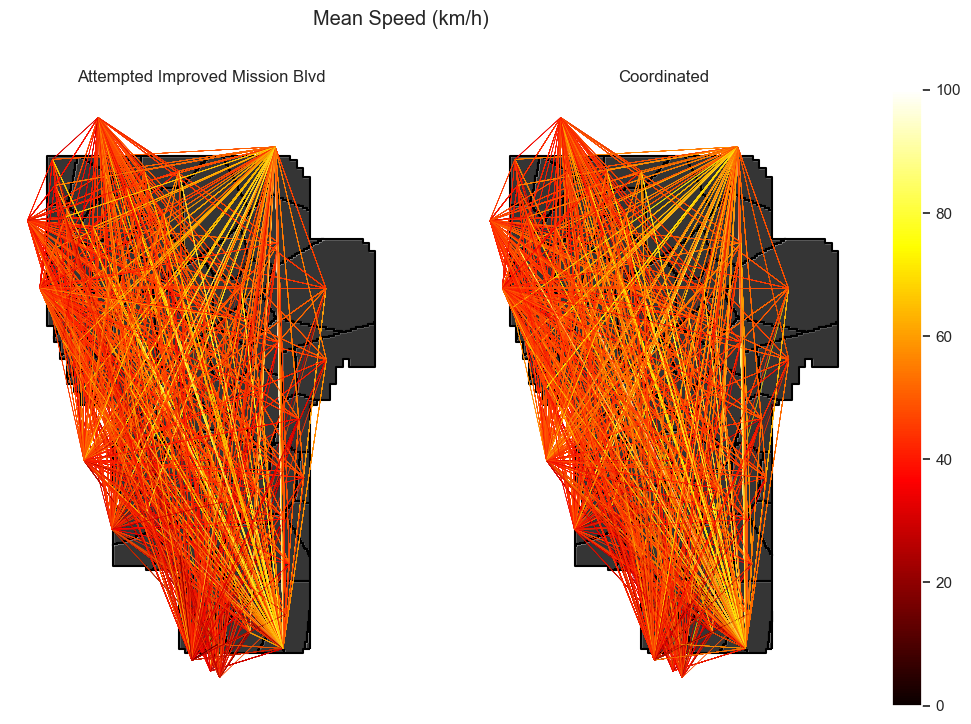

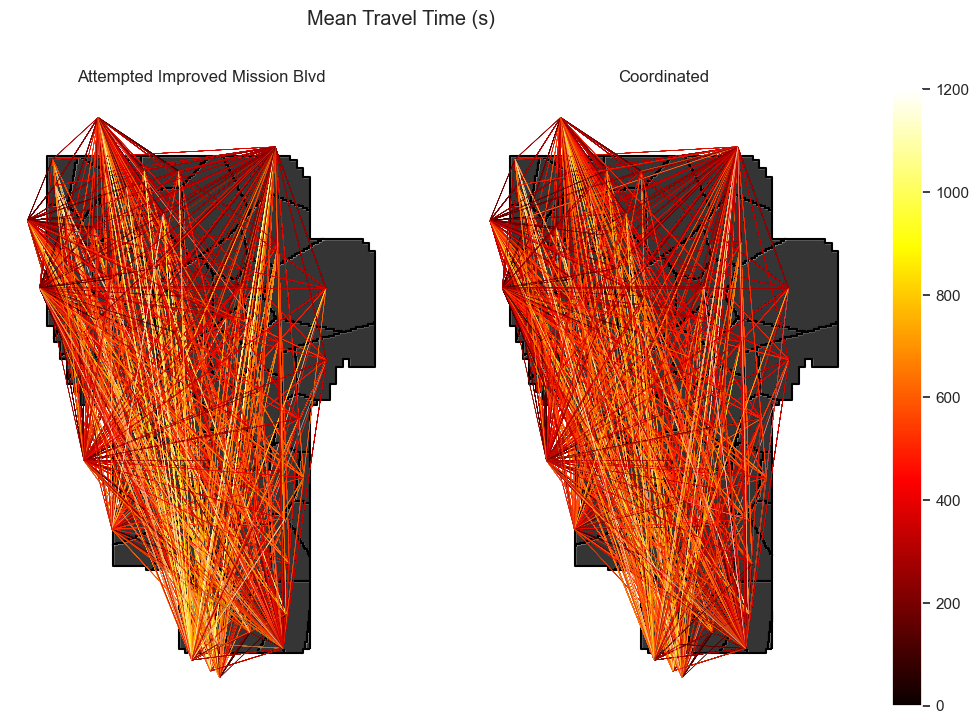

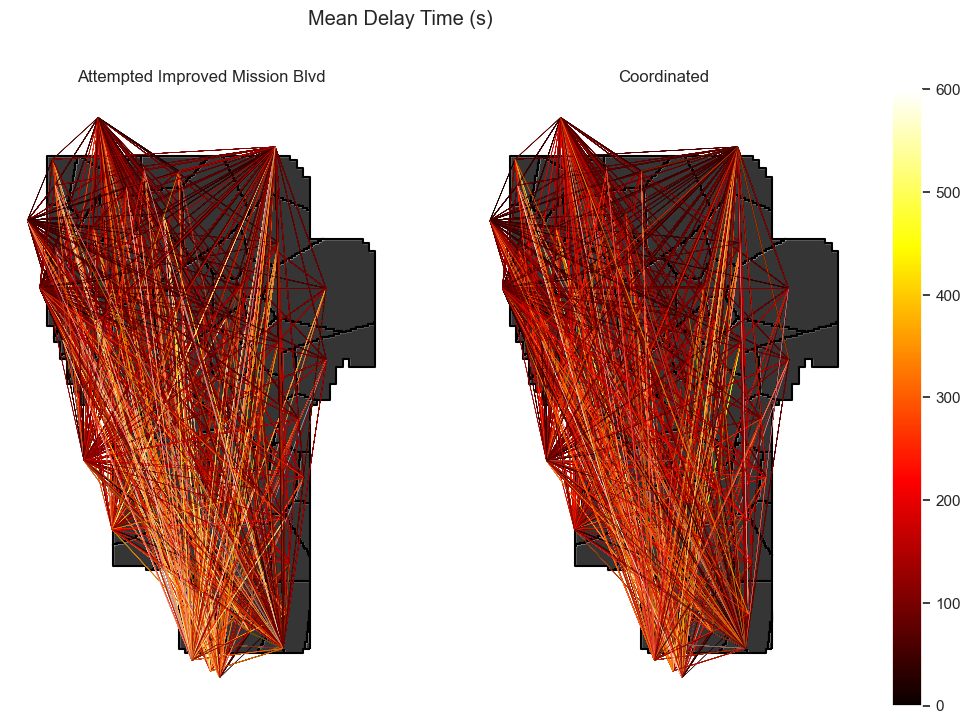

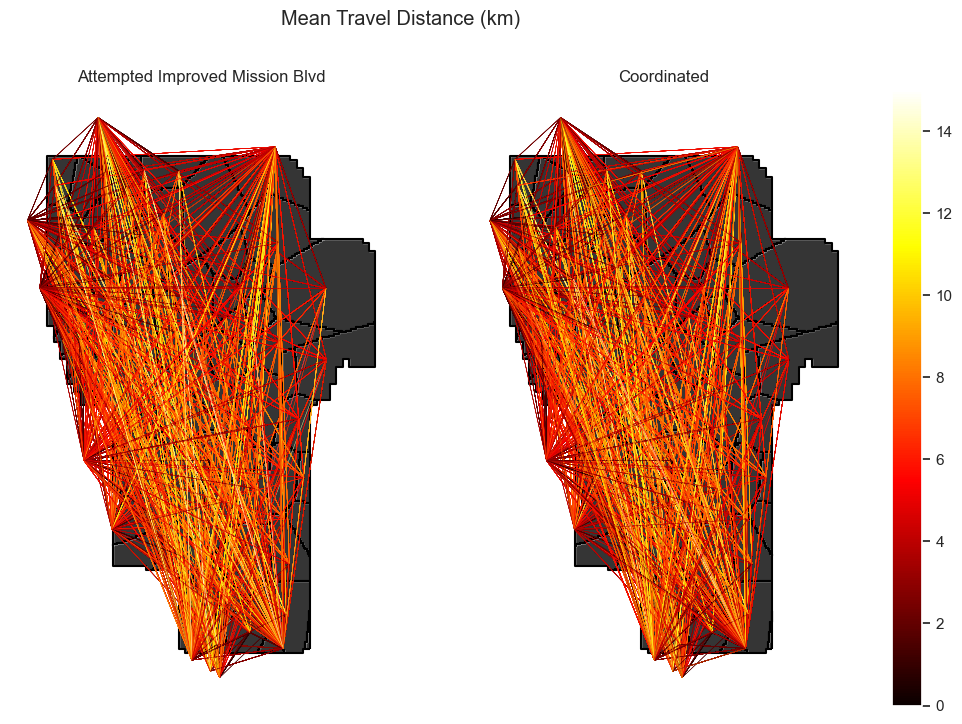

In [ ]:
bounds = {
    'speed': (0, 100),
    'ttime': (0, 1200),
    'dtime': (0, 600),
    'mean_dist': (0, 15)
}

for i in range(4):
    fig, axs = plt.subplots(1, 2, figsize=(15, 8))
    metric = od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
    fig.suptitle(f'{metric.desc} ({metric.unit})')
    vmin, vmax = bounds[metric.name]

    for j in range(2):
        suffix = ['_uncoordinated', '_coordinated'][j]
        label = [uncoordinated_description, coordinated_description][j]
        ax = axs[j]
        taz_int.plot(ax=ax, color='#353535', zorder=0)
        taz_int.boundary.plot(ax=ax, color='black', zorder=1)
        od_df.sample(frac=1).plot(
            ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, vmin=vmin, vmax=vmax, zorder=2)
        ax.set_title(label)
        ax.axis('off')

    plt.subplots_adjust(wspace=-0.4)
    save_fig(f'centroid/{metric.name}.png')
    plt.close()

In [ ]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated')

### Mostly vs fully coordinated inverse ratio plotting

Inverted to emphasize that red = bad and blue = good, to visually assess how bad the mostly coordinated scenario is.

In [ ]:
centroid_means = gpd.GeoDataFrame(od_df.groupby('eid_x').mean().merge(centroids[['eid', 'geometry']], left_index=True, right_on='eid'), geometry='geometry')
centroid_means = centroid_means.to_crs('EPSG:3857')
centroid_means

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,eid,geometry
76,37.605160,680.025101,371.265941,6.627607,44.691626,531.443441,238.681029,6.314470,151635718.0,1.516351e+08,1.270939,0.814318,0.743313,0.962912,ext_1,POINT (-13573357.287 4507368.344)
85,43.826066,340.330777,119.444385,3.933965,46.130675,321.020469,105.563225,3.879815,151635745.0,1.516350e+08,1.068725,0.967794,1.095263,0.996715,ext_10,POINT (-13575933.355 4513673.488)
77,38.561956,654.757554,333.784090,7.074220,41.216586,578.829384,275.882830,6.788947,151635721.0,1.516353e+08,1.149279,0.942513,0.970589,1.011019,ext_2,POINT (-13573042.528 4507181.778)
78,43.346353,522.098259,214.859233,6.260301,44.373007,511.471062,210.448043,6.138560,151635724.0,1.516351e+08,1.042434,1.014304,1.128179,1.006424,ext_3,POINT (-13572885.333 4507072.584)
79,63.649878,369.719616,104.899987,6.200566,64.087122,360.044198,101.235910,6.059791,151635727.0,1.516351e+08,1.040161,1.008669,1.232655,1.002035,ext_4,POINT (-13571810.274 4507565.394)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,46.271564,443.632748,203.867176,5.197928,48.159192,427.463643,180.076774,5.232285,151634562.0,1.516357e+08,1.122249,1.070039,1.174880,1.121867,int_7,POINT (-13572372.811 4507834.274)
71,53.618993,360.294710,117.348923,5.179238,57.556636,335.220095,115.676583,5.254080,151635648.0,1.516357e+08,1.082467,0.953063,0.967167,1.030646,int_71,POINT (-13575755.335 4513344.897)
73,45.675938,601.295315,223.404939,7.146087,45.664889,579.798143,223.475081,6.875464,151635666.0,1.516357e+08,1.023198,1.068503,1.647161,1.026853,int_73,POINT (-13575027.500 4514704.241)
74,45.113501,492.696846,175.031871,5.894842,47.609387,456.649175,151.697927,5.762997,151635689.0,1.516357e+08,1.075327,0.993340,1.092564,1.015366,int_74,POINT (-13572521.812 4513700.187)


In [ ]:
for metric_name in ['speed', 'ttime', 'dtime', 'mean_dist']:
    centroid_means[metric_name + '_ratio_inv'] = centroid_means[metric_name + '_uncoordinated'] / centroid_means[metric_name + '_coordinated']
    centroid_means[metric_name + '_diff_inv'] = centroid_means[metric_name + '_uncoordinated'] - centroid_means[metric_name + '_coordinated']

centroid_means

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,...,eid,geometry,speed_ratio_inv,speed_diff_inv,ttime_ratio_inv,ttime_diff_inv,dtime_ratio_inv,dtime_diff_inv,mean_dist_ratio_inv,mean_dist_diff_inv
76,37.605160,680.025101,371.265941,6.627607,44.691626,531.443441,238.681029,6.314470,151635718.0,1.516351e+08,...,ext_1,POINT (-13573357.287 4507368.344),0.841436,-7.086466,1.279581,148.581659,1.555490,132.584912,1.049590,0.313137
85,43.826066,340.330777,119.444385,3.933965,46.130675,321.020469,105.563225,3.879815,151635745.0,1.516350e+08,...,ext_10,POINT (-13575933.355 4513673.488),0.950042,-2.304608,1.060153,19.310308,1.131496,13.881160,1.013957,0.054150
77,38.561956,654.757554,333.784090,7.074220,41.216586,578.829384,275.882830,6.788947,151635721.0,1.516353e+08,...,ext_2,POINT (-13573042.528 4507181.778),0.935593,-2.654629,1.131175,75.928170,1.209876,57.901260,1.042020,0.285273
78,43.346353,522.098259,214.859233,6.260301,44.373007,511.471062,210.448043,6.138560,151635724.0,1.516351e+08,...,ext_3,POINT (-13572885.333 4507072.584),0.976863,-1.026653,1.020778,10.627197,1.020961,4.411190,1.019832,0.121741
79,63.649878,369.719616,104.899987,6.200566,64.087122,360.044198,101.235910,6.059791,151635727.0,1.516351e+08,...,ext_4,POINT (-13571810.274 4507565.394),0.993177,-0.437243,1.026873,9.675419,1.036193,3.664077,1.023231,0.140776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,46.271564,443.632748,203.867176,5.197928,48.159192,427.463643,180.076774,5.232285,151634562.0,1.516357e+08,...,int_7,POINT (-13572372.811 4507834.274),0.960804,-1.887628,1.037826,16.169105,1.132113,23.790401,0.993434,-0.034357
71,53.618993,360.294710,117.348923,5.179238,57.556636,335.220095,115.676583,5.254080,151635648.0,1.516357e+08,...,int_71,POINT (-13575755.335 4513344.897),0.931587,-3.937643,1.074800,25.074615,1.014457,1.672340,0.985755,-0.074842
73,45.675938,601.295315,223.404939,7.146087,45.664889,579.798143,223.475081,6.875464,151635666.0,1.516357e+08,...,int_73,POINT (-13575027.500 4514704.241),1.000242,0.011049,1.037077,21.497172,0.999686,-0.070142,1.039361,0.270624
74,45.113501,492.696846,175.031871,5.894842,47.609387,456.649175,151.697927,5.762997,151635689.0,1.516357e+08,...,int_74,POINT (-13572521.812 4513700.187),0.947576,-2.495886,1.078940,36.047671,1.153818,23.333944,1.022878,0.131845


In [ ]:
centroid_means_regions = gpd.GeoDataFrame(centroid_means.merge(taz_int, how='left', left_on='eid', right_on='CentroidID'), geometry='geometry_y')
centroid_means_regions.loc[centroid_means_regions['geometry_y'].isna(), 'geometry_y'] = centroid_means_regions['geometry_x']
centroid_means_regions

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,...,speed_diff_inv,ttime_ratio_inv,ttime_diff_inv,dtime_ratio_inv,dtime_diff_inv,mean_dist_ratio_inv,mean_dist_diff_inv,label,CentroidID,geometry_y
0,37.605160,680.025101,371.265941,6.627607,44.691626,531.443441,238.681029,6.314470,151635718.0,1.516351e+08,...,-7.086466,1.279581,148.581659,1.555490,132.584912,1.049590,0.313137,NaN,NaN,POINT (-13573357.287 4507368.344)
1,43.826066,340.330777,119.444385,3.933965,46.130675,321.020469,105.563225,3.879815,151635745.0,1.516350e+08,...,-2.304608,1.060153,19.310308,1.131496,13.881160,1.013957,0.054150,NaN,NaN,POINT (-13575933.355 4513673.488)
2,38.561956,654.757554,333.784090,7.074220,41.216586,578.829384,275.882830,6.788947,151635721.0,1.516353e+08,...,-2.654629,1.131175,75.928170,1.209876,57.901260,1.042020,0.285273,NaN,NaN,POINT (-13573042.528 4507181.778)
3,43.346353,522.098259,214.859233,6.260301,44.373007,511.471062,210.448043,6.138560,151635724.0,1.516351e+08,...,-1.026653,1.020778,10.627197,1.020961,4.411190,1.019832,0.121741,NaN,NaN,POINT (-13572885.333 4507072.584)
4,63.649878,369.719616,104.899987,6.200566,64.087122,360.044198,101.235910,6.059791,151635727.0,1.516351e+08,...,-0.437243,1.026873,9.675419,1.036193,3.664077,1.023231,0.140776,NaN,NaN,POINT (-13571810.274 4507565.394)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,46.271564,443.632748,203.867176,5.197928,48.159192,427.463643,180.076774,5.232285,151634562.0,1.516357e+08,...,-1.887628,1.037826,16.169105,1.132113,23.790401,0.993434,-0.034357,7.0,int_7,"POLYGON ((-13572837.026 4507927.101, -13572814..."
62,53.618993,360.294710,117.348923,5.179238,57.556636,335.220095,115.676583,5.254080,151635648.0,1.516357e+08,...,-3.937643,1.074800,25.074615,1.014457,1.672340,0.985755,-0.074842,71.0,int_71,"POLYGON ((-13575442.014 4512165.170, -13575419..."
63,45.675938,601.295315,223.404939,7.146087,45.664889,579.798143,223.475081,6.875464,151635666.0,1.516357e+08,...,0.011049,1.037077,21.497172,0.999686,-0.070142,1.039361,0.270624,73.0,int_73,"POLYGON ((-13572213.749 4507534.408, -13572213..."
64,45.113501,492.696846,175.031871,5.894842,47.609387,456.649175,151.697927,5.762997,151635689.0,1.516357e+08,...,-2.495886,1.078940,36.047671,1.153818,23.333944,1.022878,0.131845,74.0,int_74,"POLYGON ((-13573104.305 4509330.198, -13573104..."


Determining bounds


    speed:
        lower: -4.508843914855514
        upper: 1.890064311500196
        mean:  -1.1616017280783657
    


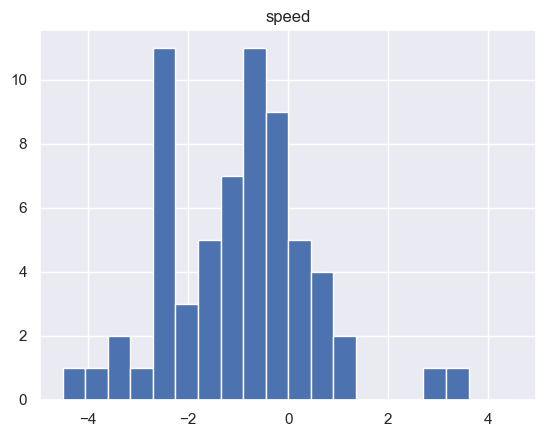


    ttime:
        lower: -30.463454914047738
        upper: 94.8627069630945
        mean:  23.997683496374638
    


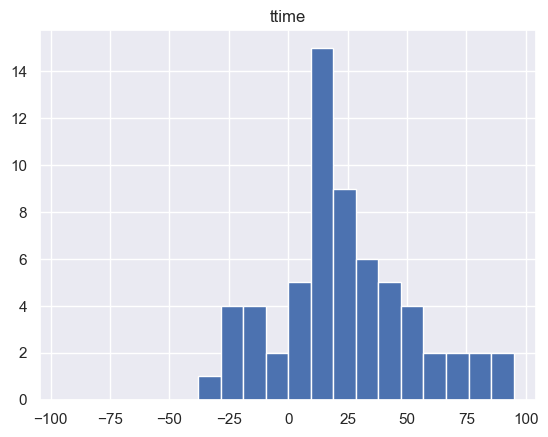


    dtime:
        lower: -37.57100641490245
        upper: 63.25716019813528
        mean:  13.043205041151921
    


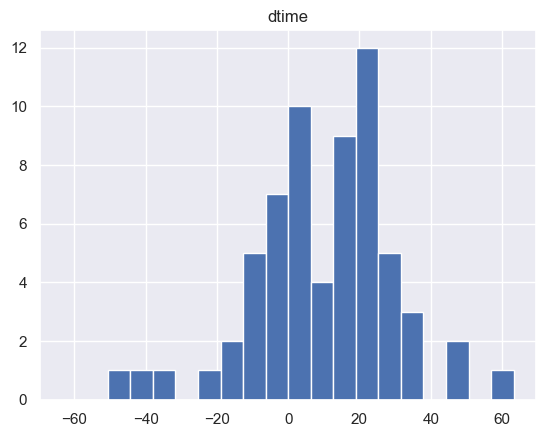


    mean_dist:
        lower: -0.39183246716823805
        upper: 0.7348475840954138
        mean:  0.11441930379811249
    


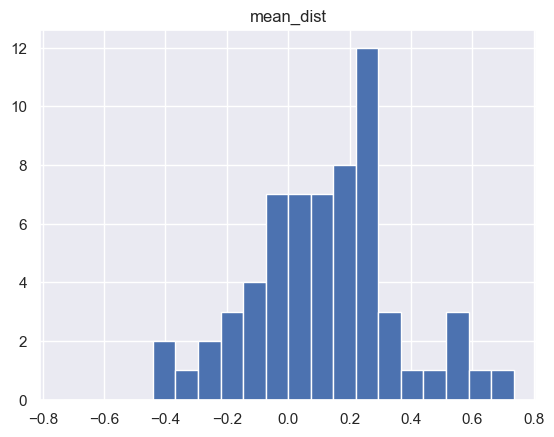

In [ ]:
outlier_cutoff = 0.025

for k in ['speed', 'ttime', 'dtime', 'mean_dist']:
    lower = centroid_means[k + '_diff_inv'].quantile(outlier_cutoff)
    upper = centroid_means[k + '_diff_inv'].quantile(1 - outlier_cutoff)
    mean = centroid_means[k + '_diff_inv'].mean()
    graph_bound = max(abs(lower), abs(upper))
    print(f'''
    {k}:
        lower: {lower}
        upper: {upper}
        mean:  {mean}
    ''')
    centroid_means[k + '_diff_inv'].hist(range=[-graph_bound,graph_bound], bins=20)
    plt.title(k)
    plt.show()

Plots

In [ ]:
mostly_vs_fully_todo = {
    'speed': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km/h), mostly coordinated - fully coordinated', -6, 6)],
    'ttime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -125, 125)], 
    'dtime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -50, 50)], 
    'mean_dist': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km), mostly coordinated - fully coordinated', -0.5, 0.5)]
}

fully_vs_fully_todo = {
    'speed': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km/h), fully coordinated - fully coordinated', -9, 9)],
    'ttime': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), fully coordinated - fully coordinated', -145, 145)], 
    'dtime': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), fully coordinated - fully coordinated', -111, 111)], 
    'mean_dist': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km), fully coordinated - fully coordinated', -0.66, 0.66)]
}

mostly_vs_fully_200_todo = {
    'speed': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km/h), mostly coordinated - fully coordinated', -8, 8)],
    'ttime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -286, 286)], 
    'dtime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -275, 275)], 
    'mean_dist': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km), mostly coordinated - fully coordinated', -1, 1)]
}

### CHANGE THIS

In [ ]:
todo = mostly_vs_fully_200_todo

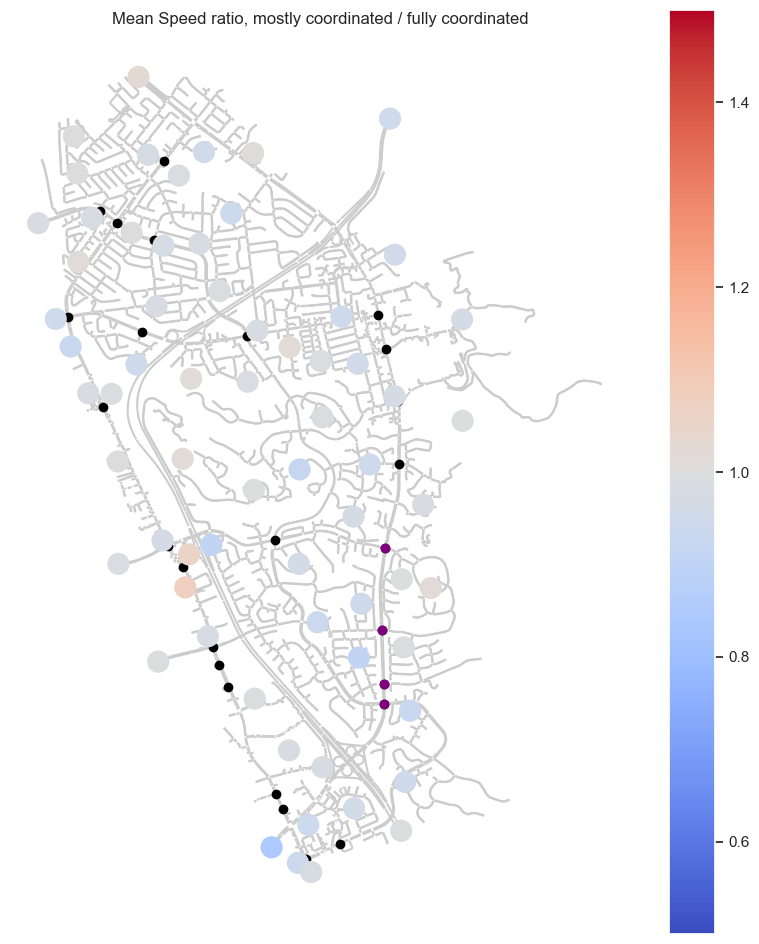

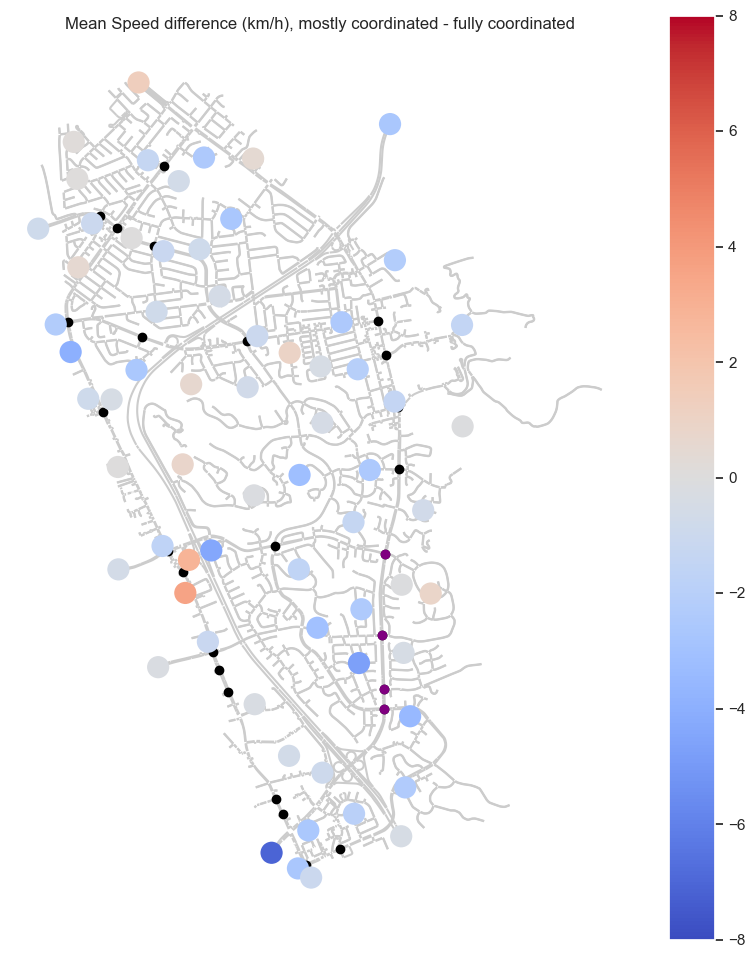

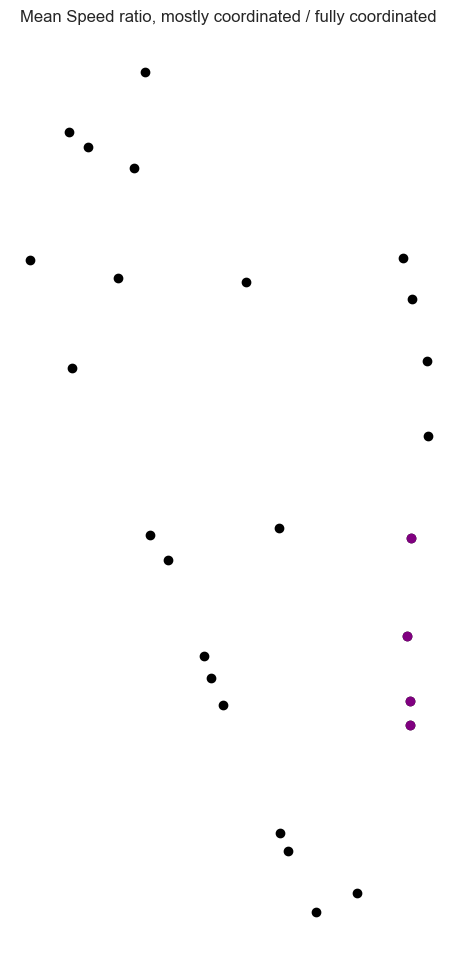

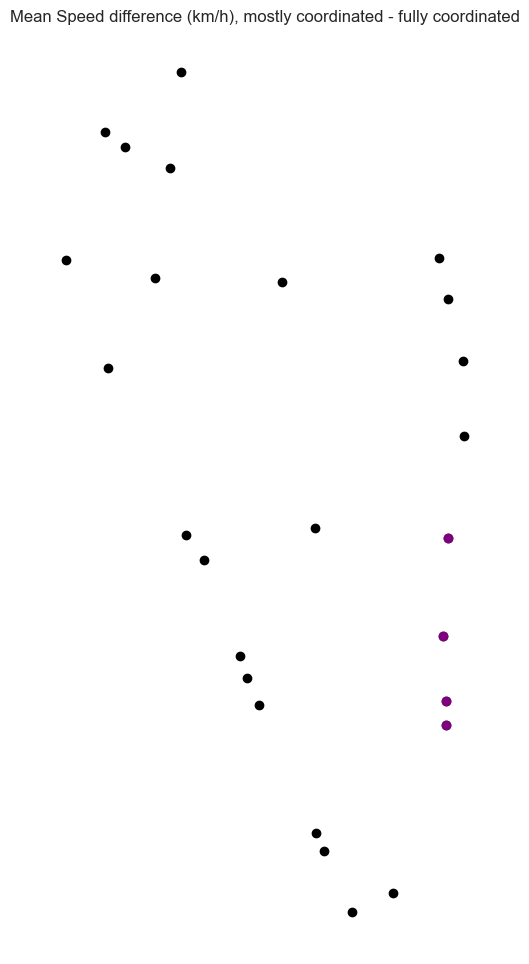

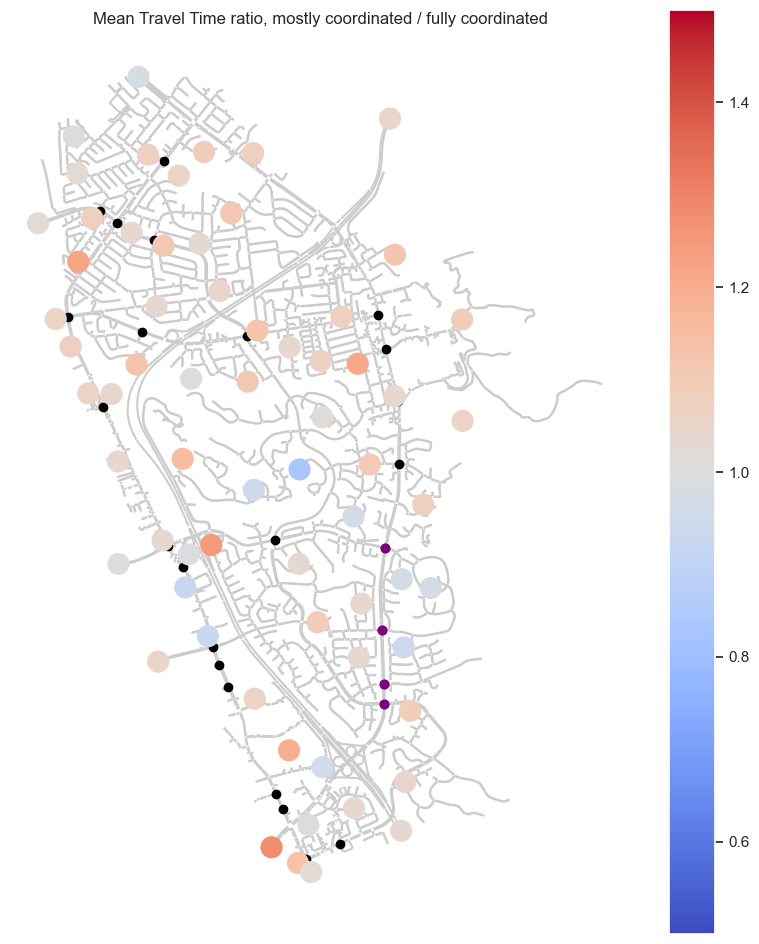

...

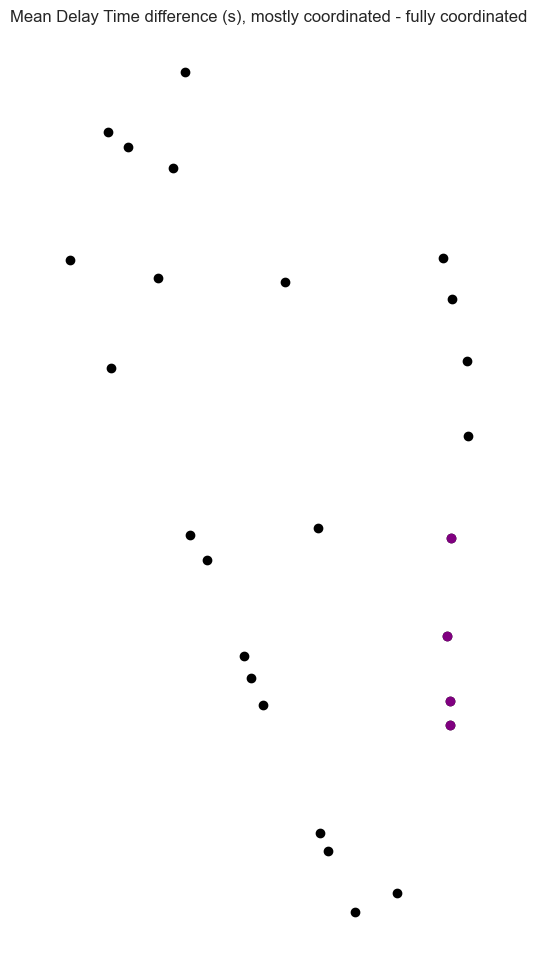

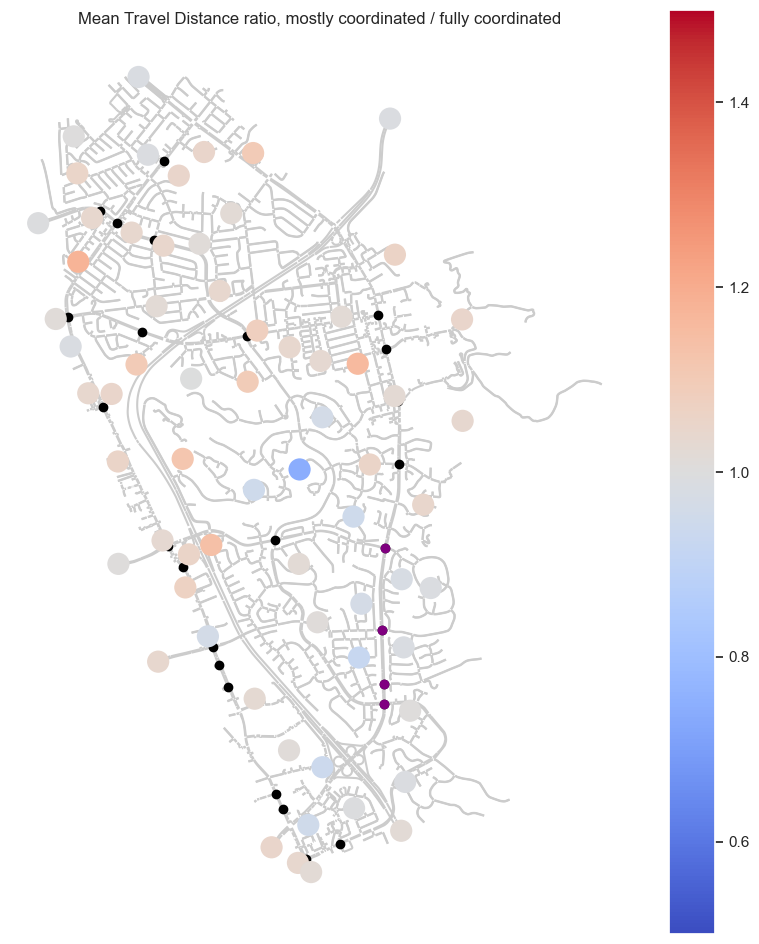

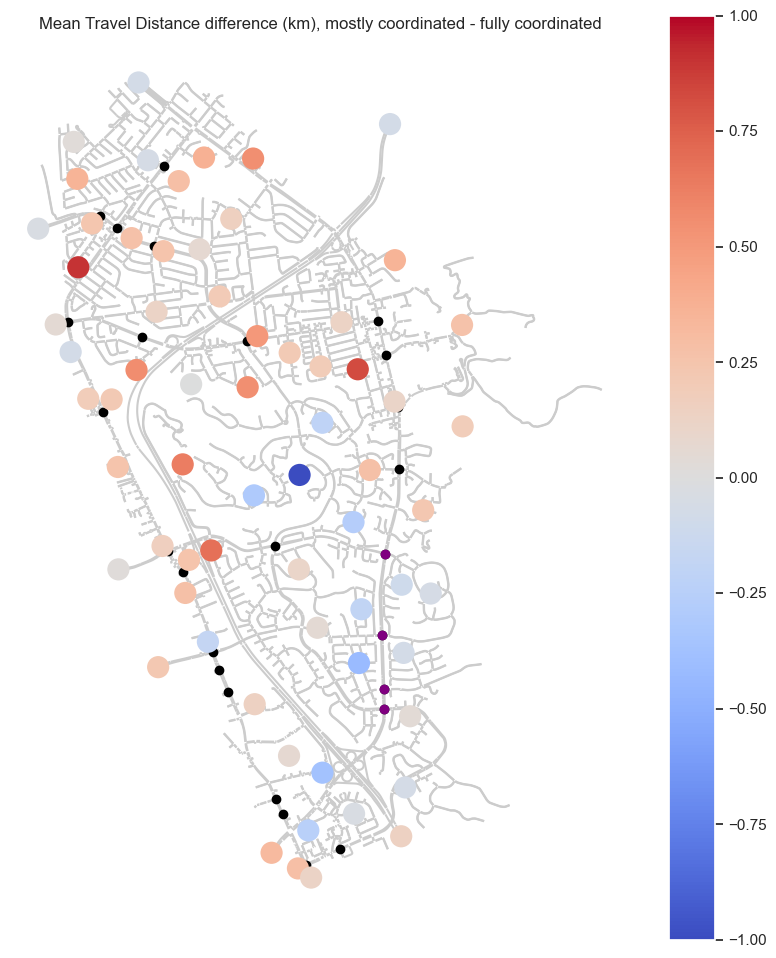

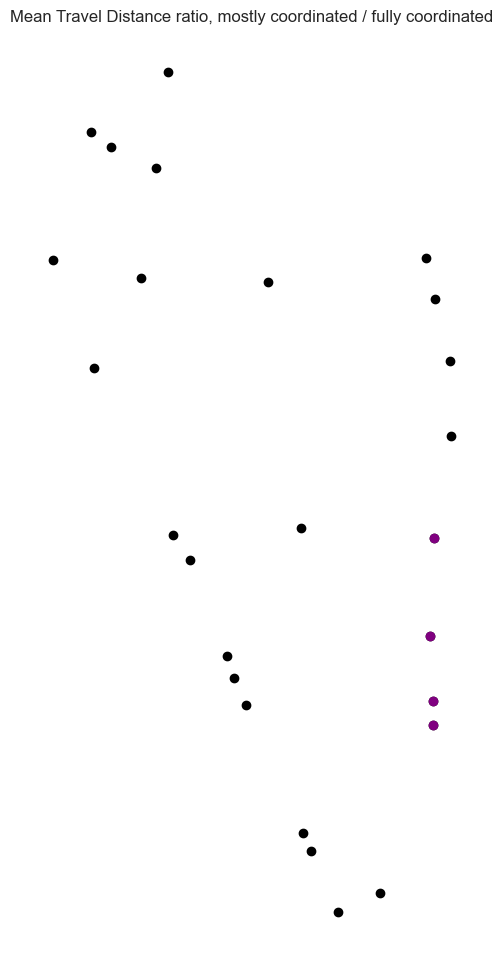

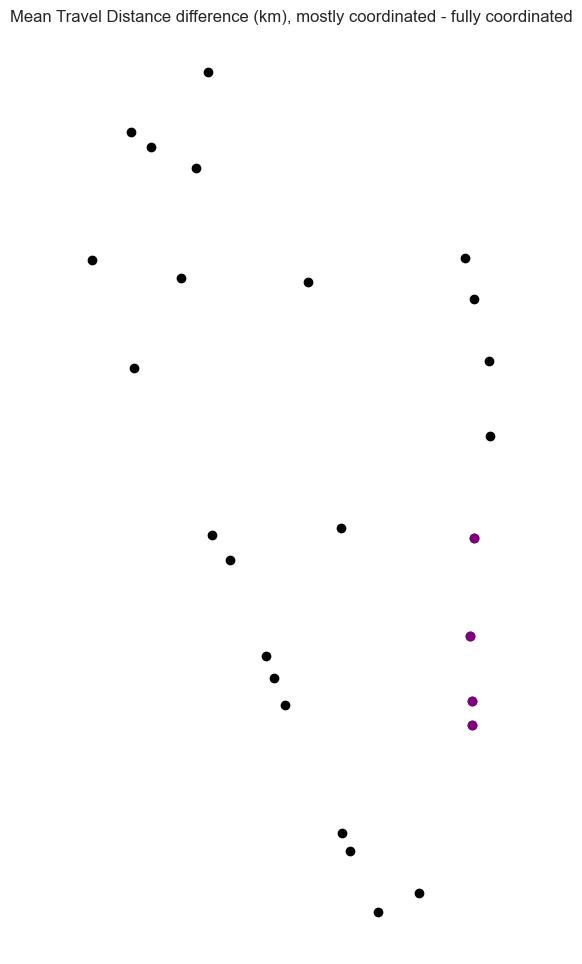

In [ ]:
plt.rc('font', size=40)

for metric_name in todo.keys():
    for shade_regions in [False, True]:
        metric = od_columns[metric_name]
        for suffix, desc, vmin, vmax in todo[metric_name]:
            fig, ax = plt.subplots(1, 1, figsize=(10, 12))
            ax.axis('off')
            node_geo_city.plot(ax=ax, lw=1, color='black', zorder=1)
            affected_nodes.plot(ax=ax, lw=1, color='purple', zorder=3)
            if shade_regions:
                pass
                # sections.plot(ax=ax, color='0.55', zorder=0)
                # centroid_means_regions.plot(ax=ax, column=metric_name + suffix, legend=True, cmap='coolwarm', lw=2, vmin=vmin, vmax=vmax, zorder=-1)
            else:
                sections.plot(ax=ax, color='0.8', zorder=0)
                centroid_means.plot(ax=ax, column=metric_name + suffix, legend=True, cmap='coolwarm', lw=10, vmin=vmin, vmax=vmax, zorder=2)
            
            plt.rcParams.update({'font.size': 40})
            plt.title(f'{metric.desc} {desc}', wrap=True)
            save_fig(f"{metric_name + suffix}{('_taz' if shade_regions else '')}.png")
            plt.close()

## Multiple comparison plots

In [ ]:
unpacked_databases_od = unpack_databases('MICENT_O')

Processed Uncoordinated
Processed Uncoordinated
Processed Uncoordinated
Processed Coordinated
Processed Coordinated
Processed Coordinated
Processed Coordinated but Mission Blvd
Processed Coordinated but Mission Blvd
Processed Coordinated but Mission Blvd
Processed Coordinated but Osgood Road
Processed Coordinated but Osgood Road
Processed Coordinated but Osgood Road
Processed Mission Blvd Fully Uncoordinated
Processed Osgood Road Fully Uncoordinated


In [ ]:
unpacked_databases_od_mean = unpacked_databases_od.copy()

for k, v in unpacked_databases_od_mean.items():
    desc, df = v['desc'], v['database'].copy()
    df = preprocess_od(df).groupby('eid').mean().reset_index()
    df = df.merge(centroids[['eid', 'geometry']], on='eid').drop(columns=['oid', 'destination'])
    df = gpd.GeoDataFrame(df, geometry='geometry')
    df = df.to_crs("EPSG:3857")
    unpacked_databases_od_mean[k]['database'] = df

unpacked_databases_od_mean

{'fully_uncoordinated': {'desc': 'Uncoordinated',
  'database':        eid      speed       ttime       dtime  mean_dist  \
  0    ext_1  38.525177  662.893485  334.399183   6.879794   
  1   ext_10  41.902565  383.355447  146.138469   4.262834   
  2    ext_2  34.710657  791.253418  433.281484   7.741914   
  3    ext_3  37.100288  678.382762  330.074411   6.828012   
  4    ext_4  62.343141  394.902740  115.852378   6.471620   
  ..     ...        ...         ...         ...        ...   
  61   int_7  42.766645  510.227519  249.771245   5.690874   
  62  int_71  45.768539  472.532376  175.001050   5.738981   
  63  int_73  43.860177  584.771671  216.906298   7.069747   
  64  int_74  45.384544  506.173594  180.888289   6.180879   
  65   int_8  38.164753  537.052509  207.840987   5.462328   
  
                               geometry  
  0   POINT (-13573357.287 4507368.344)  
  1   POINT (-13575933.355 4513673.488)  
  2   POINT (-13573042.528 4507181.778)  
  3   POINT (-13572885.

Mean Speed
Metric: speed (km/h) | Uncoordinated: 30.242854003939417 | Fully Coordinated: 31.604938927131855
Metric: speed (km/h) | Coordinated but Mission Blvd: 32.06404213871871 | Fully Coordinated: 31.604938927131855
Metric: speed (km/h) | Coordinated but Osgood Road: 32.75690500938804 | Fully Coordinated: 31.604938927131855
Metric: speed (km/h) | Mission Blvd Fully Uncoordinated: 47.355443416971475 | Fully Coordinated: 31.604938927131855
Metric: speed (km/h) | Osgood Road Fully Uncoordinated: 45.03916500138609 | Fully Coordinated: 31.604938927131855


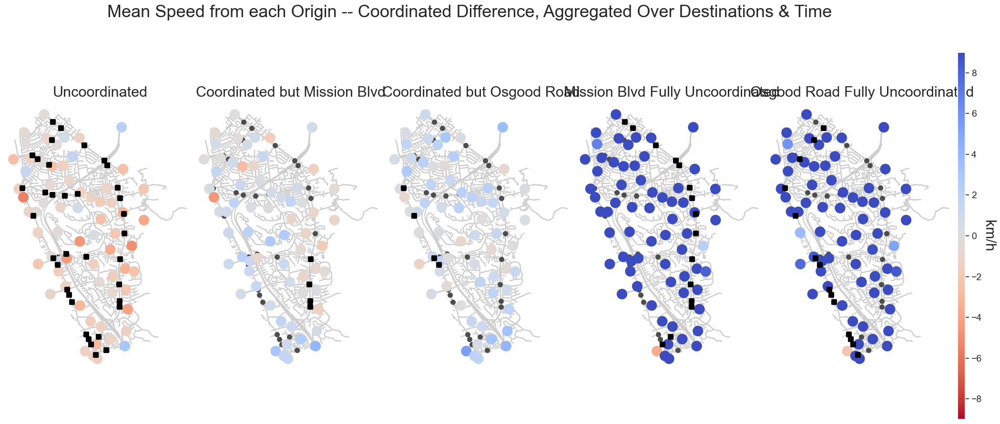

Mean Travel Time
Metric: ttime (s) | Uncoordinated: 411.0690006243823 | Fully Coordinated: 398.46143887661856
Metric: ttime (s) | Coordinated but Mission Blvd: 389.97623369723914 | Fully Coordinated: 398.46143887661856
Metric: ttime (s) | Coordinated but Osgood Road: 368.0131797587156 | Fully Coordinated: 398.46143887661856
Metric: ttime (s) | Mission Blvd Fully Uncoordinated: 490.5851238629155 | Fully Coordinated: 398.46143887661856
Metric: ttime (s) | Osgood Road Fully Uncoordinated: 542.503523661105 | Fully Coordinated: 398.46143887661856


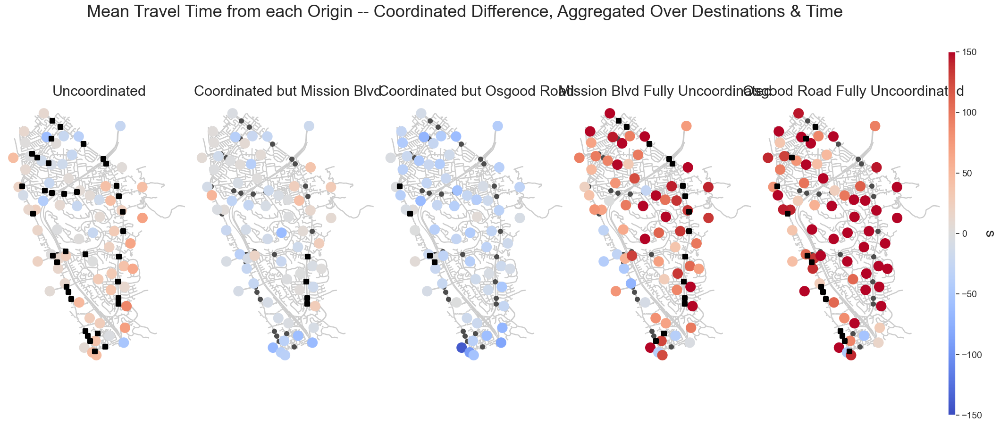

Mean Delay Time
Metric: dtime (s) | Uncoordinated: 183.50679288360695 | Fully Coordinated: 171.93358147919238
Metric: dtime (s) | Coordinated but Mission Blvd: 166.0913098312606 | Fully Coordinated: 171.93358147919238
Metric: dtime (s) | Coordinated but Osgood Road: 150.26627575431618 | Fully Coordinated: 171.93358147919238
Metric: dtime (s) | Mission Blvd Fully Uncoordinated: 185.01027343372348 | Fully Coordinated: 171.93358147919238
Metric: dtime (s) | Osgood Road Fully Uncoordinated: 233.21375835619864 | Fully Coordinated: 171.93358147919238


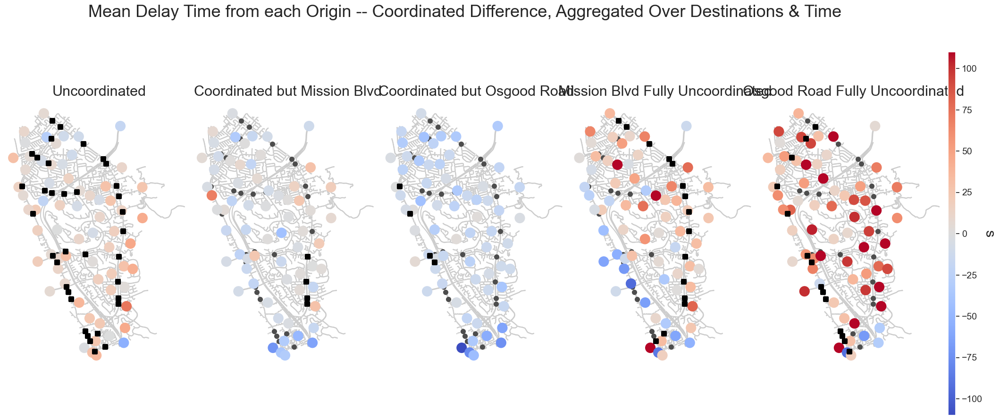

Mean Travel Distance
Metric: mean_dist (km) | Uncoordinated: 3.755252321219801 | Fully Coordinated: 3.7431433886747434
Metric: mean_dist (km) | Coordinated but Mission Blvd: 3.7625593167580935 | Fully Coordinated: 3.7431433886747434
Metric: mean_dist (km) | Coordinated but Osgood Road: 3.6851911613229626 | Fully Coordinated: 3.7431433886747434
Metric: mean_dist (km) | Mission Blvd Fully Uncoordinated: 5.993402855016897 | Fully Coordinated: 3.7431433886747434
Metric: mean_dist (km) | Osgood Road Fully Uncoordinated: 6.070351946484195 | Fully Coordinated: 3.7431433886747434


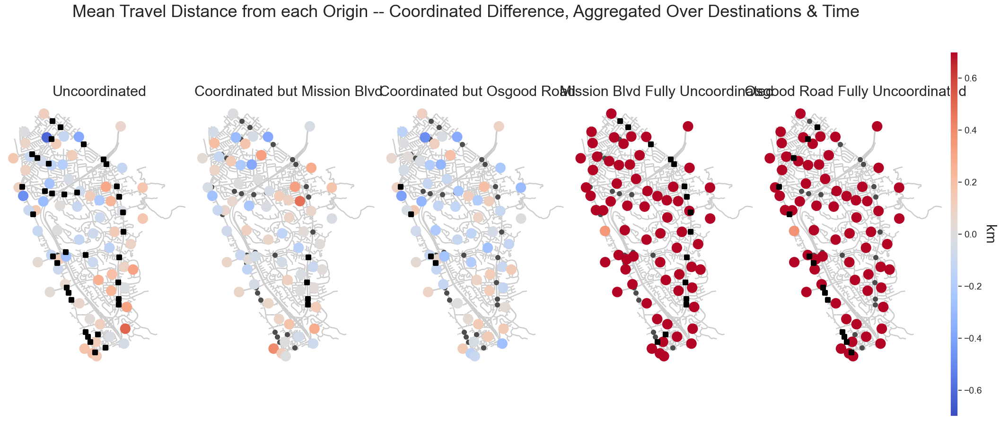

In [ ]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def od_plot(metric, which, compare_to):
    vmin, vmax = None, None
    cmap = 'coolwarm'
    if metric == 'speed':
        vmin, vmax = -9, 9
        cmap = 'coolwarm_r'
    if metric == 'ttime':
        vmin, vmax = -150, 150
    if metric == 'dtime':
        vmin, vmax = -110, 110
    if metric == 'mean_dist':
        vmin, vmax = -0.7, 0.7
    metric = od_columns_compare[metric]
    print(metric.desc)
    
    fig, axs = plt.subplots(1, len(which) + 1, figsize=(4*len(which) + 6, 10), gridspec_kw={'width_ratios': [50]*len(which)+[2]})
    fig.suptitle(f'{metric.desc} from each Origin -- Coordinated Difference, Aggregated Over Destinations & Time', size=26)
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(axs[-1], cmap=cmap, norm=norm, orientation='vertical')
    axs[-1].tick_params(labelsize=14)
    axs[-1].set_ylabel(metric.unit, rotation=270, size=22, labelpad=20)

    desc = unpacked_databases_od_mean[compare_to]['desc']
    compare_database = unpacked_databases_od_mean[compare_to]['database']

    for i in range(len(which)):
        ax = axs[i]
        desc = unpacked_databases_od_mean[which[i]]['desc']
        database = unpacked_databases_od_mean[which[i]]['database']
        database = database.join(compare_database, 
            lsuffix='_to_compare', rsuffix='_compare_to').dropna().rename(columns={'geometry_to_compare': 'geometry'})

        database['difference'] = database[f'{metric.name}_to_compare'] - database[f'{metric.name}_compare_to']
        affected_nodes = node_geo_combined[node_geo_combined['id'].isin(databases[which[i]]['uncoordinated_nodes'])]
        
        print(f'Metric: metric.__str__() |', \
            f'{desc}:', database[f'{metric.name}_to_compare'].mean(),
            '| Fully Coordinated:', database[f'{metric.name}_compare_to'].mean())
        
        sections.plot(ax=ax, color='0.8', zorder=0)
        node_geo_combined.plot(ax=ax, color='0.3', lw=2, zorder=1)
        if affected_nodes.shape[0]:
            affected_nodes.plot(ax=ax, color='black', lw=3, zorder=3, marker='s')
        database.plot(ax=ax, column='difference', cmap=cmap, lw=10, vmin=vmin, vmax=vmax, zorder=2)
        ax.set_title(desc, size=22)
        ax.axis('off')

    plt.subplots_adjust(wspace=0)
    save_fig(f'od-{metric.name}-aggregated-combined.png')
    plt.close()

for k in ['speed', 'ttime', 'dtime', 'mean_dist']:
    od_plot(k, to_plot[:-1], to_plot[-1])

### Specific o

Mean speed from each origin to all other destinations, aggregated over time

In [ ]:
unpacked_databases_od_from = unpack_databases('MICENT_O')

for k, v in unpacked_databases_od_from.items():
    desc, df = v['desc'], v['database']
    df = preprocess_od(df)
    df = df.merge(df[['oid', 'eid']].drop_duplicates('oid'), how='left', left_on='destination', right_on='oid', suffixes=['_o', '_d'])
    df.dropna(inplace=True)
    unpacked_databases_od_from[k]['database'] = df

unpacked_databases_od_from

{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'database':            oid_o   eid_o  destination      speed       ttime       dtime  \
  0      151634377   int_0    151635727  92.354351  257.477739   24.204354   
  1      151634377   int_0    151635733  44.388216  317.837200  178.763933   
  2      151634377   int_0    151635745  41.809689  148.246362   66.308671   
  4      151634402   int_1    151635727  51.018652  621.714604  210.039434   
  5      151634402   int_1    151635733  44.971804  510.089946  170.778886   
  ...          ...     ...          ...        ...         ...         ...   
  13380  151635745  ext_10    151635583  39.035977  176.064612   44.026035   
  13381  151635745  ext_10    151635600  39.247670  272.716084  103.902120   
  13382  151635745  ext_10    151635648  55.183013   23.320849    3.579845   
  13383  151635745  ext_10    151635666  38.882711  193.086533   75.910481   
  13384  151635745  ext_10    151635689  38.088003  313.202431  121

In [ ]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def specific_o_d_plot(origin, metric, which, mode=1, show_color_bar=True):
    """
    Plots `metric` across the network for all vehicles with origin `origin`,
    where each dot on the resulting graph represents the value of the metric
    aggregated over all time steps for vehicles with destination at that dot.

    There are two modes:
    `mode` = 'standard': Plots all entries in `which`
    `mode` = 'compare': Uses `which[-1]` as a "comparison" scenario, to 
                        which all other entries in `which` are compared 
                        via difference
    """

    def isolate_origin(name):
        desc = unpacked_databases_od_from[name]['desc']
        database = unpacked_databases_od_from[name]['database']
        database = database[database['eid_o']==origin].groupby('eid_d').mean().reset_index()
        database = database.merge(centroids[['eid', 'geometry']], left_on='eid_d', right_on='eid')
        database = gpd.GeoDataFrame(database[['eid', metric.name, 'geometry']])
        return desc, database

    plot_params = {
        'speed': {
            'standard': {'cmap': 'afmhot', 'vmin': 0, 'vmax': 90},
            'compare': {'cmap': 'coolwarm_r', 'vmin': -6, 'vmax': 6},
        },
        'ttime': {
            'standard': {'cmap': 'afmhot_r', 'vmin': 0, 'vmax': 1200},
            'compare': {'cmap': 'coolwarm', 'vmin': -100, 'vmax': 100},
        },
        'dtime': {
            'standard': {'cmap': 'afmhot_r', 'vmin': 0, 'vmax': 600},
            'compare': {'cmap': 'coolwarm', 'vmin': -60, 'vmax': 60},
        },
        'mean_dist': {
            'standard': {'cmap': 'afmhot_r', 'vmin': 0, 'vmax': 15},
            'compare': {'cmap': 'coolwarm', 'vmin': -1, 'vmax': 1},
        },
    }

    cmap, vmin, vmax = plot_params[metric][mode].values()
    origin_geo = centroids[centroids['eid']==origin]['geometry'].iloc[0]
    origin_geo = gpd.GeoDataFrame({'geometry': [origin_geo]})
    metric = od_columns_compare[metric]
    print(f'{metric.desc} from {origin}')
    if mode == 'compare':
        compare_to_desc, compare_to_database = isolate_origin(which[-1])
        which = which[:-1]

    if show_color_bar:
        fig, axs = plt.subplots(1, len(which) + 1, figsize=(4.5*len(which)+4, 9), gridspec_kw={'width_ratios': [50]*len(which)+[2]})
        fig.suptitle(f'{metric.desc} - {compare_to_desc} Difference from Specific Origin, Aggregated Over Time', size=26)
        norm = Normalize(vmin=vmin, vmax=vmax)
        cb = ColorbarBase(axs[-1], cmap=cmap, norm=norm, orientation='vertical')
        axs[-1].tick_params(labelsize=14)
        axs[-1].set_ylabel(metric.unit, rotation=270, size=22, labelpad=20)
    else:
        fig, axs = plt.subplots(1, len(which), figsize=(4.5*len(which)+4, 9), gridspec_kw={'width_ratios': [50]*len(which)})

    for i in range(len(which)):
        ax = axs[i]
        desc, database = isolate_origin(which[i])
        if mode == 'compare':
            database = database.merge(compare_to_database, on=['eid', 'geometry'], suffixes=['_to_compare', '_compare_to'])
            # kind of bad, but just setting [metric.name] so that the plot command is cleaner later
            database[metric.name] = database[metric.name + '_to_compare'] - database[metric.name + '_compare_to']

        affected_nodes = node_geo_city[node_geo_city['id'].isin(databases[which[i]]['uncoordinated_nodes'])]
        sections.plot(ax=ax, color='0.8', zorder=0)
        node_geo_city.plot(ax=ax, color='0.3', lw=2, zorder=1)
        if affected_nodes.shape[0]:
            affected_nodes.plot(ax=ax, color='black', lw=3, zorder=3, marker='s')
        database.plot(ax=ax, column=metric.name, cmap=cmap, lw=10, vmin=vmin, vmax=vmax, zorder=2)
        origin_geo.plot(ax=ax, color='green', lw=10, zorder=3)
        print(database)
        print(f"{desc} | Mean: {database[metric.name + '_to_compare'].mean()},",
              f"Standard Deviation: {database[metric.name + '_to_compare'].std()}")
        ax.set_title(desc, size=23)
        # ax.set_title(desc, size=21)
        ax.axis('off')
    if mode == 'compare':
        print(f"{compare_to_desc} | Mean: {compare_to_database[metric.name].mean()},",
              f"Standard Deviation: {compare_to_database[metric.name].std()}")

    plt.subplots_adjust(wspace=0)
    save_fig(f'od/{metric.name}/{mode}-{origin}-combined.png')
    plt.close()

for origin in ['ext_9', 'ext_4', 'ext_1', 'ext_6']:   # northeast, southeast, southwest, west
    for k in ['speed', 'ttime', 'dtime', 'mean_dist']:
        specific_o_d_plot(origin, k, to_plot, 'compare')

Mean Speed from ext_9
       eid  speed_to_compare                           geometry  \
0    ext_1         48.961764  POINT (-13573357.287 4507368.344)   
1    ext_2         35.931757  POINT (-13573042.528 4507181.778)   
2    ext_4         84.723652  POINT (-13571810.274 4507565.394)   
3    ext_5         34.038877  POINT (-13574710.931 4509583.600)   
4    ext_6         57.275975  POINT (-13575185.233 4510750.740)   
5    int_0         49.342375  POINT (-13573642.679 4512924.678)   
6    int_1         32.769871  POINT (-13575676.027 4515411.360)   
7   int_11         41.269370  POINT (-13573577.591 4515653.766)   
8   int_12         35.556029  POINT (-13575266.503 4512778.827)   
9   int_16         19.787843  POINT (-13572772.167 4513172.839)   
10  int_17         34.802815  POINT (-13574833.032 4515633.650)   
11  int_18         47.712455  POINT (-13572379.425 4511314.599)   
12  int_19         40.709314  POINT (-13574658.581 4511030.046)   
13   int_2         29.691851  POINT (-13

<a id='trajectory'></a>
# Trajectories

In [ ]:
uncoordinated_trajectory_query = pd.read_sql('SELECT * FROM MIVEHTRAJECTORY', uncoordinated_con)
uncoordinated_trajectory_df = pd.DataFrame(uncoordinated_trajectory_query)

uncoordinated_trajectory_df.head()

In [ ]:
uncoordinated_trajectory_df

In [ ]:
uncoordinated_detailed_trajectory_query = pd.read_sql('SELECT * FROM MIVEHDETAILEDTRAJECTORY', uncoordinated_con)
uncoordinated_detailed_trajectory_df = pd.DataFrame(uncoordinated_detailed_trajectory_query)

uncoordinated_detailed_trajectory_df.head()

In [ ]:
uncoordinated_trajectory_df.head()

In [ ]:
coordinated_trajectory_query = pd.read_sql('SELECT * FROM MIVEHTRAJECTORY', coordinated_con)
coordinated_trajectory_df = pd.DataFrame(coordinated_trajectory_query)

coordinated_trajectory_df.head()

In [ ]:
coordinated_detailed_trajectory_query = pd.read_sql('SELECT * FROM MIVEHDETAILEDTRAJECTORY', coordinated_con)
coordinated_detailed_trajectory_df = pd.DataFrame(coordinated_detailed_trajectory_query)

coordinated_detailed_trajectory_df.head()

In [ ]:
def od_demand(df):
    return df.groupby(['origin', 'destination']).size().reset_index(name='freq').sort_values(by='freq', ascending=False)

od_demand(uncoordinated_trajectory_df)

In [ ]:
od_demand(coordinated_trajectory_df)

In [ ]:
dfs_traj = {
    'uncoordinated': uncoordinated_detailed_trajectory_df.merge(uncoordinated_trajectory_df, how='left', on='oid'),
    'coordinated': coordinated_detailed_trajectory_df.merge(coordinated_trajectory_df, how='left', on='oid')
}

top_pairs_oid = [
    (151635727, 151635742),
    (151635742, 151635727),
    (151635742, 151635718),
    (151635718, 151635742),
    (151635727, 151635718),
    (151635718, 151635727),
]

dfs_traj_top = {}

def astype_per_column(df, columns, dtype):
    for col in columns:
        df[col] = df[col].astype(dtype)

for k in dfs_traj:
    for p in top_pairs_oid:
        o_oid, d_oid = p
        o_eid = od_df[od_df['oid']==o_oid]['eid_x'].unique()[0]
        d_eid = od_df[od_df['oid']==d_oid]['eid_x'].unique()[0]
        key = f'{o_eid}_{d_eid}_{k}'
        dfs_traj_top[key] = dfs_traj[k][(dfs_traj[k]['origin']==o_oid) & (dfs_traj[k]['destination']==d_oid)]
        astype_per_column(dfs_traj_top[key], ['xCoord', 'yCoord'], float)

dfs_traj_top['ext_4_ext_9_uncoordinated'].head()


In [ ]:
for k, df in dfs_traj_top.items():
    dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)
    print(dfs_traj_top[k].head())

# dfs_traj_top['ext_4_ext_9_uncoordinated'].head()

In [ ]:
node_data = od_df[['eid_x', 'geometry_o']].copy()
node_data = gpd.GeoDataFrame(node_data, geometry='geometry_o')
node_data = node_data.to_crs('EPSG:3857').drop_duplicates()
node_data

In [ ]:
class ODPlot:
    def __init__(self, origin, destination, sample_every_nth, alpha):
        self.origin = origin
        self.destination = destination
        self.sample_every_nth = sample_every_nth
        self.alpha = alpha
    
    def __repr__(self):
        return f'{self.origin}_{self.destination}'

popular_ods = [
    ODPlot('ext_4', 'ext_9', 80, 0.1),
    ODPlot('ext_9', 'ext_4', 80, 0.1),
    ODPlot('ext_9', 'ext_1', 40, 0.1),
    ODPlot('ext_1', 'ext_9', 40, 0.1),
    ODPlot('ext_4', 'ext_1', 10, 0.1),
    ODPlot('ext_1', 'ext_4', 10, 0.1)
]

"""
ODPlot('ext_4', 'ext_9', 10, 0.5),
ODPlot('ext_9', 'ext_4', 30, 0.4),
ODPlot('ext_9', 'ext_1', 60, 0.2),
ODPlot('ext_1', 'ext_9', 50, 0.1),
ODPlot('ext_4', 'ext_1', 15, 0.3),
ODPlot('ext_1', 'ext_4', 15, 0.5)
"""

def point_noise(p, radius):
    dx = np.random.uniform(-radius, radius)
    dy = np.random.uniform(-radius, radius)
    return Point(p.x + dx, p.y + dy)

def plot_routes(data, ax, type, od):
    ax.set_title(type, size=22)
    ax.axis('off')
    data = gpd.GeoDataFrame(data, geometry='geometry').iloc[::od.sample_every_nth, :]
    data.crs = "EPSG:32610"
    data = data.to_crs('EPSG:3857')
    data['geometry'] = data['geometry'].apply(lambda p : point_noise(p, 70))
    origin = node_data[node_data['eid_x']==od.origin]
    destination = node_data[node_data['eid_x']==od.destination]['geometry_o']

    frame.plot(ax=ax, color='0.8', zorder=0)
    data.plot(ax=ax, lw=0.1, alpha=od.alpha, zorder=1)
    origin.plot(ax=ax, color='black', lw=3, zorder=2)
    destination.plot(ax=ax, color='red', lw=3, zorder=2)

for i in range(6):
    od = popular_ods[i]
    fig, axs = plt.subplots(1, 2, figsize=(14, 12), squeeze=False)
    plot_routes(dfs_traj_top[f'{str(od)}_uncoordinated'], axs[0][0], uncoordinated_description, od)
    plot_routes(dfs_traj_top[f'{str(od)}_coordinated'], axs[0][1], coordinated_description, od)
    fig.suptitle(f'Routes {od}', size=26)
    plt.subplots_adjust(wspace=0)
    save_fig(f'routes_{od}.png')
    plt.show()


# Emissions

In [ ]:
uncoordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', uncoordinated_con)
uncoordinated_emissions_df = pd.DataFrame(uncoordinated_emissions_query)

uncoordinated_emissions_df.head()

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,2.749354e+06,0.0,1577.548627,0.0,3830.469273,...,78.739112,0.0,5852.013213,0.0,3.357819,0.0,8.153171,0.0,0.167597,0.0
1,151642198,151642198,None,1,1,7.326504e+05,0.0,481.007896,0.0,1059.753445,...,38.899856,0.0,1559.449725,0.0,1.023827,0.0,2.255690,0.0,0.082799,0.0
2,151642198,151642198,None,2,1,2.016704e+06,0.0,1096.540730,0.0,2770.715828,...,39.839256,0.0,4292.563488,0.0,2.333992,0.0,5.897481,0.0,0.084798,0.0
3,151642198,151642198,None,0,2,4.091769e+06,0.0,2588.799222,0.0,5917.653305,...,148.069969,0.0,8709.349285,0.0,5.510271,0.0,12.595752,0.0,0.315168,0.0
4,151642198,151642198,None,1,2,1.139482e+06,0.0,781.639070,0.0,1694.038238,...,68.443746,0.0,2425.392463,0.0,1.663722,0.0,3.605768,0.0,0.145683,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,151642198,151642198,None,1,24,1.044501e+06,0.0,713.205005,0.0,2462.866146,...,46.008333,0.0,2223.224255,0.0,1.518060,0.0,5.242222,0.0,0.097929,0.0
71,151642198,151642198,None,2,24,2.404059e+06,0.0,1674.123667,0.0,4726.821917,...,64.240091,0.0,5117.049753,0.0,3.563380,0.0,10.061062,0.0,0.136735,0.0
72,151642198,151642198,None,0,0,0.000000e+00,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0
73,151642198,151642198,None,1,0,0.000000e+00,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0


In [ ]:
coordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', coordinated_con)
coordinated_emissions_df = pd.DataFrame(coordinated_emissions_query)

coordinated_emissions_df.head()

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,2.712312e+06,0.0,1546.325642,0.0,3690.773125,...,73.111917,0.0,5773.167849,0.0,3.291361,0.0,7.855827,0.0,0.155619,0.0
1,151642198,151642198,None,1,1,6.909020e+05,0.0,451.292610,0.0,929.713416,...,32.977093,0.0,1470.588035,0.0,0.960578,0.0,1.978899,0.0,0.070192,0.0
2,151642198,151642198,None,2,1,2.021410e+06,0.0,1095.033032,0.0,2761.059709,...,40.134825,0.0,4302.579814,0.0,2.330783,0.0,5.876928,0.0,0.085427,0.0
3,151642198,151642198,None,0,2,4.009013e+06,0.0,2468.822826,0.0,5424.977140,...,133.640905,0.0,8533.202553,0.0,5.254900,0.0,11.547088,0.0,0.284455,0.0
4,151642198,151642198,None,1,2,1.046384e+06,0.0,695.598797,0.0,1428.788531,...,57.778409,0.0,2227.233238,0.0,1.480585,0.0,3.041183,0.0,0.122982,0.0


In [ ]:
dfs_emissions = {'uncoordinated': uncoordinated_emissions_df, 'coordinated': coordinated_emissions_df}
emissions_columns = {
    'CO2': Metric('CO2', 'Carbon Dioxide Emissions', 'g'),
    'NOx': Metric('NOx', 'Carbon Dioxide Emissions', 'g'),
    'VOC': Metric('VOC', 'Carbon Dioxide Emissions', 'g'),
    'PM': Metric('PM', 'Carbon Dioxide Emissions', 'g'),
    # interurban are proportional and thus removed
    # 'CO2_Interurban': Metric('CO2_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    # 'NOx_Interurban': Metric('NOx_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    # 'VOC_Interurban': Metric('VOC_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    # 'PM_Interurban': Metric('PM_Interurban', 'Carbon Dioxide Emissions', 'g/km')
}
emissions_column_names = list(emissions_columns.keys())

def preprocess_emissions(df):
    df = df[(df['sid']==0) & (df['ent']!=0)][emissions_column_names + ['ent']]
    return df

for k, df in dfs_emissions.items():
    dfs_emissions[k] = preprocess_emissions(df)

dfs_emissions['uncoordinated'].head()

,CO2,NOx,VOC,PM,ent
0,2.749354e+06,1577.548627,3830.469273,78.739112,1
3,4.091769e+06,2588.799222,5917.653305,148.069969,2
6,4.351431e+06,2675.414109,6499.735363,157.404664,3
9,4.653101e+06,2882.887328,7103.208832,174.058796,4
12,4.648221e+06,2823.557985,7180.013496,175.902314,5


In [ ]:
emissions_df = dfs_emissions['uncoordinated'][emissions_column_names].join(
    dfs_emissions['coordinated'][emissions_column_names], lsuffix='_uncoordinated', rsuffix='_coordinated')

for metric_name in emissions_column_names:
    emissions_df[f'{metric_name}_ratio'] = emissions_df[f'{metric_name}_coordinated'] / emissions_df[f'{metric_name}_uncoordinated']

emissions_df.head()

,CO2_uncoordinated,NOx_uncoordinated,VOC_uncoordinated,PM_uncoordinated,CO2_coordinated,NOx_coordinated,VOC_coordinated,PM_coordinated,CO2_ratio,NOx_ratio,VOC_ratio,PM_ratio
0,2.749354e+06,1577.548627,3830.469273,78.739112,2.712312e+06,1546.325642,3690.773125,73.111917,0.986527,0.980208,0.963530,0.928534
3,4.091769e+06,2588.799222,5917.653305,148.069969,4.009013e+06,2468.822826,5424.977140,133.640905,0.979775,0.953656,0.916745,0.902552
6,4.351431e+06,2675.414109,6499.735363,157.404664,4.053613e+06,2427.126234,5491.786177,124.469128,0.931559,0.907196,0.844925,0.790759
9,4.653101e+06,2882.887328,7103.208832,174.058796,4.276468e+06,2516.474714,5843.490160,142.075869,0.919058,0.872901,0.822655,0.816252
12,4.648221e+06,2823.557985,7180.013496,175.902314,4.200471e+06,2492.464015,5780.491406,138.224390,0.903673,0.882739,0.805081,0.785802


In [ ]:
emissions_columns

{'CO2': Column(CO2, Carbon Dioxide Emissions, g),
 'NOx': Column(NOx, Carbon Dioxide Emissions, g),
 'VOC': Column(VOC, Carbon Dioxide Emissions, g),
 'PM': Column(PM, Carbon Dioxide Emissions, g)}

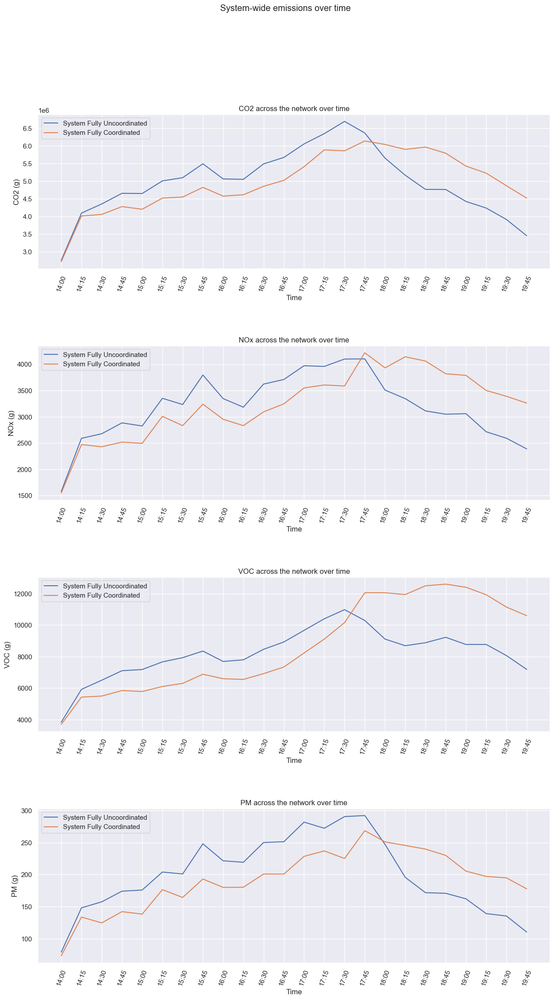

In [ ]:
fig, axs = plt.subplots(4, figsize=(15, 25))
fig.suptitle('System-wide emissions over time')
i = 0
for metric in emissions_columns.values():
    # for j in range(2):
    ax = axs[i]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=coordinated_description)
    ax.set_title(f'{metric.name} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(metric.__str__())
    ax.legend(loc="upper left")
    ax.tick_params('x', labelrotation=70) 
    i += 1

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.show()

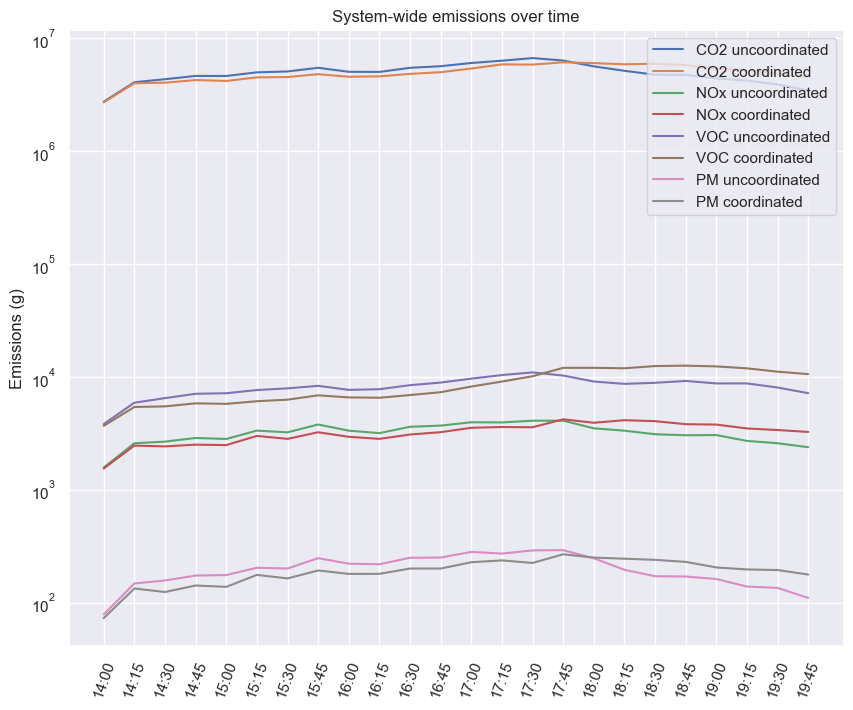

In [ ]:
fig = plt.figure(figsize=(10, 8))
ax = plt.axes()
plt.title('System-wide emissions over time')

for metric in emissions_columns.values():
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=f'{metric.name} uncoordinated')
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=f'{metric.name} coordinated')

ax.tick_params('x', labelrotation=70)
plt.legend(loc='upper right')
plt.yscale('symlog')
plt.ylabel('Emissions (g)')
save_fig('emissions.png')
plt.show()


# fig, axs = plt.subplots(4, figsize=(15, 25))
# fig.suptitle('System-wide emissions over time')
# for i in range(4):
#     # for j in range(2):
#     ax, metric = axs[i], emissions_columns[i][0]
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=coordinated_description)
#     ax.set_title(f'{metric.name} across the network over time')
#     ax.set_xlabel('Time')
#     ax.set_ylabel(f'metric.__str__()')
#     ax.legend(loc="upper left")
#     ax.tick_params('x', labelrotation=70) 

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# plt.show()

### Muliple comparison plots

In [ ]:
unpacked_databases_emissions = unpack_databases('MISYSIEM')
unpacked_databases_emissions

Processed fully_uncoordinated
Processed fully_uncoordinated_run_two
Processed fully_uncoordinated_run_three
Processed fully_uncoordinated_averaged
Processed fully_coordinated
Processed fully_coordinated_run_two
Processed fully_coordinated_run_three
Processed fully_coordinated_averaged
Processed lv_mission_nb


{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'database':     Unnamed: 0        did        oid  eid  sid  ent           CO2  CO2_D  \
  0            0  151642198  151642198  NaN    0    1  2.749354e+06    0.0   
  1            1  151642198  151642198  NaN    1    1  7.326504e+05    0.0   
  2            2  151642198  151642198  NaN    2    1  2.016704e+06    0.0   
  3            3  151642198  151642198  NaN    0    2  4.091769e+06    0.0   
  4            4  151642198  151642198  NaN    1    2  1.139482e+06    0.0   
  ..         ...        ...        ...  ...  ...  ...           ...    ...   
  70          70  151642198  151642198  NaN    1   24  1.044501e+06    0.0   
  71          71  151642198  151642198  NaN    2   24  2.404059e+06    0.0   
  72          72  151642198  151642198  NaN    0    0  0.000000e+00    0.0   
  73          73  151642198  151642198  NaN    1    0  0.000000e+00    0.0   
  74          74  151642198  151642198  NaN    2    0  0.000000e+00

In [ ]:
for k, v in unpacked_databases_emissions.items():
    unpacked_databases_emissions[k]['database'] = preprocess_emissions(v['database'])

unpacked_databases_emissions

{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'database':              CO2          NOx           VOC          PM  ent
  0   2.749354e+06  1577.548627   3830.469273   78.739112    1
  3   4.091769e+06  2588.799222   5917.653305  148.069969    2
  6   4.351431e+06  2675.414109   6499.735363  157.404664    3
  9   4.653101e+06  2882.887328   7103.208832  174.058796    4
  12  4.648221e+06  2823.557985   7180.013496  175.902314    5
  15  5.006726e+06  3351.003661   7665.366152  204.017048    6
  18  5.098063e+06  3232.772948   7933.030600  201.008799    7
  21  5.492895e+06  3795.134345   8353.266756  248.138640    8
  24  5.062705e+06  3346.028357   7690.814258  221.583747    9
  27  5.050682e+06  3181.846278   7796.682315  219.282081   10
  30  5.489121e+06  3622.485086   8465.737017  250.143326   11
  33  5.673344e+06  3709.586587   8930.179170  251.385886   12
  36  6.057212e+06  3972.615431   9669.135706  282.054325   13
  39  6.349933e+06  3958.980534  10406.6952

In [ ]:
for metric in emissions_columns.values():
    fig, ax = plt.subplots(figsize=(10,6))
    print(f'Metric: metric.__str__()')
    for scenario in to_plot:
        scenario_data = unpacked_databases_emissions[scenario]
        ax.plot(TIME_INTERVALS_STRING, scenario_data['database'][metric.name], 
                label=scenario_data['desc'],
                color=plot_colors[scenario]['default'])
        print(f"{scenario_data['desc']}: {scenario_data['database'][metric.name].mean()}")

    plt.title(f'Systemwide {metric.name} Emissions Over Time', size=22)
    ax.tick_params('x', labelrotation=70)
    plt.legend(loc='upper left')
    plt.xlabel('Time', size=16)
    plt.ylabel('Emissions (g)', size=16)
    save_fig(f'emissions/{metric.name}.png')
    plt.close()

Metric: CO2 (g)
System Fully Uncoordinated: 5759929.771341997
System Fully Coordinated: 5769142.719584461
Mission Blvd L/V Coordinated Northbound: 4490365.434711625
Metric: NOx (g)
System Fully Uncoordinated: 8804.494702889066
System Fully Coordinated: 6489.8041767069635
Mission Blvd L/V Coordinated Northbound: 2774.172352185085
Metric: VOC (g)
System Fully Uncoordinated: 9364.918712592294
System Fully Coordinated: 11266.288985255816
Mission Blvd L/V Coordinated Northbound: 6594.531264532166
Metric: PM (g)
System Fully Uncoordinated: 463.2843061344858
System Fully Coordinated: 362.94712511984903
Mission Blvd L/V Coordinated Northbound: 164.12776242581367


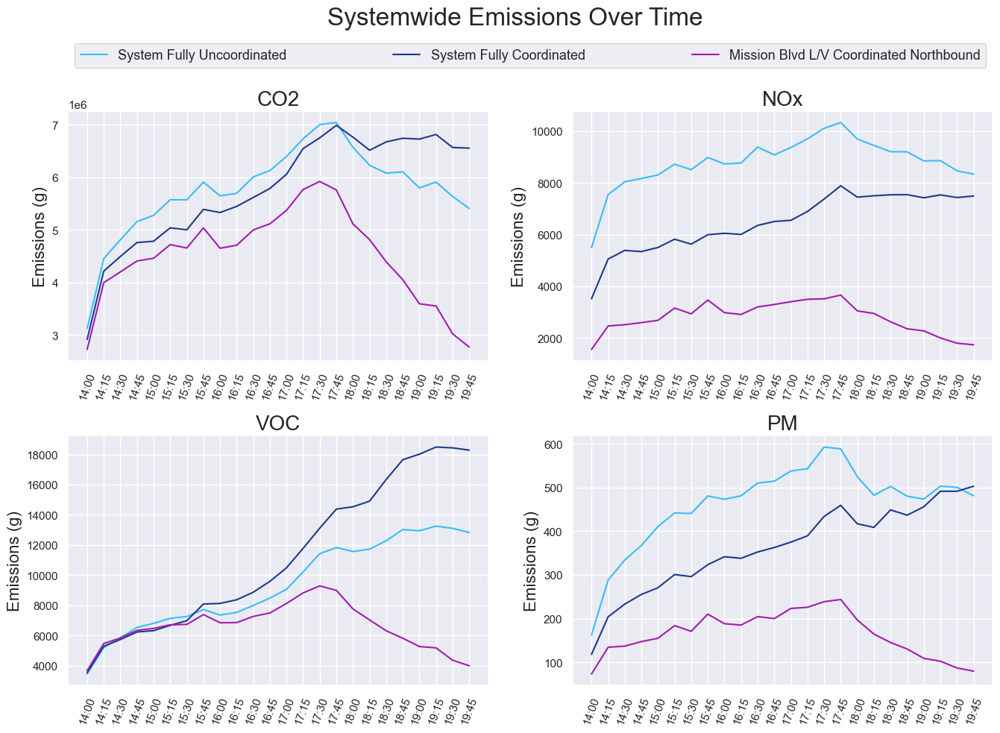

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(16, 10))

for i in range(4):
    ax = axs[i//2][i%2]
    metric = list(emissions_columns.values())[i]
    for scenario in to_plot:
        ax.plot(TIME_INTERVALS_STRING, 
                unpacked_databases_emissions[scenario]['database'][metric.name], 
                label=unpacked_databases_emissions[scenario]['desc'],
                color=plot_colors[scenario]['default'])

    ax.set_title(metric.name, size=20)
    ax.tick_params('x', labelrotation=70)
    # ax.set_xlabel('Time', size=16)
    ax.set_ylabel('Emissions (g)', size=16)

bb = (fig.subplotpars.left, fig.subplotpars.top, 
      fig.subplotpars.right-fig.subplotpars.left, .1)
handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=bb, loc='upper center', mode='expand', ncol=3, prop={'size': 13})
plt.subplots_adjust(hspace=0.3)
plt.suptitle(f'Systemwide Emissions Over Time', size=24, y=1.02)
save_fig('emissions/all.png')
plt.show()

<a id='hcm'></a>
# HCM Trajectory Analysis

* Longitudinal analysis computes for each vehicle in a link during each time step measures, cumulating them for all the time steps required to traverse the link, and then aggregating for all the vehicles that exit from the link during a statistics interval
* Spatial analysis computes for each link and for each lane during each time step measures that involve all the vehicles present, and then aggregating for all the time steps during a statistics interval

In [ ]:
uncoordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', uncoordinated_con)
uncoordinated_hcm_df = pd.DataFrame(uncoordinated_hcm_query)

uncoordinated_hcm_df.head()

,did,oid,eid,sid,ent,density,density_D,los,los_D,queue_delay,...,queued_vehicles,queued_vehicles_D,segment_delay,segment_delay_D,stopped_delay,stopped_delay_D,nbstops,nbstops_D,slow_vehicles,slow_vehicles_D
0,151642198,248,248,0,1,0.780573,-1.0,1.0,-1.0,6.020650,...,1.822222,-1.0,7.703775,3.238408,4.556952,1.385575,0.647367,0.304713,1.0,-1.0
1,151642198,257,257,0,1,32.908216,-1.0,3.0,-1.0,20.352714,...,50.525714,-1.0,21.946461,14.480430,18.148699,14.096548,0.186316,0.123443,53.0,-1.0
2,151642198,757,757,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
3,151642198,761,761,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
4,151642198,302,302,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0


In [ ]:
coordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', coordinated_con)
coordinated_hcm_df = pd.DataFrame(coordinated_hcm_query)

coordinated_hcm_df.head()

,did,oid,eid,sid,ent,density,density_D,los,los_D,queue_delay,...,queued_vehicles,queued_vehicles_D,segment_delay,segment_delay_D,stopped_delay,stopped_delay_D,nbstops,nbstops_D,slow_vehicles,slow_vehicles_D
0,151642198,248,248,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
1,151642198,257,257,0,1,33.050236,-1.0,2.0,-1.0,18.39801,...,46.649841,-1.0,19.744219,14.222321,16.312359,13.524148,0.168761,0.120598,48.0,-1.0
2,151642198,761,761,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
3,151642198,757,757,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
4,151642198,302,302,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0


In [ ]:
dfs_hcm = {'uncoordinated': uncoordinated_hcm_df, 'coordinated': coordinated_hcm_df}
hcm_columns = {
    'density': Metric('density', 'Density of vehicles', 'PCU/km'),
    'los': Metric('los', 'Level of service', None),
    'queue_delay': Metric('queue_delay', 'Queue delay', 's/veh'),
    'queue_length': Metric('queue_length', 'Average queue length', 'veh'),
    'queued_vehicles': Metric('queued_vehicles', 'Percent queued vehicles', '%'),
    'segment_delay': Metric('segment_delay', 'Segment delay', 's/veh'),
    'stopped_delay': Metric('stopped_delay', 'Stopped delay', 's/veh'),
    'nbstops': Metric('nbstops', 'Number of stops', None),
    'slow_vehicles': Metric('slow_vehicles', 'Percent slow vehicles', '%')
}
hcm_column_names = list(hcm_columns.keys())
group_cols = ['ent', 'eid']

def preprocess_hcm(df):
    for k in hcm_column_names:
        df[k] = df[k].astype(float)
    df['density'] = df['density'] * 0.621      # converting to km
    df['los'] = df['los'].astype(int)
    df = df[hcm_column_names + group_cols]
    return df[df['ent']!=0]

for k, df in dfs_hcm.items():
    dfs_hcm[k] = preprocess_hcm(df)

hcm_df = dfs_hcm['uncoordinated'].merge(dfs_hcm['coordinated'], on=group_cols, how='left', suffixes=['_uncoordinated', '_coordinated']).dropna()
hcm_df

,density_uncoordinated,los_uncoordinated,queue_delay_uncoordinated,queue_length_uncoordinated,queued_vehicles_uncoordinated,segment_delay_uncoordinated,stopped_delay_uncoordinated,nbstops_uncoordinated,slow_vehicles_uncoordinated,ent,eid,density_coordinated,los_coordinated,queue_delay_coordinated,queue_length_coordinated,queued_vehicles_coordinated,segment_delay_coordinated,stopped_delay_coordinated,nbstops_coordinated,slow_vehicles_coordinated
0,0.484736,1,6.020650,0.023111,1.822222,7.703775,4.556952,0.647367,1.0,1,248,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
1,20.436002,3,20.352714,1.275556,50.525714,21.946461,18.148699,0.186316,53.0,1,257,20.524197,2,18.398010,1.280889,46.649841,19.744219,16.312359,0.168761,48.0
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,36.661508,4,54.143147,6.624889,75.398818,56.364769,51.262892,0.608747,74.0,24,56150,36.192377,3,21.012780,5.320889,68.509613,23.316151,19.146847,0.431019,68.0
13460,77.548644,5,65.907973,3.723556,84.882565,66.929549,63.708786,0.165673,84.0,24,56433,71.802882,5,59.458151,3.450667,91.656578,60.465783,56.936214,0.191616,91.0
13461,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
13462,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0


In [ ]:
hcm_compare_cols = np.reshape(hcm_column_names.copy(), (3, 3))
hcm_compare_cols

array([['density', 'los', 'queue_delay'],
       ['queue_length', 'queued_vehicles', 'segment_delay'],
       ['stopped_delay', 'nbstops', 'slow_vehicles']], dtype='<U15')

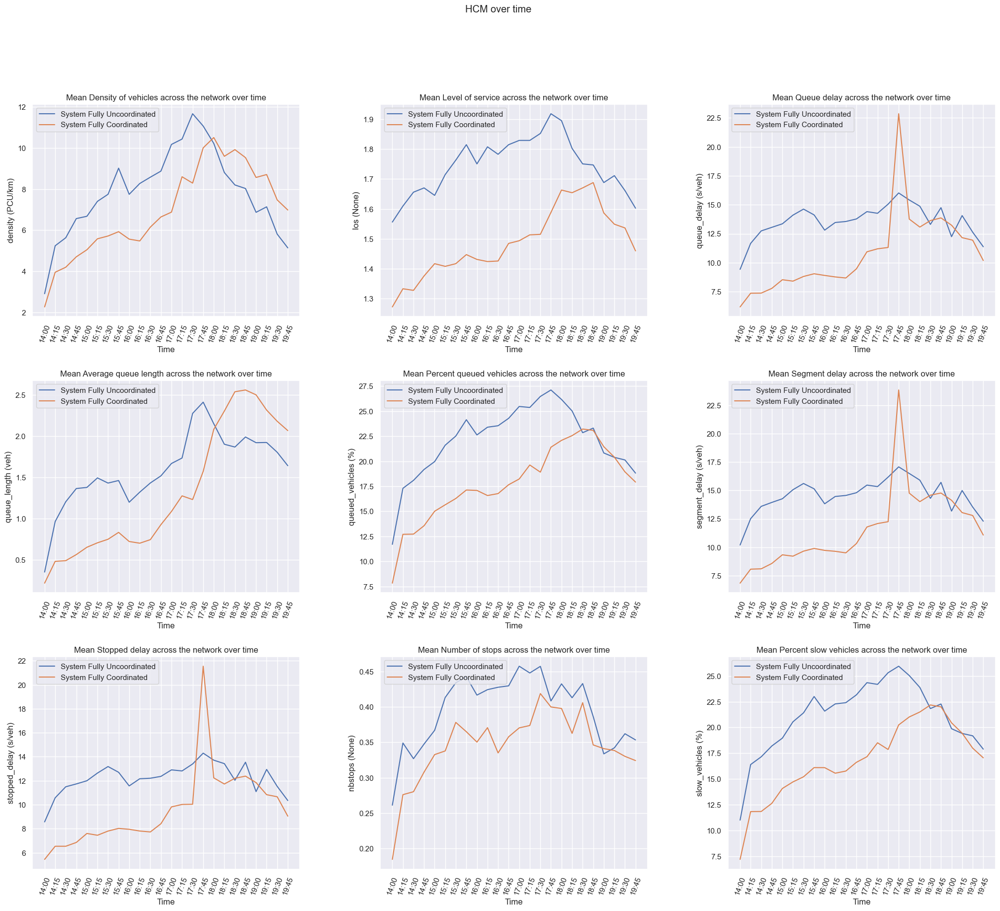

In [ ]:
fig, axs = plt.subplots(3, 3, figsize=(25, 20))
fig.suptitle('HCM over time')
for i in range(3):
    for j in range(3):
        ax, metric = axs[i][j], hcm_columns[hcm_compare_cols[i][j]]
        # if metric.name == 'los':
        #     plt.hist([hcm_df[f'{metric.name}_uncoordinated'], hcm_df[f'{metric.name}_uncoordinated']], 
        #         label=['uncoordinated', 'coordinated'])
        #     ax.legend(loc="upper left")
        # else:
        metric_data = hcm_df[['ent', f'{metric.name}_uncoordinated', f'{metric.name}_coordinated']].groupby('ent').mean()
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_coordinated'], label=coordinated_description)
        ax.set_title(f'Mean {metric.desc} across the network over time')
        ax.set_xlabel('Time')
        ax.set_ylabel(f'metric.__str__()')
        ax.legend(loc="upper left")
        ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

<a id='sys-hcm-patch'></a>
## Patched sys/hcm graphs

In [ ]:
from matplotlib import rcParams as rc

categorical_labels = {
    'los': ['A','B','C','D','E','F']
}

def sys_line_plot(metric, data, ax):
    print(f'Metric: metric.__str__()')
    for scenario, database, label in data:
        print(database.shape)
        ax.plot(TIME_INTERVALS_STRING, 
                database, 
                label=label, 
                color=plot_colors[scenario]['default'])
        print(f'{label}: {database.mean():.2f}, {(2*database.std()):.2f}')
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_xlabel('Time', size=16)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper left')
    ax.tick_params('x', labelrotation=70)

def sys_bar_plot(metric, data, ax):
    """
    metric: Column
    data: List(Tuple(DataFrame, String))
    ax: Axes
    """
    labels = categorical_labels[metric.name]
    width = 1/(len(data)+1)
    x = np.arange(len(labels))
    print(f'Metric: metric.__str__()')
    for i in range(len(data)):
        scenario, database, label = data[i]
        ax.bar(x + i * width, 
               database.value_counts().sort_index(), 
               width, 
               label=label,
               color=plot_colors[scenario]['default'])
        print(f'{label}:')
        print(database.value_counts().sort_index())
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_xticks(x + (len(data) - 1) * width / 2)
    ax.set_xticklabels(labels)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper right')

# fig, axs = plt.subplots(4, 3, figsize=(25, 25))
# fig.suptitle('Mean system-wide metrics over time')

sys_hcm_columns = [
    hcm_columns['density'],
    sys_metrics['flow'],
    sys_metrics['ttime'],
    sys_metrics['speed'],
    sys_metrics['fuelc'],
    sys_metrics['batteryc'],
    sys_metrics['travel'],
    hcm_columns['los'],
    hcm_columns['queue_delay'],
    hcm_columns['queue_length'],
    hcm_columns['queued_vehicles'],
    hcm_columns['nbstops'],
    # hcm_columns['slow_vehicles']
]

# sys_hcm_columns = np.reshape(sys_hcm_columns, (4, 3))
# 
# for i in range(4):
#     for j in range(3):
#         ax, metric = axs[i][j], sys_hcm_columns[i][j]
#         if metric.name == 'los':
#             data_uncoordinated = (hcm_df[f'{metric.name}_uncoordinated'], uncoordinated_description)
#             data_coordinated = (hcm_df[f'{metric.name}_coordinated'], coordinated_description)
#             sys_bar_plot(metric, [data_uncoordinated, data_coordinated], ax)
#         elif metric.name in hcm_columns:
#             data = hcm_df[['ent', f'{metric.name}_uncoordinated', \
#                 f'{metric.name}_coordinated']].groupby('ent').mean()
#             # print(data)
#             data_uncoordinated = (data[f'{metric.name}_uncoordinated'], uncoordinated_description)
#             data_coordinated = (data[f'{metric.name}_coordinated'], coordinated_description)
#             sys_line_plot(metric, [data_uncoordinated, data_coordinated], ax)
#         else:
#             data_uncoordinated = (sys_df[f'{metric.name}_uncoordinated'], uncoordinated_description)
#             data_coordinated = (sys_df[f'{metric.name}_coordinated'], coordinated_description)
#             sys_line_plot(metric, [data_uncoordinated, data_coordinated], ax)

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# save_fig('misc/sys_hcm.png')
# plt.show()

## Multiple comparison plots

In [ ]:
unpacked_databases_sys = unpack_databases('MISYS', preprocess_sys)
unpacked_databases_sys

Processed fully_uncoordinated
Processed fully_uncoordinated_run_two
Processed fully_uncoordinated_run_three
Processed fully_uncoordinated_averaged
Processed fully_coordinated
Processed fully_coordinated_run_two
Processed fully_coordinated_run_three
Processed fully_coordinated_averaged
Processed lv_mission_nb


{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'database':           did        oid  eid  sid  ent   density  density_D     flow  flow_D  \
  0   151642198  151642198  NaN    0    1  1.761359       -1.0   8440.0    -1.0   
  1   151642198  151642198  NaN    0    2  2.734878       -1.0  13840.0    -1.0   
  2   151642198  151642198  NaN    0    3  2.998710       -1.0  14896.0    -1.0   
  3   151642198  151642198  NaN    0    4  3.283599       -1.0  15280.0    -1.0   
  4   151642198  151642198  NaN    0    5  3.323521       -1.0  15348.0    -1.0   
  5   151642198  151642198  NaN    0    6  3.578332       -1.0  16212.0    -1.0   
  6   151642198  151642198  NaN    0    7  3.671238       -1.0  15784.0    -1.0   
  7   151642198  151642198  NaN    0    8  3.904245       -1.0  16728.0    -1.0   
  8   151642198  151642198  NaN    0    9  3.578512       -1.0  16304.0    -1.0   
  9   151642198  151642198  NaN    0   10  3.625641       -1.0  15272.0    -1.0   
  10  151642

In [ ]:
unpacked_databases_hcm = unpack_databases('HCMMIAPPROACH')
unpacked_databases_hcm

Processed fully_uncoordinated
Processed fully_uncoordinated_run_two
Processed fully_uncoordinated_run_three
Processed fully_uncoordinated_averaged
Processed fully_coordinated
Processed fully_coordinated_run_two
Processed fully_coordinated_run_three
Processed fully_coordinated_averaged
Processed lv_mission_nb


{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'database':              did    oid    eid  sid  ent     density  density_D  los  los_D  \
  0      151642198    248    248    0    1    0.780573       -1.0  1.0   -1.0   
  1      151642198    257    257    0    1   32.908216       -1.0  3.0   -1.0   
  2      151642198    757    757    0    1    0.000000       -1.0  1.0   -1.0   
  3      151642198    761    761    0    1    0.000000       -1.0  1.0   -1.0   
  4      151642198    302    302    0    1    0.000000       -1.0  1.0   -1.0   
  ...          ...    ...    ...  ...  ...         ...        ...  ...    ...   
  13970  151642198  56150  56150    0    0  125.462034       -1.0  5.0   -1.0   
  13971  151642198  56433  56433    0    0  215.726970       -1.0  6.0   -1.0   
  13972  151642198  56544  56544    0    0    0.000000       -1.0  1.0   -1.0   
  13973  151642198  62332  62332    0    0    0.000000       -1.0  1.0   -1.0   
  13974  151642198  62345  62345  

In [ ]:
for unpacked in [unpacked_databases_hcm, unpacked_databases_sys]:
    for k, v in unpacked.items():
        unpacked[k]['database'] = v['database'][(v['database']['ent']!=0) & (v['database']['sid']==0)]

for k, v in unpacked_databases_hcm.items():
    unpacked_databases_hcm[k]['database'] = v['database'][v['database']['density']>0]

Metric: density (PCU/km)
(24,)
System Fully Uncoordinated: 16.99, 7.67
(24,)
System Fully Coordinated: 16.77, 10.34
(24,)
Mission Blvd L/V Coordinated Northbound: 11.36, 5.37
fully_uncoordinated_averaged 72
fully_coordinated_averaged 72
lv_mission_nb 24
Metric: flow (veh/h)
(72,)


ValueError: x and y must have same first dimension, but have shapes (24,) and (72,)

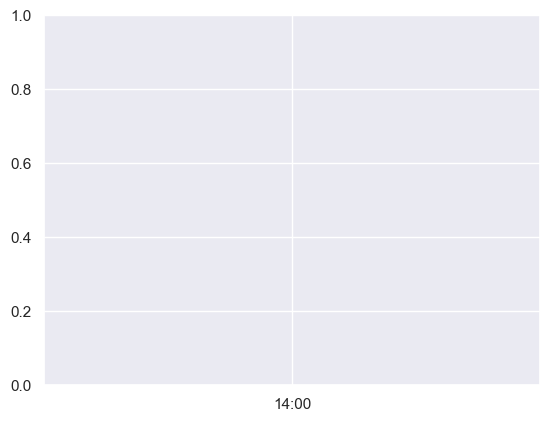

In [ ]:
for metric in sys_hcm_columns:
    fig, ax = plt.subplots(1, 1)
    if metric.name == 'los':
        data = [(
            scenario,
            unpacked_databases_hcm[scenario]['database'][metric.name].astype(int),
            unpacked_databases_hcm[scenario]['desc']
        ) for scenario in to_plot]
        sys_bar_plot(metric, data, ax)
    elif metric.name in hcm_columns:
        data = [(
            scenario,
            unpacked_databases_hcm[scenario]['database'].groupby('ent').mean()[metric.name],
            unpacked_databases_hcm[scenario]['desc']
        ) for scenario in to_plot]
        sys_line_plot(metric, data, ax)
    else:
        data = [(
            scenario,
            unpacked_databases_sys[scenario]['database'][metric.name],
            unpacked_databases_sys[scenario]['desc']
        ) for scenario in to_plot]
        for scenario, database, _ in data:
            print(scenario, len(database))
        sys_line_plot(metric, data, ax)

    save_fig(f'sys_hcm/{metric.name}.png')
    plt.close()

<a id='rgap'></a>
# RGap

I'm not sure exactly how this works, but I'm assuming that data is collected every minute (due to 361 rows in 6 hours).

In [ ]:
uncoordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', uncoordinated_con)
uncoordinated_rgap_df = pd.DataFrame(uncoordinated_rgap_query)

uncoordinated_rgap_df.head()

,did,oid,eid,sid,ent,rgapInstantaneous,rgapInstantaneous_D,rgapExperienced,rgapExperienced_D
0,151642198,151642198,None,0,1,0.015156,-1.0,0.028925,-1.0
1,151642198,151642198,None,0,2,0.010300,-1.0,0.013293,-1.0
2,151642198,151642198,None,0,3,0.018570,-1.0,0.028244,-1.0
3,151642198,151642198,None,0,4,0.010625,-1.0,0.016442,-1.0
4,151642198,151642198,None,0,5,0.012213,-1.0,0.010976,-1.0


In [ ]:
coordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', coordinated_con)
coordinated_rgap_df = pd.DataFrame(coordinated_rgap_query)

coordinated_rgap_df.head()

,did,oid,eid,sid,ent,rgapInstantaneous,rgapInstantaneous_D,rgapExperienced,rgapExperienced_D
0,151642198,151642198,None,0,1,0.012938,-1.0,0.012101,-1.0
1,151642198,151642198,None,0,2,0.014063,-1.0,0.013460,-1.0
2,151642198,151642198,None,0,3,0.012677,-1.0,0.018196,-1.0
3,151642198,151642198,None,0,4,0.007353,-1.0,0.011982,-1.0
4,151642198,151642198,None,0,5,0.006526,-1.0,0.003027,-1.0


In [ ]:
dfs_rgap= {'uncoordinated': uncoordinated_rgap_df, 'coordinated': coordinated_rgap_df}
rgap_columns = {
    'rgapInstantaneous': Metric('rgapInstantaneous', 'Instantaneous Relative Gap', None),
    'rgapExperienced': Metric('rgapExperienced', 'Experienced Relative Gap', None)
}

for k, df in dfs_rgap.items():
    df = df[df['ent']!=0]
    dfs_rgap[k] = df[rgap_columns.keys()]

rgap_df = dfs_rgap['uncoordinated'].join(dfs_rgap['coordinated'], lsuffix='_uncoordinated', rsuffix='_coordinated')
rgap_df

,rgapInstantaneous_uncoordinated,rgapExperienced_uncoordinated,rgapInstantaneous_coordinated,rgapExperienced_coordinated
0,0.015156,0.028925,0.012938,0.012101
1,0.010300,0.013293,0.014063,0.013460
2,0.018570,0.028244,0.012677,0.018196
3,0.010625,0.016442,0.007353,0.011982
4,0.012213,0.010976,0.006526,0.003027
...,...,...,...,...
355,0.040149,0.030278,0.808581,0.081233
356,0.098089,0.089092,0.483354,0.086924
357,0.354563,0.321103,0.131119,0.280918
358,0.090418,0.076703,0.228681,0.164343


In [ ]:
metric_name, metric_units = 'Relative gap', 's'
uncoordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

coordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    coordinated_simulation_results_database, TIME_INTERVALS)

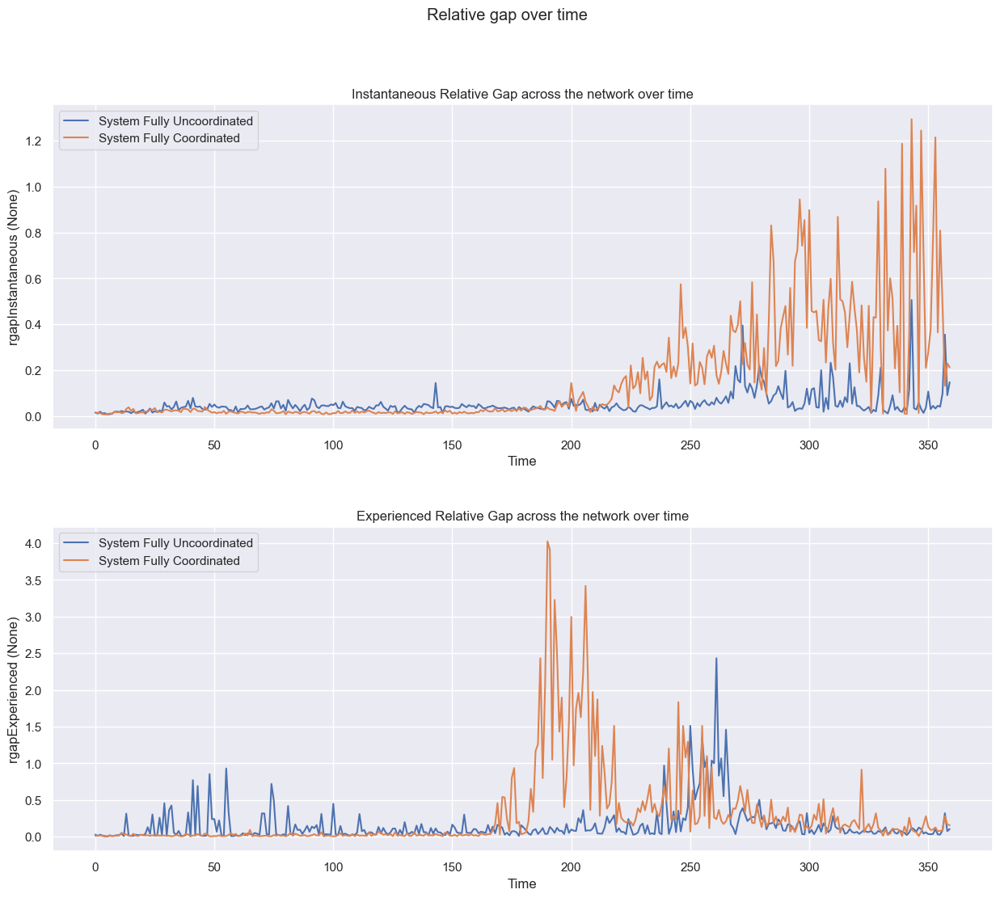

In [ ]:
fig, axs = plt.subplots(2, figsize=(15, 12))
fig.suptitle('Relative gap over time')
for i in range(2):
    ax, metric = axs[i], rgap_columns[list(rgap_columns.keys())[i]]
    ax.plot(rgap_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
    ax.plot(rgap_df[f'{metric.name}_coordinated'], label=coordinated_description)
    ax.set_title(f'{metric.desc} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'metric.__str__()')
    ax.legend(loc="upper left")
    # ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
save_fig('misc/rgap.png')
plt.show()


# plt.xlabel("Timestep")
# plt.ylabel(f"{metric_name} ({metric_units})")
# plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label=uncoordinated_description)
# plt.plot(TIME_INTERVALS_STRING, coordinated_simulated_metric_values, label=coordinated_description)
# plt.legend(loc="upper left")
# plt.xticks(rotation=70)
# plt.show()

### Multiple comparison

In [ ]:
unpacked_databases_rgap = unpack_databases('Rgap')
unpacked_databases_rgap

100%|██████████| 9/9 [00:00<00:00, 63.31it/s, scenario=lv_mission_nb]                


{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'database':            did        oid  eid  sid  ent  rgapInstantaneous  \
  0    151642198  151642198  NaN    0    1           0.015156   
  1    151642198  151642198  NaN    0    2           0.010300   
  2    151642198  151642198  NaN    0    3           0.018570   
  3    151642198  151642198  NaN    0    4           0.010625   
  4    151642198  151642198  NaN    0    5           0.012213   
  ..         ...        ...  ...  ...  ...                ...   
  356  151642198  151642198  NaN    0  357           0.098089   
  357  151642198  151642198  NaN    0  358           0.354563   
  358  151642198  151642198  NaN    0  359           0.090418   
  359  151642198  151642198  NaN    0  360           0.147040   
  360  151642198  151642198  NaN    0    0           0.000000   
  
       rgapInstantaneous_D  rgapExperienced  rgapExperienced_D  
  0                   -1.0         0.028925               -1.0  
  1         

In [ ]:
for k, v in unpacked_databases_rgap.items():
    df = v['database']
    df = df[df['ent']!=0]
    unpacked_databases_rgap[k]['database'] = df[rgap_columns.keys()]

unpacked_databases_rgap

{'fully_uncoordinated': {'desc': 'System Fully Uncoordinated',
  'database':      rgapInstantaneous  rgapExperienced
  0             0.015156         0.028925
  1             0.010300         0.013293
  2             0.018570         0.028244
  3             0.010625         0.016442
  4             0.012213         0.010976
  ..                 ...              ...
  355           0.040149         0.030278
  356           0.098089         0.089092
  357           0.354563         0.321103
  358           0.090418         0.076703
  359           0.147040         0.105648
  
  [360 rows x 2 columns]},
 'fully_uncoordinated_run_two': {'desc': 'System Fully Uncoordinated',
  'database':      rgapInstantaneous  rgapExperienced
  0             0.011412         0.019871
  1             0.009139         0.017640
  2             0.015469         0.010287
  3             0.011403         0.011063
  4             0.012010         0.011107
  ..                 ...              ...
  355         

fully_uncoordinated_averaged rgapInstantaneous: 0.06313810142024451, 0.04011340498497604
fully_coordinated_averaged rgapInstantaneous: 0.16318220093337543, 0.12743519370829465
lv_mission_nb rgapInstantaneous: 0.02557895460114296, 0.010919948844535109
fully_uncoordinated_averaged rgapExperienced: 0.2685339938610989, 0.2386541725723902
fully_coordinated_averaged rgapExperienced: 0.44173145838603545, 0.45578135638701095
lv_mission_nb rgapExperienced: 0.06703512647266809, 0.04574588970324203


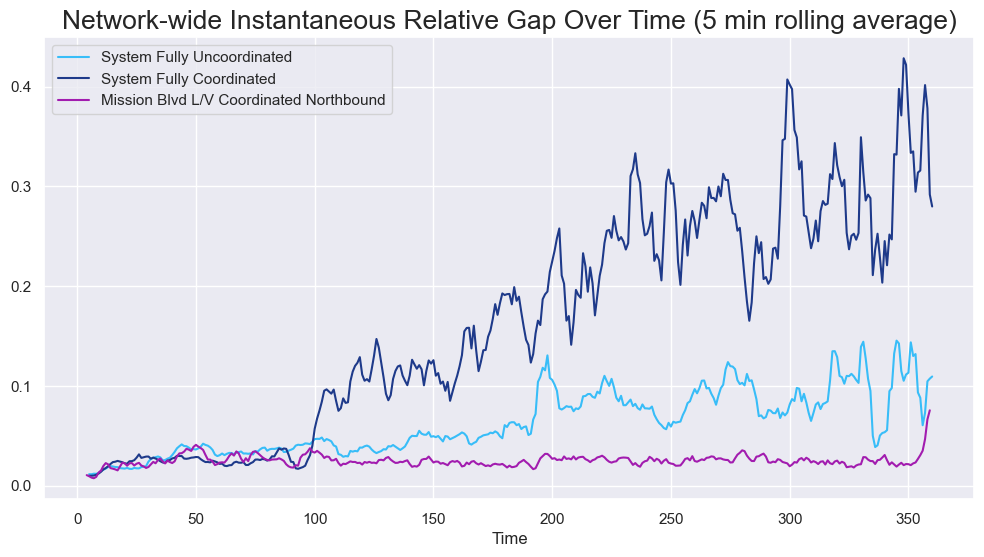

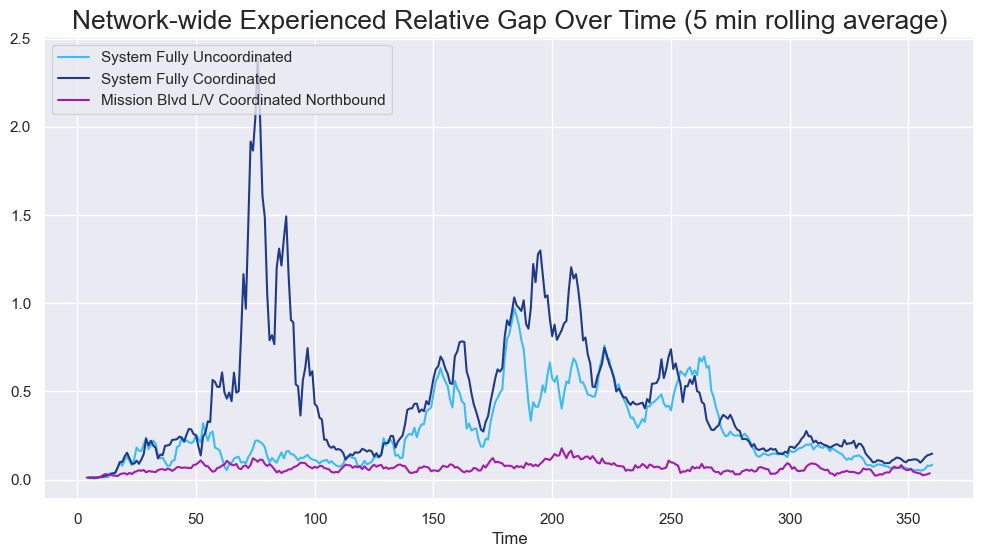

In [ ]:
for metric in ['rgapInstantaneous', 'rgapExperienced']:
    fig, ax = plt.subplots(figsize=(12, 6))
    for scenario in to_plot:
        data = unpacked_databases_rgap[scenario]['database'][metric]
        print(f'{scenario} {metric}: {data.mean()}, {data.std()}')
        ax.plot(data.rolling(window=5).mean(), 
                label=unpacked_databases_rgap[scenario]['desc'],
                color=plot_colors[scenario]['default'])
    plt.title(f'Network-wide {rgap_columns[metric].desc} Over Time (5 min rolling average)', size=19)
    plt.xlabel('Time')
    plt.legend(loc='upper left')
    save_fig(f'rgap/{metric}')
    
plt.show()